**IMPORTS + CONFIGURATION**

In [ ]:
# Core
import os
import time
import math
import random
import warnings

# Data handling
import numpy as np
import pandas as pd

# Visualisation
import matplotlib.pyplot as plt
import seaborn as sns

# Scikit-learn
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import IsolationForest

# Deep learning
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset

# Display settings
pd.set_option("display.max_columns", None)
pd.set_option("display.width", 200)
warnings.filterwarnings("ignore")


# GLOBAL RANDOM SEED

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)


# FILE PATH
# Use local path instead of Google Colab
DATA_PATH = "../data/raw/nasa_power_daily_raw.csv"


# EXPERIMENT CONFIGURATION

TRAIN_END_YEAR = 2020
TEST_START_YEAR = 2021

ROLL_WINDOWS = [7, 30]
LAGS = [1, 3, 7]

SEQUENCE_LENGTH = 30
BATCH_SIZE = 64
BASELINE_LSTM_EPOCHS = 30
TUNED_LSTM_EPOCHS = 40
LEARNING_RATE = 0.001


# RAW CLIMATE COLUMNS

RAW_FEATURES = [
    "T2M",
    "T2M_MAX",
    "T2M_MIN",
    "PRECTOTCORR",
    "RH2M",
    "WS2M"
]

# VARIABLES USED FOR ROLLING + LAG FEATURES

ROLLING_BASE_FEATURES = [
    "T2M_deseasonal",
    "PRECTOTCORR",
    "RH2M",
    "WS2M"
]


# DEVICE

DEVICE = torch.device(
    "cuda" if torch.cuda.is_available()
    else "mps" if torch.backends.mps.is_available()
    else "cpu"
)

print("Setup completed successfully.")
print(f"Using device: {DEVICE}")
print(f"Dataset path: {DATA_PATH}")
print(f"Train end year: {TRAIN_END_YEAR}")
print(f"Test start year: {TEST_START_YEAR}")
print(f"Rolling windows: {ROLL_WINDOWS}")
print(f"Lags: {LAGS}")
print(f"LSTM sequence length: {SEQUENCE_LENGTH}")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Setup completed successfully.
Using device: cuda
Dataset path: /content/drive/MyDrive/datasets/nasa_power_daily_raw.csv
Train end year: 2020
Test start year: 2021
Rolling windows: [7, 30]
Lags: [1, 3, 7]
LSTM sequence length: 30


**data loading + initial inspection.**

In [ ]:
# Load dataset
df = pd.read_csv(DATA_PATH)

print("Dataset loaded successfully.")
print(f"Shape: {df.shape}")
print("\nColumns:")
print(df.columns.tolist())

# Convert date column
df["date"] = pd.to_datetime(df["date"], errors="coerce")

# Basic structure check
print("\nData types:")
print(df.dtypes)

print("\nFirst 5 rows:")
print(df.head())

print("\nLast 5 rows:")
print(df.tail())

# Missing values
print("\nMissing values per column:")
print(df.isna().sum())

print("\nMissing value percentage per column:")
print((df.isna().mean() * 100).round(2))

# Duplicate check
duplicate_count = df.duplicated().sum()
print(f"\nDuplicate rows: {duplicate_count}")

# Date range
print("\nDate range:")
print(f"Start date: {df['date'].min()}")
print(f"End date:   {df['date'].max()}")

# City-level overview
if "city" in df.columns:
    print("\nNumber of cities:", df["city"].nunique())
    print("Cities:")
    print(sorted(df["city"].dropna().unique().tolist()))

    print("\nRows per city:")
    print(df["city"].value_counts().sort_index())

# Numeric summary
numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()

print("\nNumeric columns:")
print(numeric_cols)

print("\nDescriptive statistics for numeric columns:")
print(df[numeric_cols].describe().round(3))

# Check whether required columns exist
required_cols = ["city", "date"] + RAW_FEATURES
missing_required = [col for col in required_cols if col not in df.columns]

if len(missing_required) == 0:
    print("\nAll required columns are present.")
else:
    print("\nMissing required columns:")
    print(missing_required)

# Sort data for time-series consistency
df = df.sort_values(["city", "date"]).reset_index(drop=True)

print("\nData sorted by city and date.")
print("Sorted sample:")
print(df[["city", "date"] + RAW_FEATURES].head(10))

Dataset loaded successfully.
Shape: (12785, 10)

Columns:
['city', 'latitude', 'longitude', 'date', 'T2M', 'T2M_MAX', 'T2M_MIN', 'PRECTOTCORR', 'RH2M', 'WS2M']

Data types:
city                   object
latitude              float64
longitude             float64
date           datetime64[ns]
T2M                   float64
T2M_MAX               float64
T2M_MIN               float64
PRECTOTCORR           float64
RH2M                  float64
WS2M                  float64
dtype: object

First 5 rows:
     city  latitude  longitude       date   T2M  T2M_MAX  T2M_MIN  PRECTOTCORR   RH2M  WS2M
0  London   51.5074    -0.1278 2016-01-01  5.17     7.09     2.47         5.18  94.66  3.94
1  London   51.5074    -0.1278 2016-01-02  8.58     9.52     6.72         3.50  95.32  5.20
2  London   51.5074    -0.1278 2016-01-03  6.55     8.29     4.25        11.59  96.01  4.50
3  London   51.5074    -0.1278 2016-01-04  7.05     8.49     5.85         6.88  95.86  3.68
4  London   51.5074    -0.1278 2016-01

**EDA**

rows per city
city
Birmingham    2557
Bristol       2557
Leeds         2557
London        2557
Manchester    2557
Name: count, dtype: int64


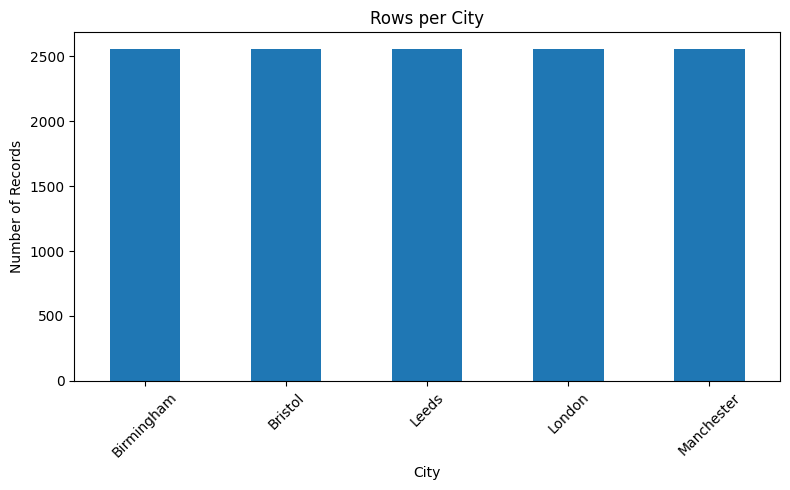

In [ ]:
# rows per city
city_counts = df["city"].value_counts().sort_index()

print("rows per city")
print(city_counts)

plt.figure(figsize=(8, 5))
city_counts.plot(kind="bar")
plt.title("Rows per City")
plt.xlabel("City")
plt.ylabel("Number of Records")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


missing value percentage
city           0.0
latitude       0.0
longitude      0.0
date           0.0
T2M            0.0
T2M_MAX        0.0
T2M_MIN        0.0
PRECTOTCORR    0.0
RH2M           0.0
WS2M           0.0
dtype: float64


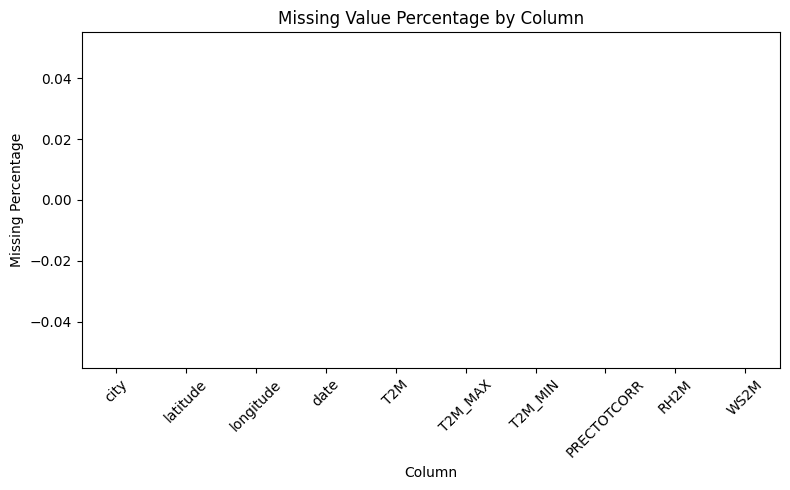

In [ ]:

# missing values percentage
missing_pct = (df.isna().mean() * 100).sort_values(ascending=False)

print("missing value percentage")
print(missing_pct.round(2))

plt.figure(figsize=(8, 5))
missing_pct.plot(kind="bar")
plt.title("Missing Value Percentage by Column")
plt.xlabel("Column")
plt.ylabel("Missing Percentage")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


annual mean temperature
         city  year       T2M
0  Birmingham  2016  9.479945
1  Birmingham  2017  9.850192
2  Birmingham  2018  9.872384
3  Birmingham  2019  9.770329
4  Birmingham  2020  9.978197


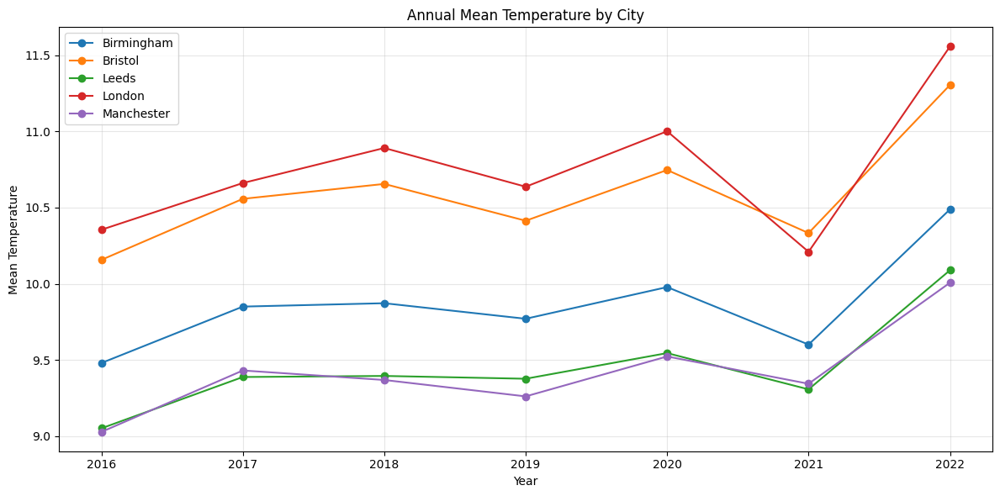

In [ ]:

# annual mean temperature by city
df["year"] = df["date"].dt.year
annual_mean_temp = (
    df.groupby(["city", "year"])["T2M"]
      .mean()
      .reset_index()
)

print("annual mean temperature")
print(annual_mean_temp.head())

plt.figure(figsize=(12, 6))
for city in sorted(annual_mean_temp["city"].unique()):
    city_data = annual_mean_temp[annual_mean_temp["city"] == city]
    plt.plot(city_data["year"], city_data["T2M"], marker="o", label=city)

plt.title("Annual Mean Temperature by City")
plt.xlabel("Year")
plt.ylabel("Mean Temperature")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()



monthly average temperature
         city  month        T2M
0  Birmingham      1   3.645945
1  Birmingham      2   4.553333
2  Birmingham      3   5.967327
3  Birmingham      4   7.977429
4  Birmingham      5  11.781613


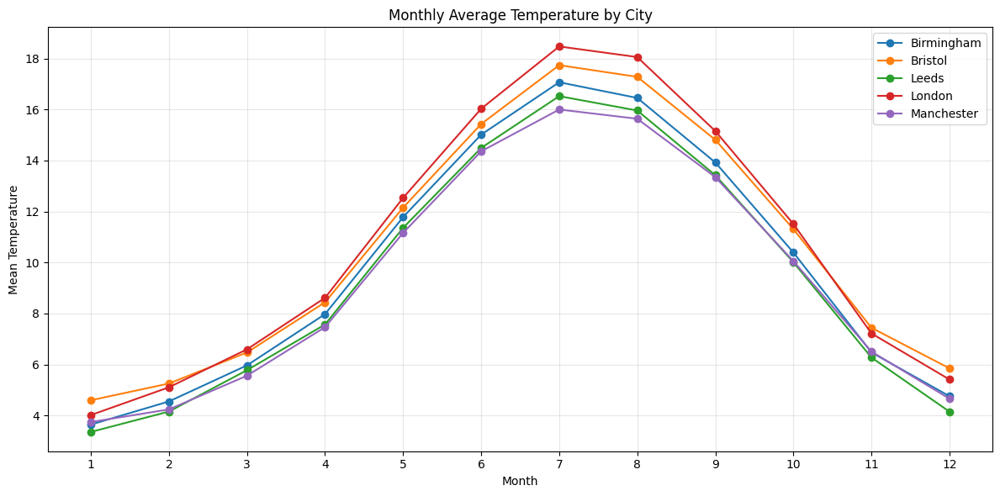

In [ ]:
# monthly average temperature by city
df["month"] = df["date"].dt.month
monthly_mean_temp = (
    df.groupby(["city", "month"])["T2M"]
      .mean()
      .reset_index()
)

print("monthly average temperature")
print(monthly_mean_temp.head())

plt.figure(figsize=(12, 6))
for city in sorted(monthly_mean_temp["city"].unique()):
    city_data = monthly_mean_temp[monthly_mean_temp["city"] == city]
    plt.plot(city_data["month"], city_data["T2M"], marker="o", label=city)

plt.title("Monthly Average Temperature by City")
plt.xlabel("Month")
plt.ylabel("Mean Temperature")
plt.xticks(range(1, 13))
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()




warming change from first to last year
city
London        1.203
Bristol       1.148
Leeds         1.038
Birmingham    1.009
Manchester    0.980
dtype: float64


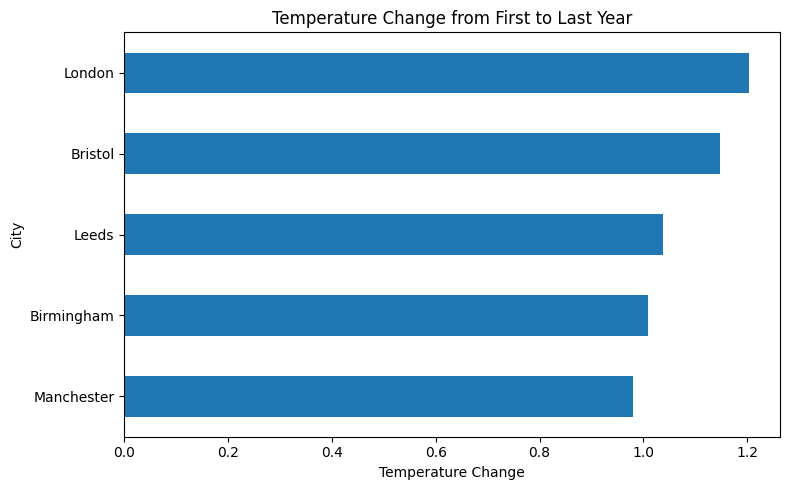

In [ ]:
# annual warming change from first to last year
annual_pivot = annual_mean_temp.pivot(index="city", columns="year", values="T2M")
warming_change = (annual_pivot.iloc[:, -1] - annual_pivot.iloc[:, 0]).sort_values(ascending=False)

print("warming change from first to last year")
print(warming_change.round(3))

plt.figure(figsize=(8, 5))
warming_change.sort_values().plot(kind="barh")
plt.title("Temperature Change from First to Last Year")
plt.xlabel("Temperature Change")
plt.ylabel("City")
plt.tight_layout()
plt.show()

In [ ]:
# monthly climatology table
monthly_climatology = (
    df.groupby(["city", "month"])["T2M"]
      .mean()
      .reset_index()
      .rename(columns={"T2M": "monthly_clim_T2M"})
)

print("monthly climatology")
print(monthly_climatology.head(12))


monthly climatology
          city  month  monthly_clim_T2M
0   Birmingham      1          3.645945
1   Birmingham      2          4.553333
2   Birmingham      3          5.967327
3   Birmingham      4          7.977429
4   Birmingham      5         11.781613
5   Birmingham      6         15.015619
6   Birmingham      7         17.069862
7   Birmingham      8         16.454608
8   Birmingham      9         13.923476
9   Birmingham     10         10.393917
10  Birmingham     11          6.475714
11  Birmingham     12          4.757465


seasonal amplitude by city
city
London        14.454
Birmingham    13.424
Leeds         13.167
Bristol       13.140
Manchester    12.254
Name: monthly_clim_T2M, dtype: float64


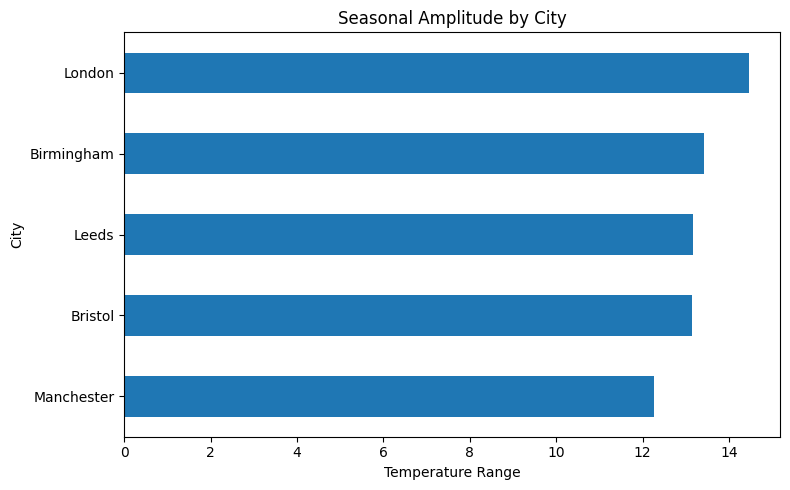

In [ ]:

# seasonal amplitude by city
seasonal_amplitude = (
    monthly_climatology.groupby("city")["monthly_clim_T2M"]
    .apply(lambda x: x.max() - x.min())
    .sort_values(ascending=False)
)

print("seasonal amplitude by city")
print(seasonal_amplitude.round(3))

plt.figure(figsize=(8, 5))
seasonal_amplitude.sort_values().plot(kind="barh")
plt.title("Seasonal Amplitude by City")
plt.xlabel("Temperature Range")
plt.ylabel("City")
plt.tight_layout()
plt.show()


T2M summary
count    12785.000
mean        10.018
std          5.394
min         -4.270
25%          5.830
50%          9.770
75%         14.460
max         25.930
Name: T2M, dtype: float64


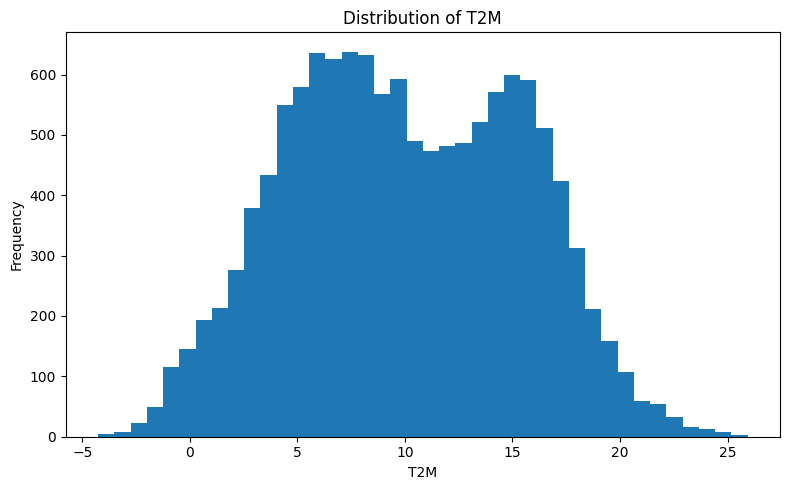

T2M_MAX summary
count    12785.000
mean        13.872
std          6.195
min         -2.310
25%          9.000
50%         13.590
75%         18.800
max         34.530
Name: T2M_MAX, dtype: float64


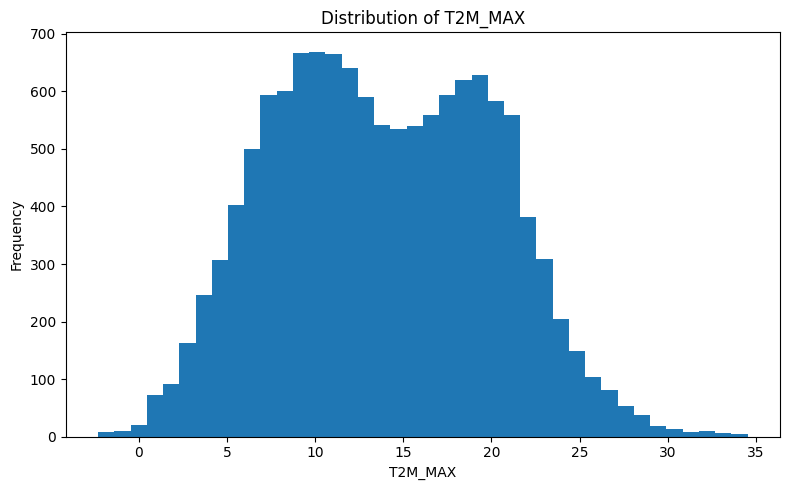

T2M_MIN summary
count    12785.000
mean         6.307
std          4.714
min         -7.020
25%          2.670
50%          6.230
75%         10.060
max         18.900
Name: T2M_MIN, dtype: float64


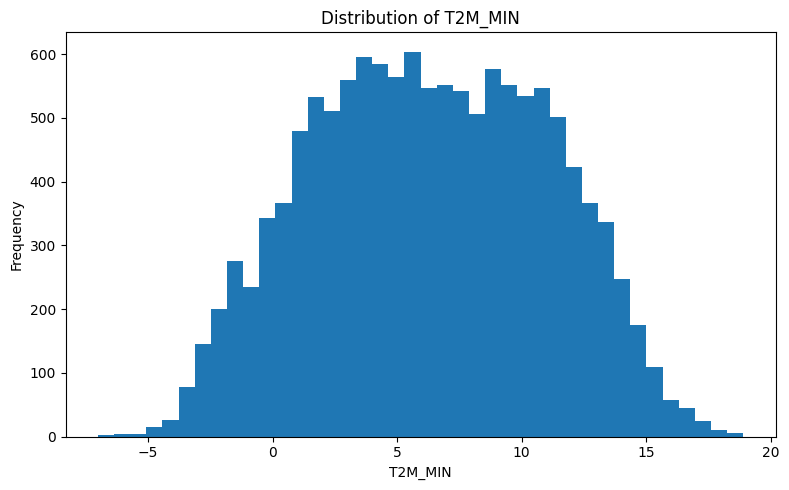

PRECTOTCORR summary
count    12785.000
mean         2.271
std          3.686
min          0.000
25%          0.130
50%          0.680
75%          2.820
max         49.060
Name: PRECTOTCORR, dtype: float64


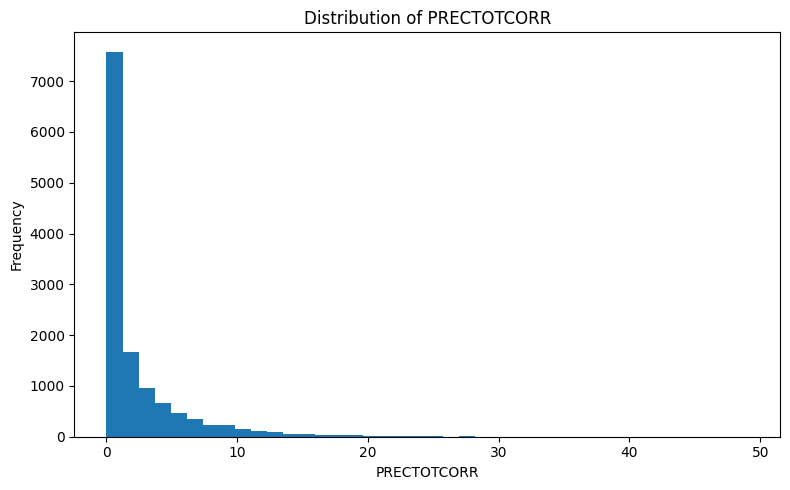

RH2M summary
count    12785.000
mean        86.320
std          7.786
min         51.090
25%         80.780
50%         86.820
75%         92.940
max         99.710
Name: RH2M, dtype: float64


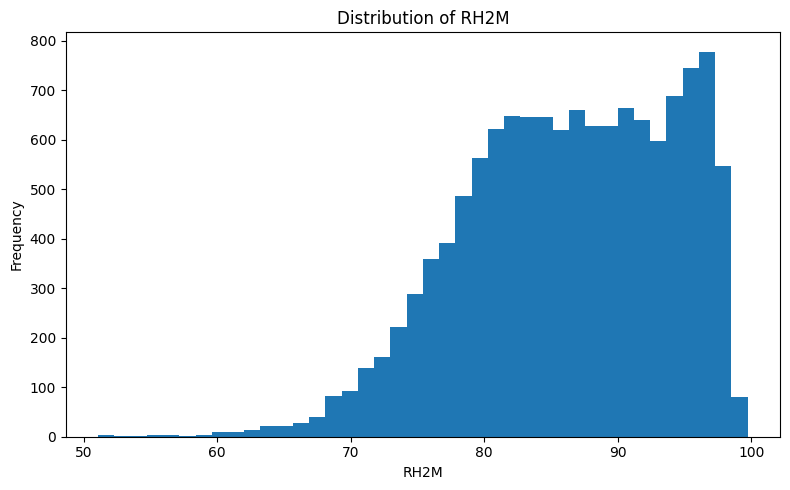

WS2M summary
count    12785.000
mean         3.300
std          1.493
min          0.400
25%          2.180
50%          3.070
75%          4.170
max         11.180
Name: WS2M, dtype: float64


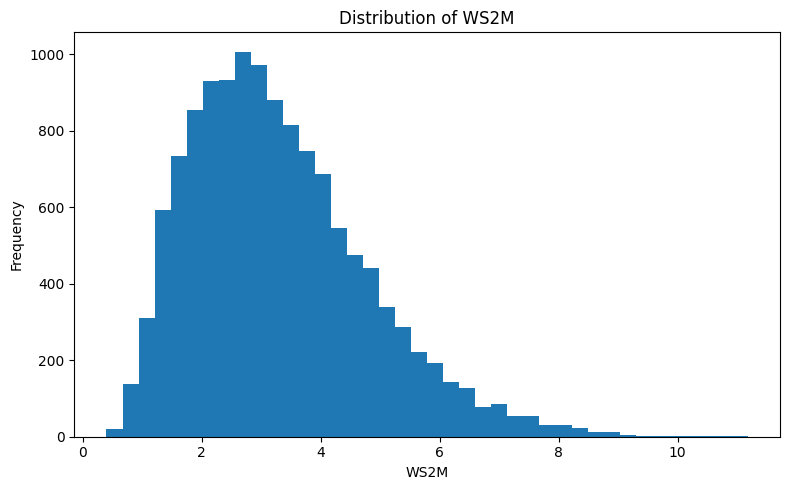

In [ ]:
# distributions of key climate variables
eda_features = ["T2M", "T2M_MAX", "T2M_MIN", "PRECTOTCORR", "RH2M", "WS2M"]

for col in eda_features:
    print(f"{col} summary")
    print(df[col].describe().round(3))

    plt.figure(figsize=(8, 5))
    plt.hist(df[col].dropna(), bins=40)
    plt.title(f"Distribution of {col}")
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.tight_layout()
    plt.show()



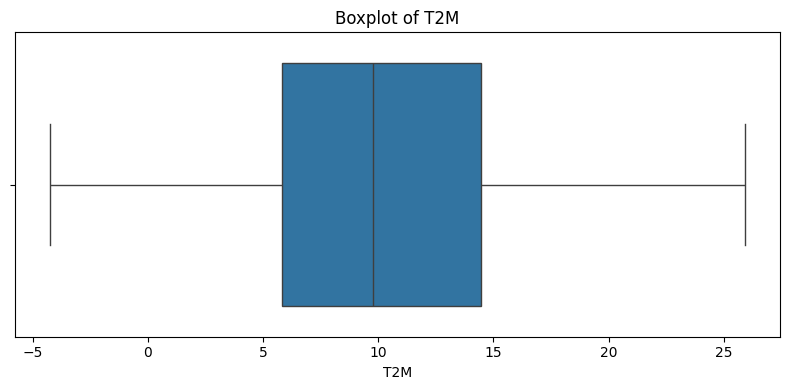

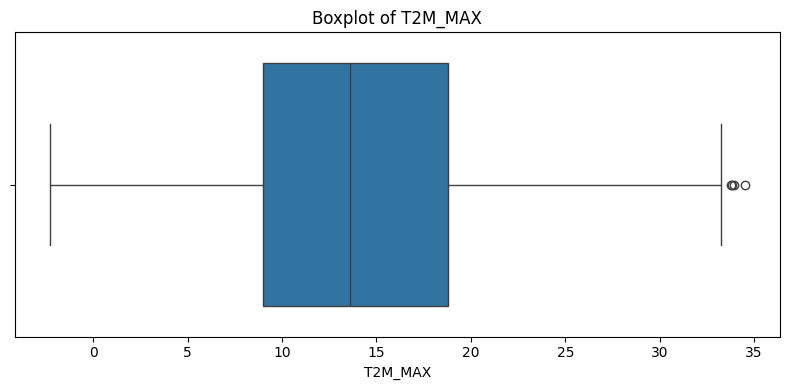

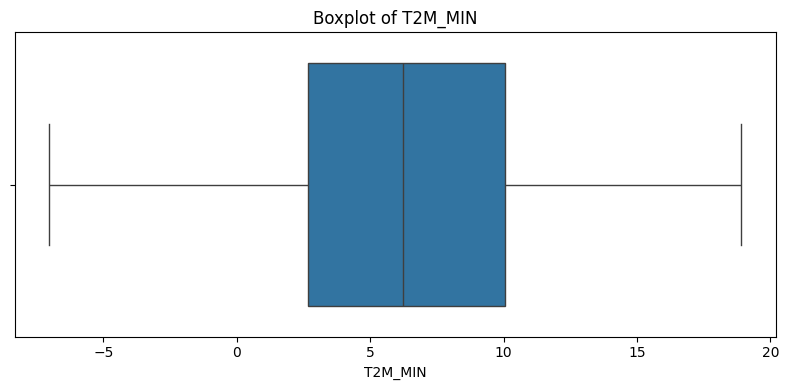

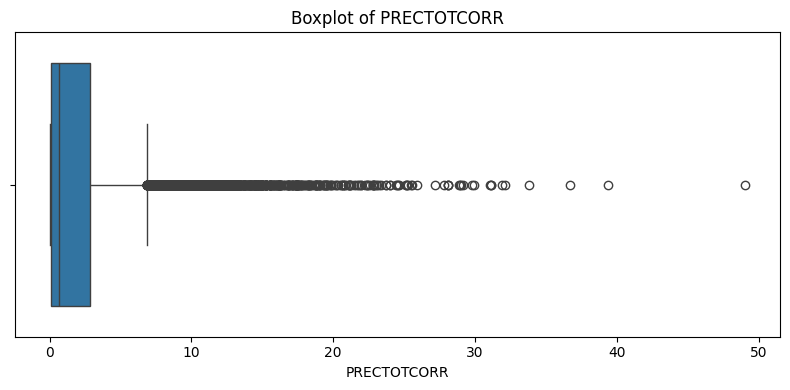

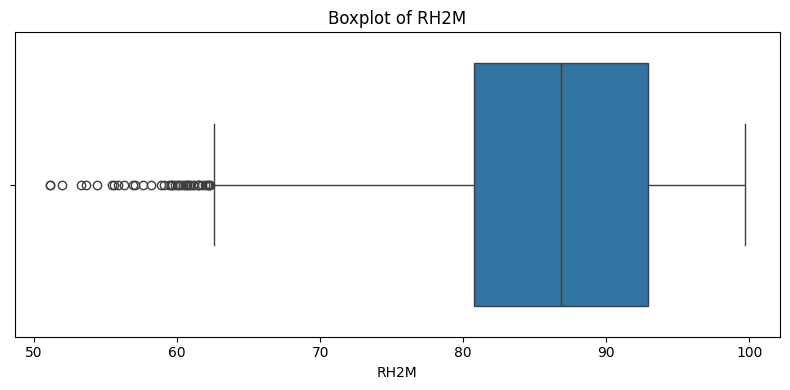

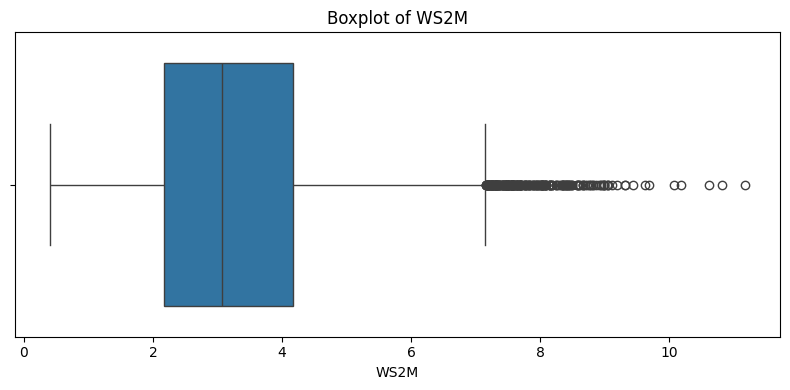

In [ ]:
# boxplots of key climate variables
for col in eda_features:
    plt.figure(figsize=(8, 4))
    sns.boxplot(x=df[col])
    plt.title(f"Boxplot of {col}")
    plt.xlabel(col)
    plt.tight_layout()
    plt.show()



raw feature correlation matrix
               T2M  T2M_MAX  T2M_MIN  PRECTOTCORR   RH2M   WS2M
T2M          1.000    0.977    0.957       -0.013 -0.592 -0.126
T2M_MAX      0.977    1.000    0.888       -0.092 -0.669 -0.196
T2M_MIN      0.957    0.888    1.000        0.069 -0.436 -0.044
PRECTOTCORR -0.013   -0.092    0.069        1.000  0.296  0.309
RH2M        -0.592   -0.669   -0.436        0.296  1.000  0.129
WS2M        -0.126   -0.196   -0.044        0.309  0.129  1.000


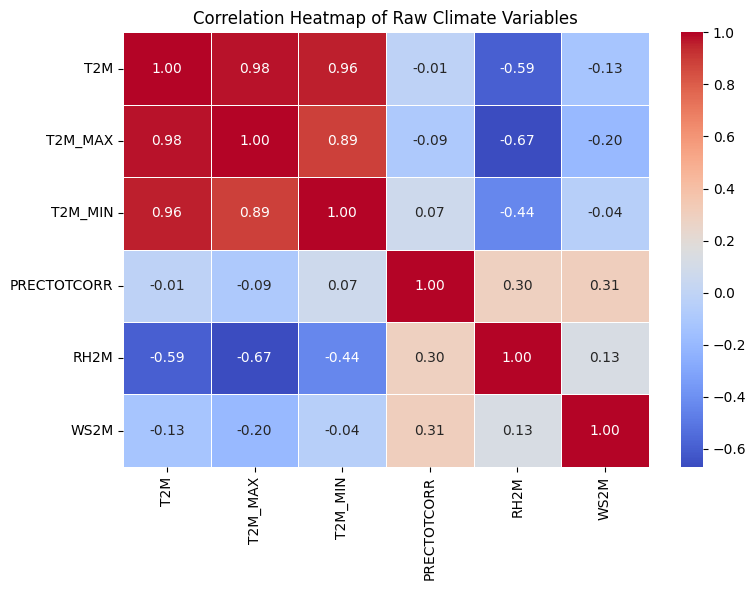

In [ ]:
# correlation heatmap for raw climate variables
raw_corr = df[eda_features].corr()

print("raw feature correlation matrix")
print(raw_corr.round(3))

plt.figure(figsize=(8, 6))
sns.heatmap(raw_corr, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Heatmap of Raw Climate Variables")
plt.tight_layout()
plt.show()



In [ ]:
# city-wise summary statistics
city_summary = (
    df.groupby("city")[eda_features]
      .agg(["mean", "std", "min", "max"])
      .round(3)
)

print("city-wise summary statistics")
print(city_summary)



city-wise summary statistics
               T2M                     T2M_MAX                     T2M_MIN                     PRECTOTCORR                       RH2M                        WS2M                    
              mean    std   min    max    mean    std   min    max    mean    std   min    max        mean    std  min    max    mean    std    min    max   mean    std   min    max
city                                                                                                                                                                                 
Birmingham   9.863  5.409 -4.11  24.41  13.924  6.185 -2.26  33.26   5.957  4.696 -7.02  17.67       2.141  3.528  0.0  31.92  86.567  7.526  58.16  99.28  3.176  1.445  0.40  10.62
Bristol     10.595  5.314 -3.61  24.73  14.367  6.105 -1.52  33.77   6.932  4.706 -6.24  18.58       2.399  3.748  0.0  31.12  86.273  8.002  51.09  99.71  3.364  1.515  0.62  10.82
Leeds        9.450  5.283 -3.38  24.86  13.295  6.045 -2.09  

city-wise average rainfall
city
Manchester    2.781
Bristol       2.399
Birmingham    2.141
Leeds         2.092
London        1.939
Name: PRECTOTCORR, dtype: float64


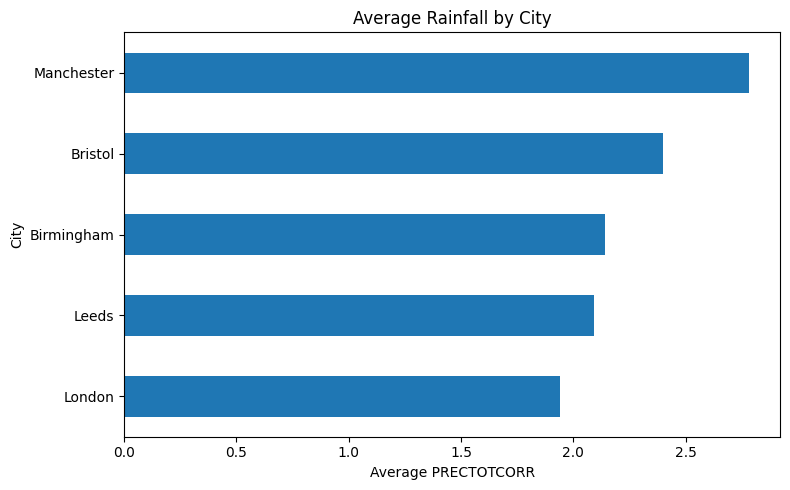

In [ ]:
# city-wise average rainfall
city_rainfall = df.groupby("city")["PRECTOTCORR"].mean().sort_values(ascending=False)

print("city-wise average rainfall")
print(city_rainfall.round(3))

plt.figure(figsize=(8, 5))
city_rainfall.sort_values().plot(kind="barh")
plt.title("Average Rainfall by City")
plt.xlabel("Average PRECTOTCORR")
plt.ylabel("City")
plt.tight_layout()
plt.show()



city-wise average humidity
city
Manchester    88.227
Leeds         86.715
Birmingham    86.567
Bristol       86.273
London        83.818
Name: RH2M, dtype: float64


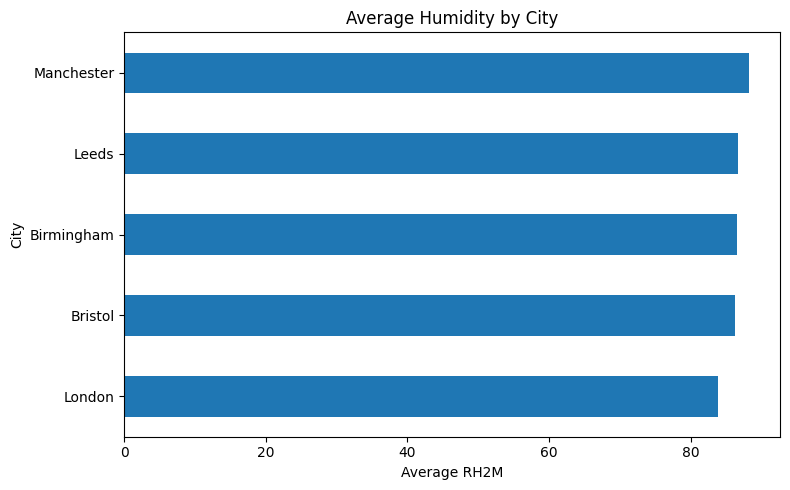

In [ ]:
# city-wise average humidity
city_humidity = df.groupby("city")["RH2M"].mean().sort_values(ascending=False)

print("city-wise average humidity")
print(city_humidity.round(3))

plt.figure(figsize=(8, 5))
city_humidity.sort_values().plot(kind="barh")
plt.title("Average Humidity by City")
plt.xlabel("Average RH2M")
plt.ylabel("City")
plt.tight_layout()
plt.show()



city-wise average wind speed
city
Manchester    3.375
Bristol       3.364
London        3.348
Leeds         3.237
Birmingham    3.176
Name: WS2M, dtype: float64


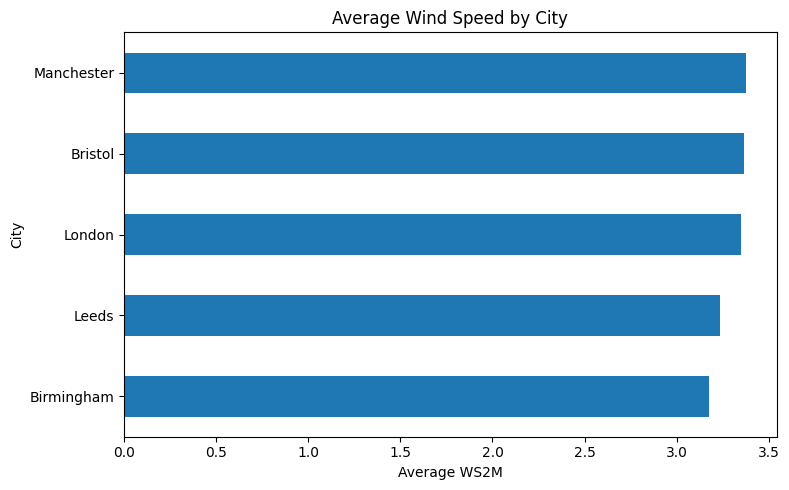

In [ ]:
# city-wise average wind speed
city_wind = df.groupby("city")["WS2M"].mean().sort_values(ascending=False)

print("city-wise average wind speed")
print(city_wind.round(3))

plt.figure(figsize=(8, 5))
city_wind.sort_values().plot(kind="barh")
plt.title("Average Wind Speed by City")
plt.xlabel("Average WS2M")
plt.ylabel("City")
plt.tight_layout()
plt.show()



monthly rainfall pattern
         city  month  PRECTOTCORR
0  Birmingham      1     2.178986
1  Birmingham      2     2.234293
2  Birmingham      3     2.064516
3  Birmingham      4     1.322524
4  Birmingham      5     1.877972


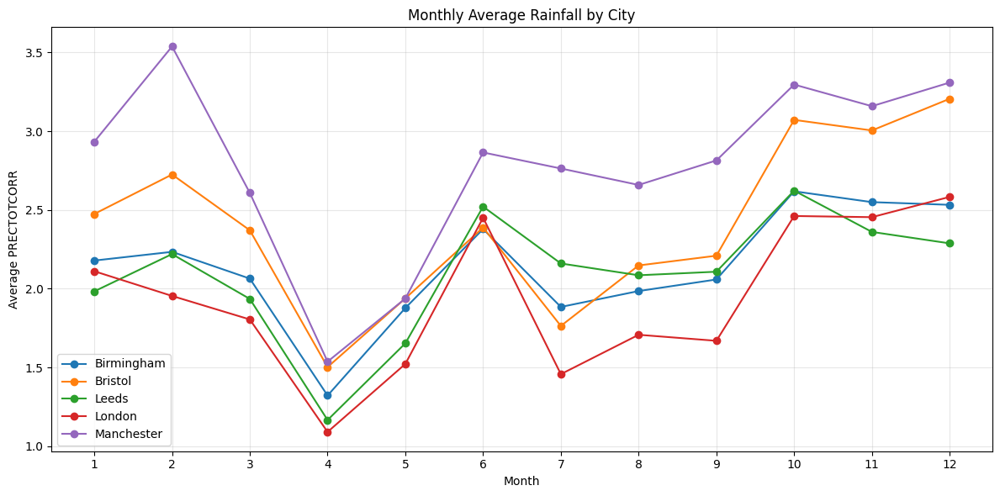

In [ ]:
# monthly rainfall pattern by city
monthly_rainfall = (
    df.groupby(["city", "month"])["PRECTOTCORR"]
      .mean()
      .reset_index()
)

print("monthly rainfall pattern")
print(monthly_rainfall.head())

plt.figure(figsize=(12, 6))
for city in sorted(monthly_rainfall["city"].unique()):
    city_data = monthly_rainfall[monthly_rainfall["city"] == city]
    plt.plot(city_data["month"], city_data["PRECTOTCORR"], marker="o", label=city)

plt.title("Monthly Average Rainfall by City")
plt.xlabel("Month")
plt.ylabel("Average PRECTOTCORR")
plt.xticks(range(1, 13))
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()



monthly humidity pattern
         city  month       RH2M
0  Birmingham      1  94.816359
1  Birmingham      2  90.385202
2  Birmingham      3  86.645161
3  Birmingham      4  81.489905
4  Birmingham      5  80.357650


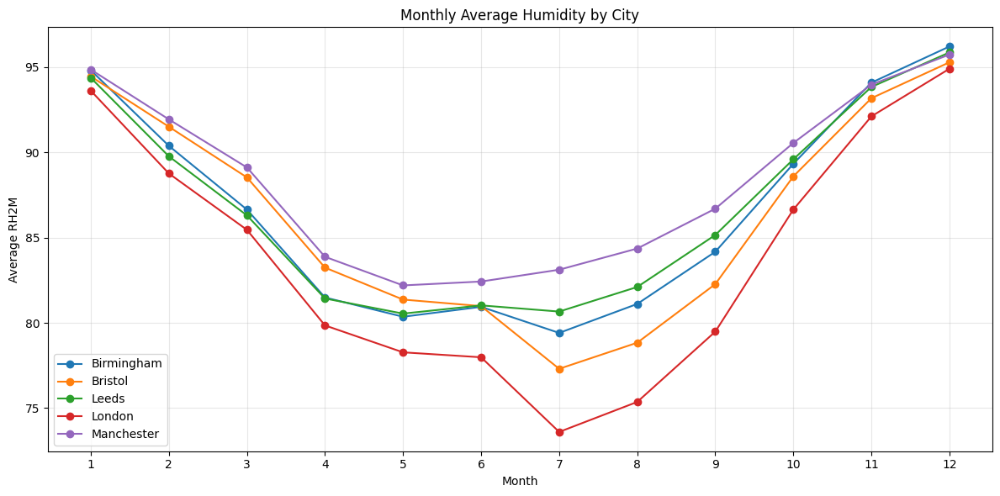

In [ ]:
# monthly humidity pattern by city
monthly_humidity = (
    df.groupby(["city", "month"])["RH2M"]
      .mean()
      .reset_index()
)

print("monthly humidity pattern")
print(monthly_humidity.head())

plt.figure(figsize=(12, 6))
for city in sorted(monthly_humidity["city"].unique()):
    city_data = monthly_humidity[monthly_humidity["city"] == city]
    plt.plot(city_data["month"], city_data["RH2M"], marker="o", label=city)

plt.title("Monthly Average Humidity by City")
plt.xlabel("Month")
plt.ylabel("Average RH2M")
plt.xticks(range(1, 13))
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


monthly wind pattern
         city  month      WS2M
0  Birmingham      1  3.388295
1  Birmingham      2  4.262475
2  Birmingham      3  3.637788
3  Birmingham      4  2.891667
4  Birmingham      5  2.777143


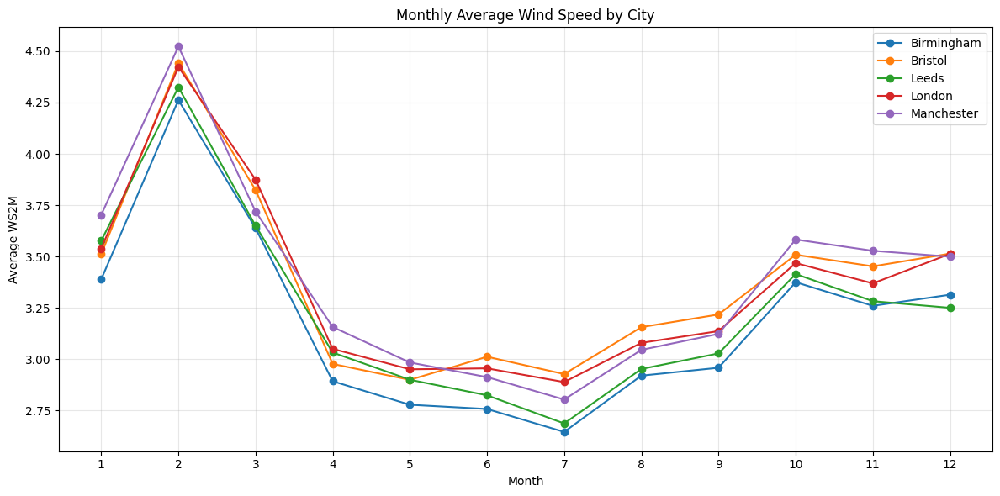

In [ ]:

# monthly wind pattern by city
monthly_wind = (
    df.groupby(["city", "month"])["WS2M"]
      .mean()
      .reset_index()
)

print("monthly wind pattern")
print(monthly_wind.head())

plt.figure(figsize=(12, 6))
for city in sorted(monthly_wind["city"].unique()):
    city_data = monthly_wind[monthly_wind["city"] == city]
    plt.plot(city_data["month"], city_data["WS2M"], marker="o", label=city)

plt.title("Monthly Average Wind Speed by City")
plt.xlabel("Month")
plt.ylabel("Average WS2M")
plt.xticks(range(1, 13))
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

deseasonalised temperature sample
         city       date   T2M  monthly_clim_T2M  T2M_deseasonal
0  Birmingham 2016-01-01  3.69          3.645945        0.044055
1  Birmingham 2016-01-02  7.26          3.645945        3.614055
2  Birmingham 2016-01-03  5.75          3.645945        2.104055
3  Birmingham 2016-01-04  6.07          3.645945        2.424055
4  Birmingham 2016-01-05  6.14          3.645945        2.494055


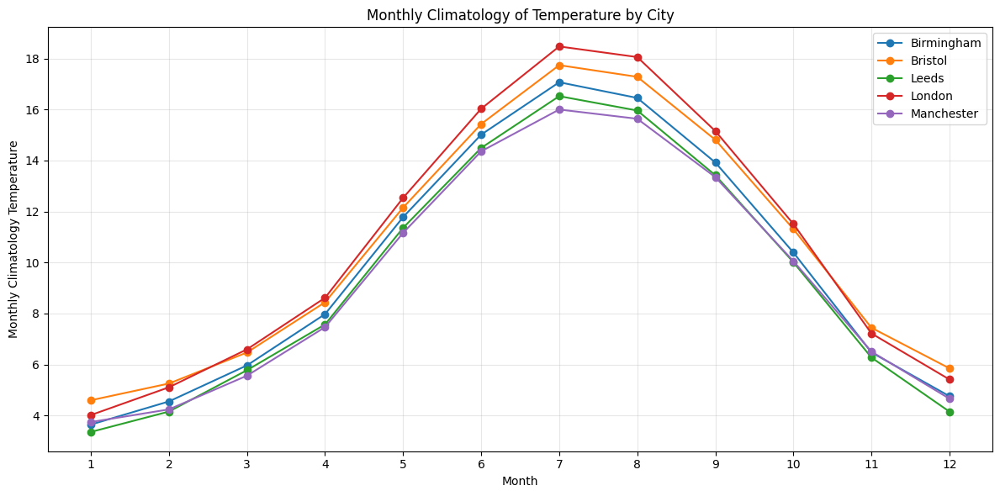

deseasonalised temperature summary
count    12785.000
mean        -0.000
std          2.597
min         -9.884
25%         -1.754
50%         -0.001
75%          1.735
max          8.389
Name: T2M_deseasonal, dtype: float64


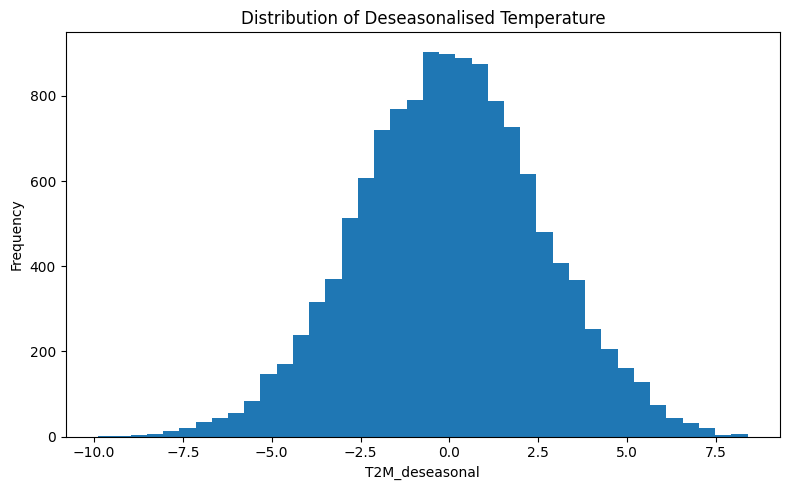

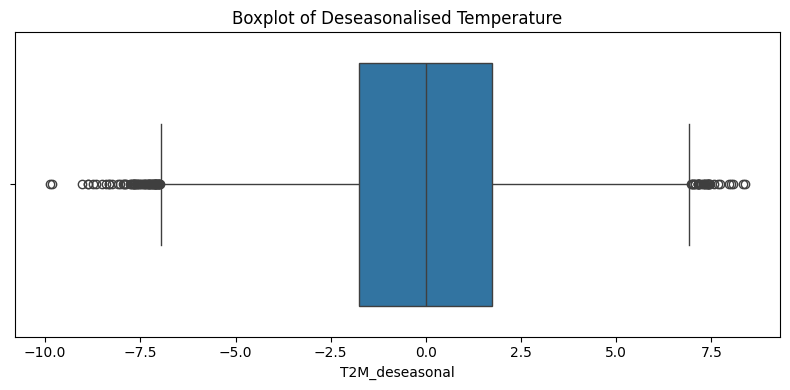

absolute deviation summary
count    12785.000
mean         2.068
std          1.570
min          0.000
25%          0.809
50%          1.747
75%          2.982
max          9.884
Name: abs_dev_T2M, dtype: float64


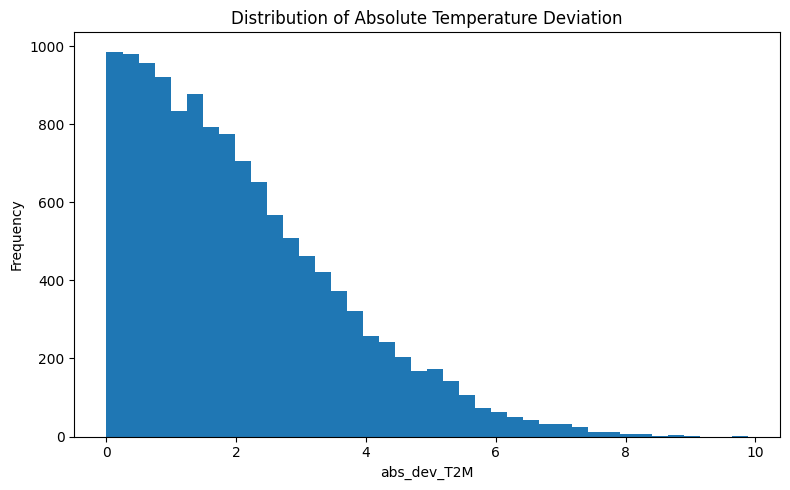

average 7 day volatility by city
city
London        1.810
Birmingham    1.808
Leeds         1.747
Bristol       1.710
Manchester    1.676
Name: roll_std_7_T2M_deseasonal, dtype: float64
average 30 day volatility by city
city
London        2.429
Birmingham    2.389
Bristol       2.285
Leeds         2.272
Manchester    2.217
Name: roll_std_30_T2M_deseasonal, dtype: float64


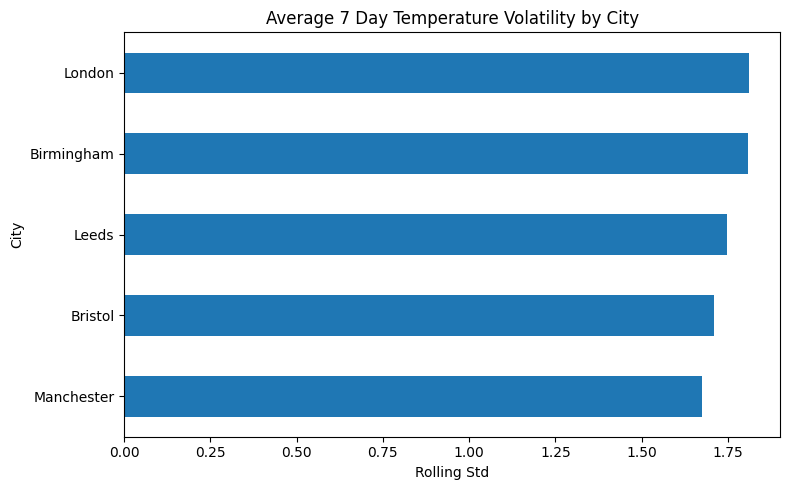

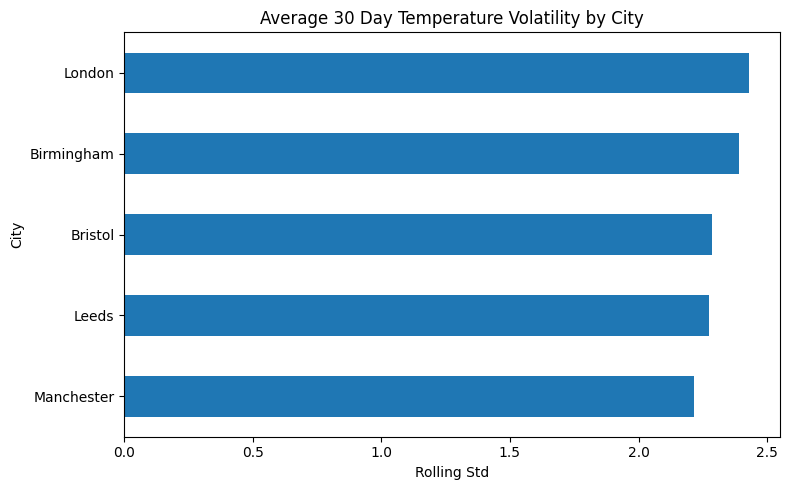

yearly average absolute deviation
         city  year  abs_dev_T2M
0  Birmingham  2016     1.922610
1  Birmingham  2017     2.111485
2  Birmingham  2018     2.362369
3  Birmingham  2019     1.975033
4  Birmingham  2020     2.213964


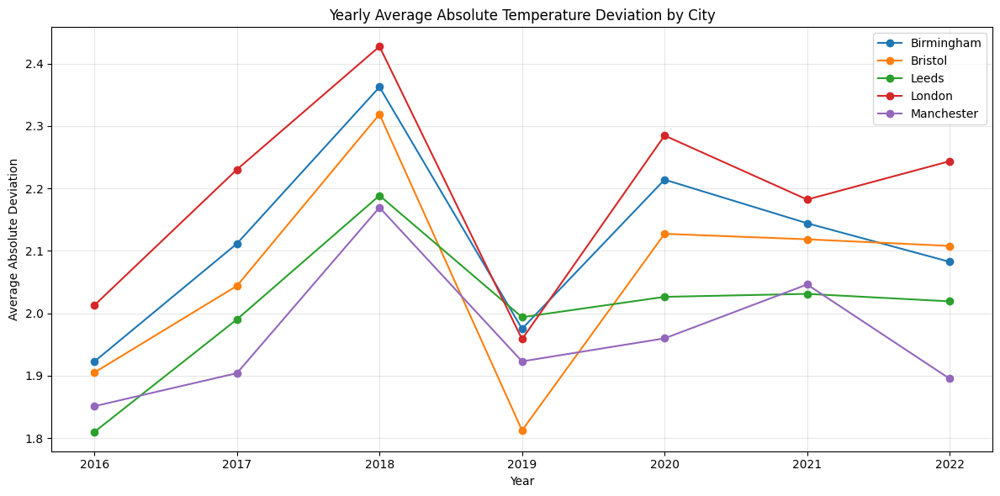

extreme deviation threshold
5.139
number of extreme deviation days
640
extreme deviation sample
          city       date    T2M  monthly_clim_T2M  T2M_deseasonal  abs_dev_T2M
23  Birmingham 2016-01-24  10.65          3.645945        7.004055     7.004055
26  Birmingham 2016-01-27   8.97          3.645945        5.324055     5.324055
28  Birmingham 2016-01-29   9.76          3.645945        6.114055     6.114055
51  Birmingham 2016-02-21  10.36          4.553333        5.806667     5.806667
66  Birmingham 2016-03-07   0.39          5.967327       -5.577327     5.577327
extreme deviation days by city
city
Birmingham    147
London        146
Bristol       129
Manchester    110
Leeds         108
Name: count, dtype: int64


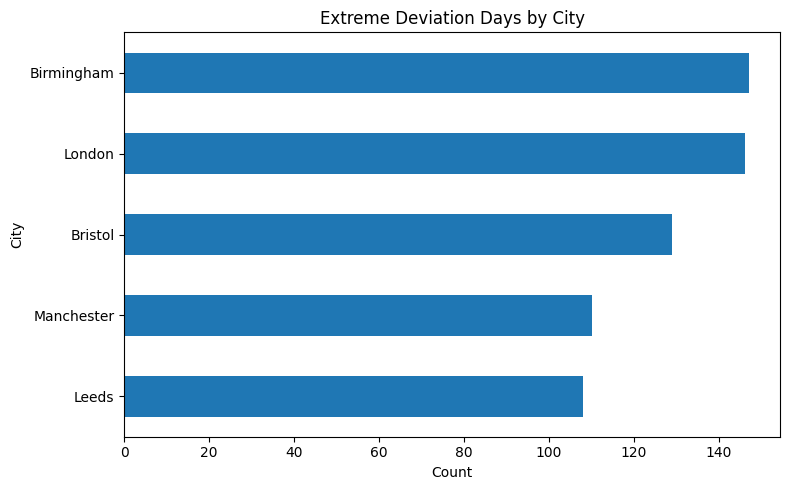

anomaly oriented correlation matrix
                              T2M  monthly_clim_T2M  T2M_deseasonal  abs_dev_T2M  roll_std_7_T2M_deseasonal  roll_std_30_T2M_deseasonal
T2M                         1.000             0.876           0.481       -0.127                     -0.205                      -0.355
monthly_clim_T2M            0.876             1.000           0.000       -0.140                     -0.250                      -0.378
T2M_deseasonal              0.481             0.000           1.000       -0.009                      0.030                      -0.051
abs_dev_T2M                -0.127            -0.140          -0.009        1.000                      0.314                       0.238
roll_std_7_T2M_deseasonal  -0.205            -0.250           0.030        0.314                      1.000                       0.389
roll_std_30_T2M_deseasonal -0.355            -0.378          -0.051        0.238                      0.389                       1.000


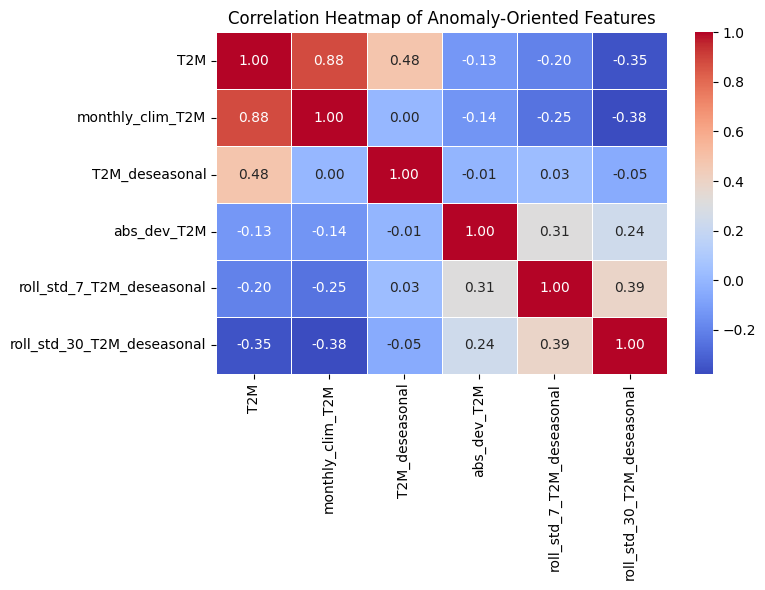

In [ ]:
# city-wise monthly climatology merge for temperature
monthly_climatology_t2m = (
    df.groupby(["city", "month"])["T2M"]
      .mean()
      .reset_index()
      .rename(columns={"T2M": "monthly_clim_T2M"})
)

df_eda = df.merge(monthly_climatology_t2m, on=["city", "month"], how="left")

# deseasonalised temperature
df_eda["T2M_deseasonal"] = df_eda["T2M"] - df_eda["monthly_clim_T2M"]

print("deseasonalised temperature sample")
print(df_eda[["city", "date", "T2M", "monthly_clim_T2M", "T2M_deseasonal"]].head())

# monthly climatology by city
plt.figure(figsize=(12, 6))
for city in sorted(df_eda["city"].unique()):
    city_data = (
        df_eda[df_eda["city"] == city]
        .groupby("month")["monthly_clim_T2M"]
        .mean()
        .reset_index()
    )
    plt.plot(city_data["month"], city_data["monthly_clim_T2M"], marker="o", label=city)

plt.title("Monthly Climatology of Temperature by City")
plt.xlabel("Month")
plt.ylabel("Monthly Climatology Temperature")
plt.xticks(range(1, 13))
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# distribution of deseasonalised temperature
print("deseasonalised temperature summary")
print(df_eda["T2M_deseasonal"].describe().round(3))

plt.figure(figsize=(8, 5))
plt.hist(df_eda["T2M_deseasonal"].dropna(), bins=40)
plt.title("Distribution of Deseasonalised Temperature")
plt.xlabel("T2M_deseasonal")
plt.ylabel("Frequency")
plt.tight_layout()
plt.show()

# boxplot of deseasonalised temperature
plt.figure(figsize=(8, 4))
sns.boxplot(x=df_eda["T2M_deseasonal"])
plt.title("Boxplot of Deseasonalised Temperature")
plt.xlabel("T2M_deseasonal")
plt.tight_layout()
plt.show()

# absolute deviation from climatology
df_eda["abs_dev_T2M"] = df_eda["T2M_deseasonal"].abs()

print("absolute deviation summary")
print(df_eda["abs_dev_T2M"].describe().round(3))

plt.figure(figsize=(8, 5))
plt.hist(df_eda["abs_dev_T2M"].dropna(), bins=40)
plt.title("Distribution of Absolute Temperature Deviation")
plt.xlabel("abs_dev_T2M")
plt.ylabel("Frequency")
plt.tight_layout()
plt.show()

# rolling volatility on deseasonalised temperature
df_eda = df_eda.sort_values(["city", "date"]).reset_index(drop=True)

for window in [7, 30]:
    df_eda[f"roll_std_{window}_T2M_deseasonal"] = (
        df_eda.groupby("city")["T2M_deseasonal"]
              .transform(lambda x: x.rolling(window).std())
    )

# average rolling volatility by city
volatility_7 = (
    df_eda.groupby("city")["roll_std_7_T2M_deseasonal"]
          .mean()
          .sort_values(ascending=False)
)

volatility_30 = (
    df_eda.groupby("city")["roll_std_30_T2M_deseasonal"]
          .mean()
          .sort_values(ascending=False)
)

print("average 7 day volatility by city")
print(volatility_7.round(3))

print("average 30 day volatility by city")
print(volatility_30.round(3))

plt.figure(figsize=(8, 5))
volatility_7.sort_values().plot(kind="barh")
plt.title("Average 7 Day Temperature Volatility by City")
plt.xlabel("Rolling Std")
plt.ylabel("City")
plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 5))
volatility_30.sort_values().plot(kind="barh")
plt.title("Average 30 Day Temperature Volatility by City")
plt.xlabel("Rolling Std")
plt.ylabel("City")
plt.tight_layout()
plt.show()

# yearly average absolute deviation by city
yearly_abs_dev = (
    df_eda.groupby(["city", "year"])["abs_dev_T2M"]
          .mean()
          .reset_index()
)

print("yearly average absolute deviation")
print(yearly_abs_dev.head())

plt.figure(figsize=(12, 6))
for city in sorted(yearly_abs_dev["city"].unique()):
    city_data = yearly_abs_dev[yearly_abs_dev["city"] == city]
    plt.plot(city_data["year"], city_data["abs_dev_T2M"], marker="o", label=city)

plt.title("Yearly Average Absolute Temperature Deviation by City")
plt.xlabel("Year")
plt.ylabel("Average Absolute Deviation")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# extreme deviation threshold
extreme_threshold = df_eda["abs_dev_T2M"].quantile(0.95)

print("extreme deviation threshold")
print(round(extreme_threshold, 3))

# extreme deviation records
extreme_days = df_eda[df_eda["abs_dev_T2M"] >= extreme_threshold].copy()

print("number of extreme deviation days")
print(len(extreme_days))

print("extreme deviation sample")
print(extreme_days[["city", "date", "T2M", "monthly_clim_T2M", "T2M_deseasonal", "abs_dev_T2M"]].head())

# extreme days by city
extreme_by_city = extreme_days["city"].value_counts().sort_values(ascending=False)

print("extreme deviation days by city")
print(extreme_by_city)

plt.figure(figsize=(8, 5))
extreme_by_city.sort_values().plot(kind="barh")
plt.title("Extreme Deviation Days by City")
plt.xlabel("Count")
plt.ylabel("City")
plt.tight_layout()
plt.show()

# correlation heatmap for anomaly-oriented features
anomaly_eda_features = [
    "T2M",
    "monthly_clim_T2M",
    "T2M_deseasonal",
    "abs_dev_T2M",
    "roll_std_7_T2M_deseasonal",
    "roll_std_30_T2M_deseasonal"
]

anomaly_corr = df_eda[anomaly_eda_features].corr()

print("anomaly oriented correlation matrix")
print(anomaly_corr.round(3))

plt.figure(figsize=(8, 6))
sns.heatmap(anomaly_corr, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Heatmap of Anomaly-Oriented Features")
plt.tight_layout()
plt.show()

**preprocessing and feature engineering**

In [ ]:
# create working copy
df_model = df.copy()

# sort by city and date
df_model = df_model.sort_values(["city", "date"]).reset_index(drop=True)

# fill missing values within each city
df_model[RAW_FEATURES] = (
    df_model.groupby("city")[RAW_FEATURES]
            .transform(lambda x: x.ffill().bfill())
)

# create calendar columns
df_model["year"] = df_model["date"].dt.year
df_model["month"] = df_model["date"].dt.month
df_model["dayofyear"] = df_model["date"].dt.dayofyear

# create monthly climatology for temperature variables
for col in ["T2M", "T2M_MAX", "T2M_MIN"]:
    clim = (
        df_model.groupby(["city", "month"])[col]
                .mean()
                .reset_index()
                .rename(columns={col: f"monthly_clim_{col}"})
    )
    df_model = df_model.merge(clim, on=["city", "month"], how="left")

# create deseasonalised temperature features
df_model["T2M_deseasonal"] = df_model["T2M"] - df_model["monthly_clim_T2M"]
df_model["T2M_MAX_deseasonal"] = df_model["T2M_MAX"] - df_model["monthly_clim_T2M_MAX"]
df_model["T2M_MIN_deseasonal"] = df_model["T2M_MIN"] - df_model["monthly_clim_T2M_MIN"]

# create magnitude features
df_model["abs_dev_T2M"] = df_model["T2M_deseasonal"].abs()
df_model["temp_range"] = df_model["T2M_MAX"] - df_model["T2M_MIN"]

# create rolling features
for base_col in ROLLING_BASE_FEATURES:
    for window in ROLL_WINDOWS:
        df_model[f"roll_mean_{window}_{base_col}"] = (
            df_model.groupby("city")[base_col]
                    .transform(lambda x: x.rolling(window).mean())
        )
        df_model[f"roll_std_{window}_{base_col}"] = (
            df_model.groupby("city")[base_col]
                    .transform(lambda x: x.rolling(window).std())
        )

# create lag features
for base_col in ROLLING_BASE_FEATURES:
    for lag in LAGS:
        df_model[f"lag_{lag}_{base_col}"] = (
            df_model.groupby("city")[base_col]
                    .shift(lag)
        )

# create cyclical seasonal features
df_model["month_sin"] = np.sin(2 * np.pi * df_model["month"] / 12)
df_model["month_cos"] = np.cos(2 * np.pi * df_model["month"] / 12)
df_model["doy_sin"] = np.sin(2 * np.pi * df_model["dayofyear"] / 365)
df_model["doy_cos"] = np.cos(2 * np.pi * df_model["dayofyear"] / 365)

# define final feature columns
feature_cols = [
    "T2M",
    "T2M_MAX",
    "T2M_MIN",
    "PRECTOTCORR",
    "RH2M",
    "WS2M",
    "T2M_deseasonal",
    "T2M_MAX_deseasonal",
    "T2M_MIN_deseasonal",
    "abs_dev_T2M",
    "temp_range",
    "month_sin",
    "month_cos",
    "doy_sin",
    "doy_cos"
]

for base_col in ROLLING_BASE_FEATURES:
    for window in ROLL_WINDOWS:
        feature_cols.append(f"roll_mean_{window}_{base_col}")
        feature_cols.append(f"roll_std_{window}_{base_col}")

for base_col in ROLLING_BASE_FEATURES:
    for lag in LAGS:
        feature_cols.append(f"lag_{lag}_{base_col}")

# keep required columns
model_cols = ["city", "date", "year", "month", "dayofyear"] + feature_cols
df_model = df_model[model_cols].copy()

# check missing values before dropping
print("missing values before dropping")
print(df_model.isna().sum()[df_model.isna().sum() > 0])

# drop rows created by rolling and lag features
df_model = df_model.dropna().reset_index(drop=True)

# final shape
print("final model shape", df_model.shape)

# preview final columns
print("number of features", len(feature_cols))
print("feature columns")
print(feature_cols)

# preview final dataset
print("final dataset sample")
print(df_model.head())

missing values before dropping
roll_mean_7_T2M_deseasonal      30
roll_std_7_T2M_deseasonal       30
roll_mean_30_T2M_deseasonal    145
roll_std_30_T2M_deseasonal     145
roll_mean_7_PRECTOTCORR         30
roll_std_7_PRECTOTCORR          30
roll_mean_30_PRECTOTCORR       145
roll_std_30_PRECTOTCORR        145
roll_mean_7_RH2M                30
roll_std_7_RH2M                 30
roll_mean_30_RH2M              145
roll_std_30_RH2M               145
roll_mean_7_WS2M                30
roll_std_7_WS2M                 30
roll_mean_30_WS2M              145
roll_std_30_WS2M               145
lag_1_T2M_deseasonal             5
lag_3_T2M_deseasonal            15
lag_7_T2M_deseasonal            35
lag_1_PRECTOTCORR                5
lag_3_PRECTOTCORR               15
lag_7_PRECTOTCORR               35
lag_1_RH2M                       5
lag_3_RH2M                      15
lag_7_RH2M                      35
lag_1_WS2M                       5
lag_3_WS2M                      15
lag_7_WS2M              

**train test split and scaling**

In [ ]:
# create train and test sets
train_df = df_model[df_model["year"] <= TRAIN_END_YEAR].copy()
test_df = df_model[df_model["year"] >= TEST_START_YEAR].copy()

# check split sizes
print("train shape", train_df.shape)
print("test shape", test_df.shape)

# check date ranges
print("train date range", train_df["date"].min(), train_df["date"].max())
print("test date range", test_df["date"].min(), test_df["date"].max())

# create tabular feature matrices
X_train_tabular = train_df[feature_cols].copy()
X_test_tabular = test_df[feature_cols].copy()

# fit scaler on train only
scaler = StandardScaler()
X_train_tabular_scaled = scaler.fit_transform(X_train_tabular)
X_test_tabular_scaled = scaler.transform(X_test_tabular)

# convert scaled arrays back to dataframes
X_train_tabular_scaled = pd.DataFrame(
    X_train_tabular_scaled,
    columns=feature_cols,
    index=train_df.index
)

X_test_tabular_scaled = pd.DataFrame(
    X_test_tabular_scaled,
    columns=feature_cols,
    index=test_df.index
)

# check scaled outputs
print("scaled train shape", X_train_tabular_scaled.shape)
print("scaled test shape", X_test_tabular_scaled.shape)

# preview scaled train data
print("scaled train sample")
print(X_train_tabular_scaled.head())

# preview scaled test data
print("scaled test sample")
print(X_test_tabular_scaled.head())

train shape (8990, 48)
test shape (3650, 48)
train date range 2016-01-30 00:00:00 2020-12-31 00:00:00
test date range 2021-01-01 00:00:00 2022-12-31 00:00:00
scaled train shape (8990, 43)
scaled test shape (3650, 43)
scaled train sample
        T2M   T2M_MAX   T2M_MIN  PRECTOTCORR      RH2M      WS2M  T2M_deseasonal  T2M_MAX_deseasonal  T2M_MIN_deseasonal  abs_dev_T2M  temp_range  month_sin  month_cos   doy_sin   doy_cos  \
0 -1.163660 -1.204100 -0.908070    -0.399701  0.049785  0.993016        0.116527            0.070592            0.384839    -1.205597   -1.061193   0.723380   1.250216  0.699749  1.258084   
1 -0.618718 -0.412166 -1.113458    -0.037031  1.062378  0.837665        1.245682            1.693571            0.019147     0.679929    0.896057   0.723380   1.250216  0.720686  1.245803   
2 -0.158629 -0.288939 -0.041116    -0.536710 -0.336841  2.782930        1.844490            1.423959            1.769019     1.679852   -0.532023   1.239952   0.731292  0.741411  1.233159   

**metric functions**

In [ ]:
# evaluate tabular anomaly model
def evaluate_tabular_model(model, X_train, X_test, model_name, training_time_sec, prediction_time_sec):
    train_scores = model.decision_function(X_train)
    test_scores = model.decision_function(X_test)

    train_preds = np.where(model.predict(X_train) == -1, 1, 0)
    test_preds = np.where(model.predict(X_test) == -1, 1, 0)

    train_anomaly_pct = train_preds.mean() * 100
    test_anomaly_pct = test_preds.mean() * 100
    stability_gap_pct = abs(train_preds.mean() - test_preds.mean()) * 100

    normal_scores = train_scores[train_preds == 0]
    anomaly_scores = train_scores[train_preds == 1]

    if len(normal_scores) > 0 and len(anomaly_scores) > 0:
        separation_score = normal_scores.mean() - anomaly_scores.mean()
    else:
        separation_score = np.nan

    metrics = {
        "Model": model_name,
        "Train Anomaly %": round(train_anomaly_pct, 4),
        "Test Anomaly %": round(test_anomaly_pct, 4),
        "Stability Gap %": round(stability_gap_pct, 4),
        "Separation Score": round(separation_score, 4) if not np.isnan(separation_score) else np.nan,
        "Training Time (sec)": round(training_time_sec, 4),
        "Prediction Time (sec)": round(prediction_time_sec, 4)
    }

    return metrics, train_scores, test_scores, train_preds, test_preds

# create LSTM sequences
def create_sequences(data_array, sequence_length):
    sequences = []
    for i in range(len(data_array) - sequence_length + 1):
        sequences.append(data_array[i:i + sequence_length])
    return np.array(sequences)

# evaluate LSTM reconstruction model
def evaluate_lstm_model(train_loss, test_loss, threshold, model_name, training_time_sec, prediction_time_sec):
    train_preds = (train_loss > threshold).astype(int)
    test_preds = (test_loss > threshold).astype(int)

    train_anomaly_pct = train_preds.mean() * 100
    test_anomaly_pct = test_preds.mean() * 100
    stability_gap_pct = abs(train_preds.mean() - test_preds.mean()) * 100

    normal_scores = train_loss[train_preds == 0]
    anomaly_scores = train_loss[train_preds == 1]

    if len(normal_scores) > 0 and len(anomaly_scores) > 0:
        separation_score = anomaly_scores.mean() - normal_scores.mean()
    else:
        separation_score = np.nan

    metrics = {
        "Model": model_name,
        "Train Anomaly %": round(train_anomaly_pct, 4),
        "Test Anomaly %": round(test_anomaly_pct, 4),
        "Stability Gap %": round(stability_gap_pct, 4),
        "Separation Score": round(separation_score, 4) if not np.isnan(separation_score) else np.nan,
        "Training Time (sec)": round(training_time_sec, 4),
        "Prediction Time (sec)": round(prediction_time_sec, 4)
    }

    return metrics, train_preds, test_preds

# calculate reconstruction errors
def get_reconstruction_errors(model, data_tensor, data_seq):
    model.eval()
    start_pred = time.time()

    with torch.no_grad():
        reconstructed = model(data_tensor.to(DEVICE)).cpu().numpy()

    end_pred = time.time()
    prediction_time_sec = end_pred - start_pred

    reconstruction_error = np.mean((data_seq - reconstructed) ** 2, axis=(1, 2))

    return reconstruction_error, prediction_time_sec

# print metrics helper
def print_metrics(metrics_dict):
    for key, value in metrics_dict.items():
        print(f"{key}: {value}")

# create LSTM train and test sequences from  scaled features
X_train_seq = create_sequences(X_train_tabular_scaled.values, SEQUENCE_LENGTH)
X_test_seq = create_sequences(X_test_tabular_scaled.values, SEQUENCE_LENGTH)

print("train sequence shape", X_train_seq.shape)
print("test sequence shape", X_test_seq.shape)

train sequence shape (8961, 30, 43)
test sequence shape (3621, 30, 43)


**result storage helpers**

In [ ]:
# store all model metric dictionaries here
all_model_metrics = []

# save a model result dictionary
def save_model_result(metrics_dict):
    all_model_metrics.append(metrics_dict.copy())

# create final comparison dataframe
def build_final_results_df():
    results_df = pd.DataFrame(all_model_metrics).copy()

    metric_order = [
        "Model",
        "Train Anomaly %",
        "Test Anomaly %",
        "Stability Gap %",
        "Separation Score",
        "Training Time (sec)",
        "Prediction Time (sec)"
    ]

    existing_cols = [col for col in metric_order if col in results_df.columns]
    results_df = results_df[existing_cols]

    return results_df


def show_saved_result(metrics_dict):
    result_df = pd.DataFrame([metrics_dict])
    print(result_df)

**baseline isolation forest**

baseline isolation forest metrics
Model: Baseline IF
Train Anomaly %: 5.0056
Test Anomaly %: 9.9178
Stability Gap %: 4.9122
Separation Score: 0.0742
Training Time (sec): 0.8141
Prediction Time (sec): 0.2497
baseline isolation forest train anomaly by city
city
London        8.231
Bristol       5.395
Manchester    4.839
Birmingham    3.949
Leeds         2.614
Name: anomaly, dtype: float64
baseline isolation forest test anomaly by city
city
London        13.562
Bristol       11.233
Manchester     9.863
Birmingham     8.630
Leeds          6.301
Name: anomaly, dtype: float64


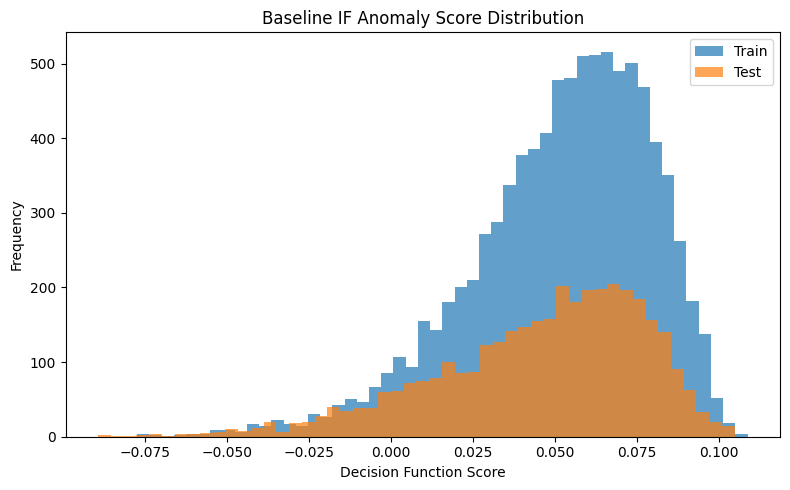

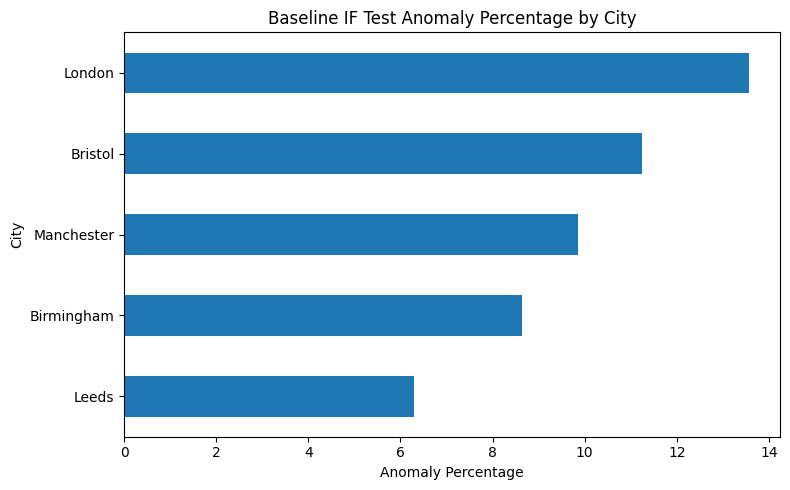

In [ ]:
#train baseline isolation forest
baseline_if_params = {
    "n_estimators": 200,
    "contamination": 0.05,
    "max_samples": "auto",
    "max_features": 1.0,
    "random_state": SEED
}

start_train = time.time()

baseline_if = IsolationForest(
    n_estimators=baseline_if_params["n_estimators"],
    contamination=baseline_if_params["contamination"],
    max_samples=baseline_if_params["max_samples"],
    max_features=baseline_if_params["max_features"],
    random_state=baseline_if_params["random_state"]
)

baseline_if.fit(X_train_tabular_scaled)

end_train = time.time()
baseline_if_training_time = end_train - start_train

# prediction timing
start_pred = time.time()
_ = baseline_if.predict(X_train_tabular_scaled)
_ = baseline_if.predict(X_test_tabular_scaled)
end_pred = time.time()
baseline_if_prediction_time = end_pred - start_pred

# evaluate baseline isolation forest
if_baseline_metrics, if_baseline_train_scores, if_baseline_test_scores, if_baseline_train_preds, if_baseline_test_preds = evaluate_tabular_model(
    model=baseline_if,
    X_train=X_train_tabular_scaled,
    X_test=X_test_tabular_scaled,
    model_name="Baseline IF",
    training_time_sec=baseline_if_training_time,
    prediction_time_sec=baseline_if_prediction_time
)

# print metrics
print("baseline isolation forest metrics")
print_metrics(if_baseline_metrics)

# attach predictions to dataframes
train_df_if_baseline = train_df.copy()
test_df_if_baseline = test_df.copy()

train_df_if_baseline["anomaly_score"] = if_baseline_train_scores
train_df_if_baseline["anomaly"] = if_baseline_train_preds

test_df_if_baseline["anomaly_score"] = if_baseline_test_scores
test_df_if_baseline["anomaly"] = if_baseline_test_preds

# anomaly percentages by city
baseline_if_train_city_anomaly = (
    train_df_if_baseline.groupby("city")["anomaly"]
    .mean()
    .mul(100)
    .sort_values(ascending=False)
)

baseline_if_test_city_anomaly = (
    test_df_if_baseline.groupby("city")["anomaly"]
    .mean()
    .mul(100)
    .sort_values(ascending=False)
)

print("baseline isolation forest train anomaly by city")
print(baseline_if_train_city_anomaly.round(3))

print("baseline isolation forest test anomaly by city")
print(baseline_if_test_city_anomaly.round(3))

# anomaly score distribution
plt.figure(figsize=(8, 5))
plt.hist(if_baseline_train_scores, bins=50, alpha=0.7, label="Train")
plt.hist(if_baseline_test_scores, bins=50, alpha=0.7, label="Test")
plt.title("Baseline IF Anomaly Score Distribution")
plt.xlabel("Decision Function Score")
plt.ylabel("Frequency")
plt.legend()
plt.tight_layout()
plt.show()

# city-wise test anomaly percentage
plt.figure(figsize=(8, 5))
baseline_if_test_city_anomaly.sort_values().plot(kind="barh")
plt.title("Baseline IF Test Anomaly Percentage by City")
plt.xlabel("Anomaly Percentage")
plt.ylabel("City")
plt.tight_layout()
plt.show()

In [ ]:
save_model_result(if_baseline_metrics)
show_saved_result(if_baseline_metrics)

         Model  Train Anomaly %  Test Anomaly %  Stability Gap %  Separation Score  Training Time (sec)  Prediction Time (sec)
0  Baseline IF           5.0056          9.9178           4.9122            0.0742               0.8141                 0.2497


**tuned isolation forest**

In [ ]:
if_param_grid = {
    "n_estimators": [100, 200, 300],
    "contamination": [0.03, 0.05, 0.08],
    "max_samples": ["auto", 0.8],
    "max_features": [1.0, 0.8]
}

best_if_score = -np.inf
best_if_params = None
best_if_model = None
best_if_train_scores = None
best_if_test_scores = None
best_if_train_preds = None
best_if_test_preds = None
best_if_training_time = None
best_if_prediction_time = None

for n_estimators in if_param_grid["n_estimators"]:
    for contamination in if_param_grid["contamination"]:
        for max_samples in if_param_grid["max_samples"]:
            for max_features in if_param_grid["max_features"]:
                candidate_params = {
                    "n_estimators": n_estimators,
                    "contamination": contamination,
                    "max_samples": max_samples,
                    "max_features": max_features,
                    "random_state": SEED
                }

                start_train = time.time()

                candidate_if = IsolationForest(
                    n_estimators=candidate_params["n_estimators"],
                    contamination=candidate_params["contamination"],
                    max_samples=candidate_params["max_samples"],
                    max_features=candidate_params["max_features"],
                    random_state=candidate_params["random_state"]
                )

                candidate_if.fit(X_train_tabular_scaled)

                end_train = time.time()
                candidate_training_time = end_train - start_train

                start_pred = time.time()
                candidate_train_scores = candidate_if.decision_function(X_train_tabular_scaled)
                candidate_test_scores = candidate_if.decision_function(X_test_tabular_scaled)
                candidate_train_preds = np.where(candidate_if.predict(X_train_tabular_scaled) == -1, 1, 0)
                candidate_test_preds = np.where(candidate_if.predict(X_test_tabular_scaled) == -1, 1, 0)
                end_pred = time.time()
                candidate_prediction_time = end_pred - start_pred

                normal_scores = candidate_train_scores[candidate_train_preds == 0]
                anomaly_scores = candidate_train_scores[candidate_train_preds == 1]

                if len(normal_scores) > 0 and len(anomaly_scores) > 0:
                    candidate_separation = normal_scores.mean() - anomaly_scores.mean()
                else:
                    candidate_separation = np.nan

                candidate_gap = abs(candidate_train_preds.mean() - candidate_test_preds.mean()) * 100

                if np.isnan(candidate_separation):
                    candidate_score = -np.inf
                else:
                    candidate_score = candidate_separation - (0.25 * candidate_gap)

                if candidate_score > best_if_score:
                    best_if_score = candidate_score
                    best_if_params = candidate_params
                    best_if_model = candidate_if
                    best_if_train_scores = candidate_train_scores
                    best_if_test_scores = candidate_test_scores
                    best_if_train_preds = candidate_train_preds
                    best_if_test_preds = candidate_test_preds
                    best_if_training_time = candidate_training_time
                    best_if_prediction_time = candidate_prediction_time

print("best tuned isolation forest parameters")
print(best_if_params)

# evaluate tuned isolation forest
if_tuned_metrics, if_tuned_train_scores, if_tuned_test_scores, if_tuned_train_preds, if_tuned_test_preds = evaluate_tabular_model(
    model=best_if_model,
    X_train=X_train_tabular_scaled,
    X_test=X_test_tabular_scaled,
    model_name="Tuned IF",
    training_time_sec=best_if_training_time,
    prediction_time_sec=best_if_prediction_time
)

# print metrics
print("tuned isolation forest metrics")
print_metrics(if_tuned_metrics)

# attach predictions to dataframes
train_df_if_tuned = train_df.copy()
test_df_if_tuned = test_df.copy()

train_df_if_tuned["anomaly_score"] = if_tuned_train_scores
train_df_if_tuned["anomaly"] = if_tuned_train_preds

test_df_if_tuned["anomaly_score"] = if_tuned_test_scores
test_df_if_tuned["anomaly"] = if_tuned_test_preds

# anomaly percentages by city
tuned_if_train_city_anomaly = (
    train_df_if_tuned.groupby("city")["anomaly"]
    .mean()
    .mul(100)
    .sort_values(ascending=False)
)

tuned_if_test_city_anomaly = (
    test_df_if_tuned.groupby("city")["anomaly"]
    .mean()
    .mul(100)
    .sort_values(ascending=False)
)

print("tuned isolation forest train anomaly by city")
print(tuned_if_train_city_anomaly.round(3))

print("tuned isolation forest test anomaly by city")
print(tuned_if_test_city_anomaly.round(3))



best tuned isolation forest parameters
{'n_estimators': 300, 'contamination': 0.03, 'max_samples': 'auto', 'max_features': 1.0, 'random_state': 42}
tuned isolation forest metrics
Model: Tuned IF
Train Anomaly %: 3.0033
Test Anomaly %: 6.0274
Stability Gap %: 3.0241
Separation Score: 0.0855
Training Time (sec): 1.1737
Prediction Time (sec): 0.7648
tuned isolation forest train anomaly by city
city
London        5.895
Manchester    3.003
Bristol       2.558
Birmingham    2.113
Leeds         1.446
Name: anomaly, dtype: float64
tuned isolation forest test anomaly by city
city
London        9.863
Bristol       6.712
Manchester    5.342
Birmingham    4.658
Leeds         3.562
Name: anomaly, dtype: float64


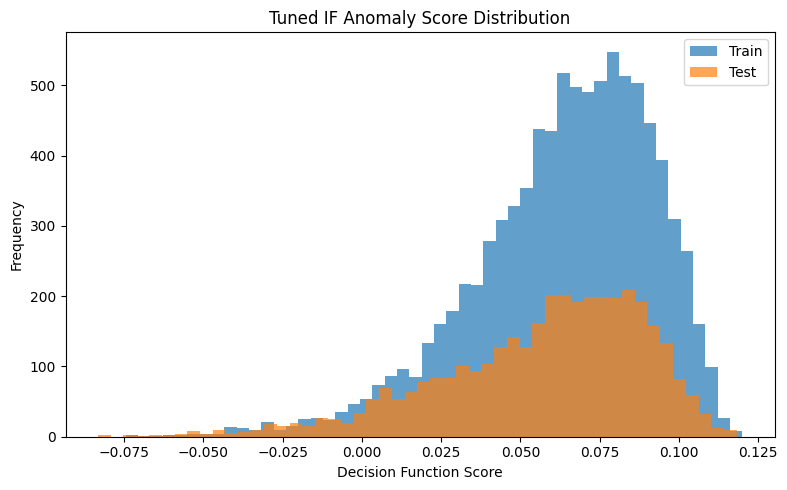

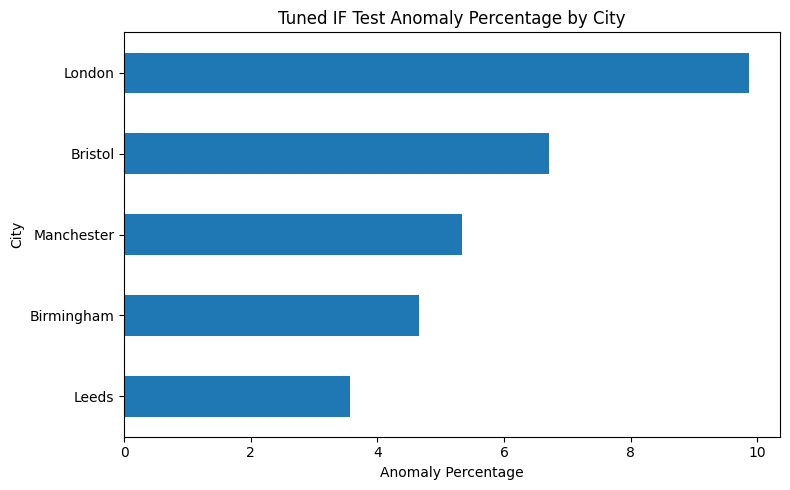

In [ ]:
# anomaly score distribution
plt.figure(figsize=(8, 5))
plt.hist(if_tuned_train_scores, bins=50, alpha=0.7, label="Train")
plt.hist(if_tuned_test_scores, bins=50, alpha=0.7, label="Test")
plt.title("Tuned IF Anomaly Score Distribution")
plt.xlabel("Decision Function Score")
plt.ylabel("Frequency")
plt.legend()
plt.tight_layout()
plt.show()

# city-wise test anomaly percentage
plt.figure(figsize=(8, 5))
tuned_if_test_city_anomaly.sort_values().plot(kind="barh")
plt.title("Tuned IF Test Anomaly Percentage by City")
plt.xlabel("Anomaly Percentage")
plt.ylabel("City")
plt.tight_layout()
plt.show()

In [ ]:
save_model_result(if_tuned_metrics)
show_saved_result(if_tuned_metrics)

      Model  Train Anomaly %  Test Anomaly %  Stability Gap %  Separation Score  Training Time (sec)  Prediction Time (sec)
0  Tuned IF           3.0033          6.0274           3.0241            0.0855               1.1737                 0.7648


baseline vs tuned isolation forest results
         Model  Train Anomaly %  Test Anomaly %  Stability Gap %  Separation Score  Training Time (sec)  Prediction Time (sec)
0  Baseline IF           5.0056          9.9178           4.9122            0.0742               0.8141                 0.2497
1     Tuned IF           3.0033          6.0274           3.0241            0.0855               1.1737                 0.7648


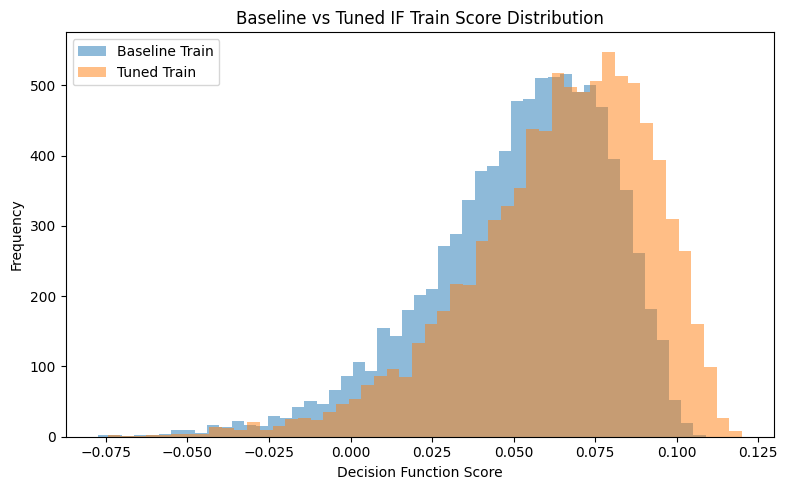

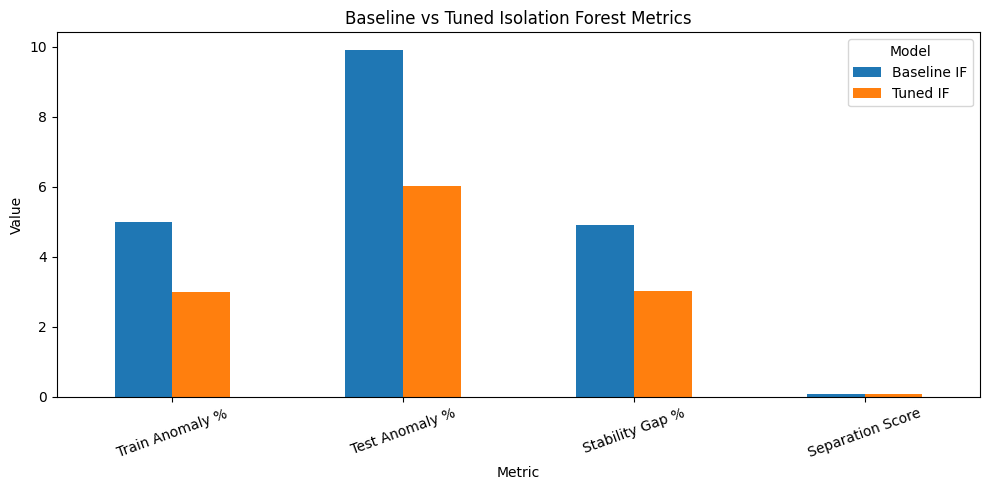

In [ ]:
# baseline vs tuned comparison table
if_results = pd.DataFrame([
    if_baseline_metrics,
    if_tuned_metrics
])

print("baseline vs tuned isolation forest results")
print(if_results)

# anomaly score comparison
plt.figure(figsize=(8, 5))
plt.hist(if_baseline_train_scores, bins=50, alpha=0.5, label="Baseline Train")
plt.hist(if_tuned_train_scores, bins=50, alpha=0.5, label="Tuned Train")
plt.title("Baseline vs Tuned IF Train Score Distribution")
plt.xlabel("Decision Function Score")
plt.ylabel("Frequency")
plt.legend()
plt.tight_layout()
plt.show()

# baseline vs tuned metric comparison
if_plot_df = if_results.set_index("Model")[["Train Anomaly %", "Test Anomaly %", "Stability Gap %", "Separation Score"]].T

if_plot_df.plot(kind="bar", figsize=(10, 5))
plt.title("Baseline vs Tuned Isolation Forest Metrics")
plt.xlabel("Metric")
plt.ylabel("Value")
plt.xticks(rotation=20)
plt.tight_layout()
plt.show()

**baseline LSTM**

train sequence shape (8961, 30, 43)
test sequence shape (3621, 30, 43)
epoch 1/30 loss 0.761872
epoch 2/30 loss 0.616368
epoch 3/30 loss 0.583457
epoch 4/30 loss 0.568842
epoch 5/30 loss 0.556276
epoch 6/30 loss 0.545610
epoch 7/30 loss 0.537474
epoch 8/30 loss 0.529283
epoch 9/30 loss 0.527724
epoch 10/30 loss 0.516299
epoch 11/30 loss 0.512996
epoch 12/30 loss 0.508102
epoch 13/30 loss 0.508752
epoch 14/30 loss 0.499858
epoch 15/30 loss 0.496335
epoch 16/30 loss 0.492832
epoch 17/30 loss 0.495387
epoch 18/30 loss 0.496991
epoch 19/30 loss 0.492541
epoch 20/30 loss 0.486184
epoch 21/30 loss 0.485729
epoch 22/30 loss 0.479347
epoch 23/30 loss 0.478745
epoch 24/30 loss 0.476539
epoch 25/30 loss 0.475375
epoch 26/30 loss 0.475523
epoch 27/30 loss 0.473839
epoch 28/30 loss 0.473155
epoch 29/30 loss 0.475100
epoch 30/30 loss 0.469681
baseline LSTM threshold 0.751408
baseline LSTM metrics
Model: Baseline LSTM
Train Anomaly %: 4.9994
Test Anomaly %: 29.9365
Stability Gap %: 24.937
Separation

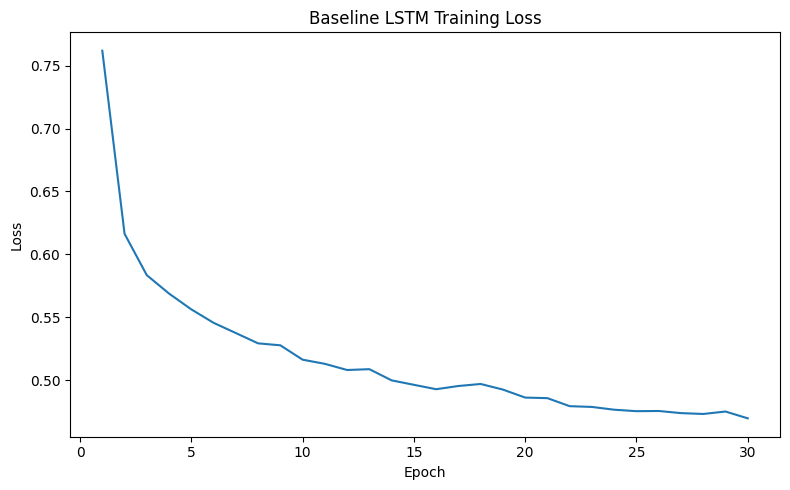

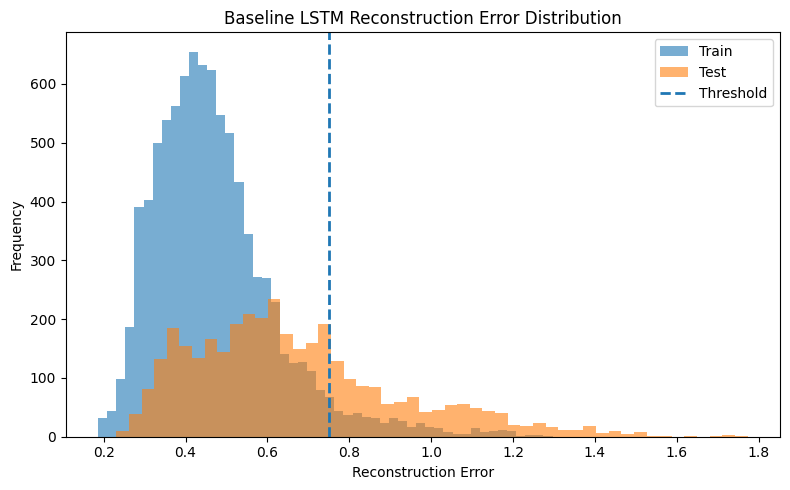

In [ ]:
# convert shared scaled features into sequences
X_train_seq = create_sequences(X_train_tabular_scaled.values, SEQUENCE_LENGTH)
X_test_seq = create_sequences(X_test_tabular_scaled.values, SEQUENCE_LENGTH)

print("train sequence shape", X_train_seq.shape)
print("test sequence shape", X_test_seq.shape)

# convert sequences to tensors
X_train_tensor = torch.tensor(X_train_seq, dtype=torch.float32).to(DEVICE)
X_test_tensor = torch.tensor(X_test_seq, dtype=torch.float32).to(DEVICE)

train_dataset_lstm = TensorDataset(X_train_tensor, X_train_tensor)
train_loader_lstm = DataLoader(train_dataset_lstm, batch_size=BATCH_SIZE, shuffle=True)

# baseline LSTM autoencoder
class BaselineLSTMAutoencoder(nn.Module):
    def __init__(self, n_features, hidden_size=64, latent_dim=32):
        super().__init__()
        self.encoder = nn.LSTM(
            input_size=n_features,
            hidden_size=hidden_size,
            batch_first=True
        )
        self.fc_enc = nn.Linear(hidden_size, latent_dim)
        self.fc_dec = nn.Linear(latent_dim, hidden_size)
        self.decoder = nn.LSTM(
            input_size=hidden_size,
            hidden_size=n_features,
            batch_first=True
        )

    def forward(self, x):
        encoded_seq, _ = self.encoder(x)
        last_hidden = encoded_seq[:, -1, :]
        latent = torch.relu(self.fc_enc(last_hidden))
        decoded_input = torch.relu(self.fc_dec(latent)).unsqueeze(1)
        decoded_input = decoded_input.repeat(1, x.size(1), 1)
        reconstructed, _ = self.decoder(decoded_input)
        return reconstructed

# initialise model
n_features = X_train_seq.shape[2]
baseline_lstm = BaselineLSTMAutoencoder(n_features=n_features).to(DEVICE)

criterion = nn.MSELoss()
optimizer = torch.optim.Adam(baseline_lstm.parameters(), lr=LEARNING_RATE)

# train baseline LSTM
baseline_lstm_epoch_losses = []

start_train = time.time()

for epoch in range(BASELINE_LSTM_EPOCHS):
    baseline_lstm.train()
    epoch_loss = 0.0

    for batch_x, _ in train_loader_lstm:
        batch_x = batch_x.to(DEVICE)

        optimizer.zero_grad()
        output = baseline_lstm(batch_x)
        loss = criterion(output, batch_x)
        loss.backward()
        optimizer.step()

        epoch_loss += loss.item()

    avg_epoch_loss = epoch_loss / len(train_loader_lstm)
    baseline_lstm_epoch_losses.append(avg_epoch_loss)

    print(f"epoch {epoch + 1}/{BASELINE_LSTM_EPOCHS} loss {avg_epoch_loss:.6f}")

end_train = time.time()
baseline_lstm_training_time = end_train - start_train

# get reconstruction errors
baseline_train_loss, baseline_train_pred_time = get_reconstruction_errors(
    model=baseline_lstm,
    data_tensor=X_train_tensor,
    data_seq=X_train_seq
)

baseline_test_loss, baseline_test_pred_time = get_reconstruction_errors(
    model=baseline_lstm,
    data_tensor=X_test_tensor,
    data_seq=X_test_seq
)

baseline_lstm_prediction_time = baseline_train_pred_time + baseline_test_pred_time

# define consistent threshold from train distribution
baseline_lstm_threshold = np.percentile(baseline_train_loss, 95)

print("baseline LSTM threshold", round(baseline_lstm_threshold, 6))

# evaluate baseline LSTM
lstm_baseline_metrics, lstm_baseline_train_preds, lstm_baseline_test_preds = evaluate_lstm_model(
    train_loss=baseline_train_loss,
    test_loss=baseline_test_loss,
    threshold=baseline_lstm_threshold,
    model_name="Baseline LSTM",
    training_time_sec=baseline_lstm_training_time,
    prediction_time_sec=baseline_lstm_prediction_time
)

print("baseline LSTM metrics")
print_metrics(lstm_baseline_metrics)

# save result for final comparison
save_model_result(lstm_baseline_metrics)
show_saved_result(lstm_baseline_metrics)

# learning curve
plt.figure(figsize=(8, 5))
plt.plot(range(1, len(baseline_lstm_epoch_losses) + 1), baseline_lstm_epoch_losses)
plt.title("Baseline LSTM Training Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.tight_layout()
plt.show()

# reconstruction error distribution
plt.figure(figsize=(8, 5))
plt.hist(baseline_train_loss, bins=50, alpha=0.6, label="Train")
plt.hist(baseline_test_loss, bins=50, alpha=0.6, label="Test")
plt.axvline(baseline_lstm_threshold, linestyle="--", linewidth=2, label="Threshold")
plt.title("Baseline LSTM Reconstruction Error Distribution")
plt.xlabel("Reconstruction Error")
plt.ylabel("Frequency")
plt.legend()
plt.tight_layout()
plt.show()

**tuned LSTM**

In [ ]:
# create validation split from train sequences
val_ratio = 0.15
n_train_seq = len(X_train_seq)
val_size = int(n_train_seq * val_ratio)
train_size = n_train_seq - val_size

X_train_seq_sub = X_train_seq[:train_size]
X_val_seq = X_train_seq[train_size:]

X_train_sub_tensor = torch.tensor(X_train_seq_sub, dtype=torch.float32).to(DEVICE)
X_val_tensor = torch.tensor(X_val_seq, dtype=torch.float32).to(DEVICE)

train_dataset_tuned_lstm = TensorDataset(X_train_sub_tensor, X_train_sub_tensor)
val_dataset_tuned_lstm = TensorDataset(X_val_tensor, X_val_tensor)

# tuned LSTM autoencoder
class TunedLSTMAutoencoder(nn.Module):
    def __init__(self, n_features, hidden_size=128, latent_dim=64, num_layers=2, dropout=0.2):
        super().__init__()

        enc_dropout = dropout if num_layers > 1 else 0.0
        dec_dropout = dropout if num_layers > 1 else 0.0

        self.encoder = nn.LSTM(
            input_size=n_features,
            hidden_size=hidden_size,
            num_layers=num_layers,
            dropout=enc_dropout,
            batch_first=True
        )

        self.fc_enc = nn.Linear(hidden_size, latent_dim)
        self.fc_dec = nn.Linear(latent_dim, hidden_size)

        self.decoder = nn.LSTM(
            input_size=hidden_size,
            hidden_size=hidden_size,
            num_layers=num_layers,
            dropout=dec_dropout,
            batch_first=True
        )

        self.output_layer = nn.Linear(hidden_size, n_features)

    def forward(self, x):
        encoded_seq, _ = self.encoder(x)
        last_hidden = encoded_seq[:, -1, :]
        latent = torch.relu(self.fc_enc(last_hidden))
        repeated = torch.relu(self.fc_dec(latent)).unsqueeze(1).repeat(1, x.size(1), 1)
        decoded_seq, _ = self.decoder(repeated)
        reconstructed = self.output_layer(decoded_seq)
        return reconstructed

# train helper for tuned LSTM
def train_tuned_lstm(model, train_loader, val_loader, lr=0.001, epochs=40, weight_decay=1e-5, patience=8):
    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer,
        mode="min",
        factor=0.5,
        patience=3
    )

    best_model_state = None
    best_val_loss = float("inf")
    patience_counter = 0

    history = {
        "train_loss": [],
        "val_loss": [],
        "lr": []
    }

    start_train = time.time()

    for epoch in range(epochs):
        model.train()
        epoch_train_loss = 0.0

        for batch_x, _ in train_loader:
            batch_x = batch_x.to(DEVICE)

            optimizer.zero_grad()
            output = model(batch_x)
            loss = criterion(output, batch_x)
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            optimizer.step()

            epoch_train_loss += loss.item()

        epoch_train_loss = epoch_train_loss / len(train_loader)

        model.eval()
        epoch_val_loss = 0.0

        with torch.no_grad():
            for batch_x, _ in val_loader:
                batch_x = batch_x.to(DEVICE)
                output = model(batch_x)
                loss = criterion(output, batch_x)
                epoch_val_loss += loss.item()

        epoch_val_loss = epoch_val_loss / len(val_loader)
        scheduler.step(epoch_val_loss)

        current_lr = optimizer.param_groups[0]["lr"]

        history["train_loss"].append(epoch_train_loss)
        history["val_loss"].append(epoch_val_loss)
        history["lr"].append(current_lr)

        print(f"epoch {epoch + 1}/{epochs} train_loss {epoch_train_loss:.6f} val_loss {epoch_val_loss:.6f} lr {current_lr:.6f}")

        if epoch_val_loss < best_val_loss:
            best_val_loss = epoch_val_loss
            best_model_state = {k: v.detach().cpu().clone() for k, v in model.state_dict().items()}
            patience_counter = 0
        else:
            patience_counter += 1

        if patience_counter >= patience:
            print("early stopping triggered")
            break

    end_train = time.time()
    training_time_sec = end_train - start_train

    model.load_state_dict(best_model_state)

    return model, history, best_val_loss, training_time_sec

# parameter grid for tuned LSTM
lstm_param_grid = [
    {"hidden_size": 64, "latent_dim": 32, "num_layers": 1, "dropout": 0.0, "batch_size": 64, "lr": 0.001, "epochs": 35},
    {"hidden_size": 128, "latent_dim": 32, "num_layers": 1, "dropout": 0.0, "batch_size": 64, "lr": 0.001, "epochs": 40},
    {"hidden_size": 128, "latent_dim": 64, "num_layers": 2, "dropout": 0.2, "batch_size": 64, "lr": 0.001, "epochs": 40},
    {"hidden_size": 128, "latent_dim": 64, "num_layers": 2, "dropout": 0.3, "batch_size": 128, "lr": 0.0005, "epochs": 45},
    {"hidden_size": 256, "latent_dim": 64, "num_layers": 2, "dropout": 0.2, "batch_size": 64, "lr": 0.0005, "epochs": 45}
]

best_tuned_lstm_score = -np.inf
best_tuned_lstm_model = None
best_tuned_lstm_params = None
best_tuned_lstm_history = None
best_tuned_lstm_threshold = None
best_tuned_lstm_train_loss = None
best_tuned_lstm_test_loss = None
best_tuned_lstm_training_time = None
best_tuned_lstm_prediction_time = None
best_tuned_lstm_metrics_internal = None

tuned_lstm_trials = []

for i, params in enumerate(lstm_param_grid, start=1):
    print(f"trial {i}/{len(lstm_param_grid)}")
    print(params)

    train_loader_tuned = DataLoader(
        train_dataset_tuned_lstm,
        batch_size=params["batch_size"],
        shuffle=True
    )

    val_loader_tuned = DataLoader(
        val_dataset_tuned_lstm,
        batch_size=params["batch_size"],
        shuffle=False
    )

    candidate_model = TunedLSTMAutoencoder(
        n_features=X_train_seq.shape[2],
        hidden_size=params["hidden_size"],
        latent_dim=params["latent_dim"],
        num_layers=params["num_layers"],
        dropout=params["dropout"]
    ).to(DEVICE)

    candidate_model, candidate_history, candidate_best_val_loss, candidate_training_time = train_tuned_lstm(
        model=candidate_model,
        train_loader=train_loader_tuned,
        val_loader=val_loader_tuned,
        lr=params["lr"],
        epochs=params["epochs"],
        weight_decay=1e-5,
        patience=8
    )

    full_train_tensor = torch.tensor(X_train_seq, dtype=torch.float32).to(DEVICE)
    full_test_tensor = torch.tensor(X_test_seq, dtype=torch.float32).to(DEVICE)

    candidate_train_loss, candidate_train_pred_time = get_reconstruction_errors(
        model=candidate_model,
        data_tensor=full_train_tensor,
        data_seq=X_train_seq
    )

    candidate_test_loss, candidate_test_pred_time = get_reconstruction_errors(
        model=candidate_model,
        data_tensor=full_test_tensor,
        data_seq=X_test_seq
    )

    candidate_prediction_time = candidate_train_pred_time + candidate_test_pred_time

    # use same thresholding policy as baseline for consistency
    candidate_threshold = np.percentile(candidate_train_loss, 95)

    candidate_metrics, candidate_train_preds, candidate_test_preds = evaluate_lstm_model(
        train_loss=candidate_train_loss,
        test_loss=candidate_test_loss,
        threshold=candidate_threshold,
        model_name="Tuned LSTM",
        training_time_sec=candidate_training_time,
        prediction_time_sec=candidate_prediction_time
    )

    candidate_sep = candidate_metrics["Separation Score"]
    candidate_gap = candidate_metrics["Stability Gap %"]
    candidate_test_anom = candidate_metrics["Test Anomaly %"]

    if np.isnan(candidate_sep):
        candidate_score = -np.inf
    else:
        candidate_score = candidate_sep - (0.25 * candidate_gap)
        if candidate_test_anom < 0.20:
            candidate_score -= 0.50

    trial_result = {
        "trial": i,
        "hidden_size": params["hidden_size"],
        "latent_dim": params["latent_dim"],
        "num_layers": params["num_layers"],
        "dropout": params["dropout"],
        "batch_size": params["batch_size"],
        "lr": params["lr"],
        "epochs": params["epochs"],
        "best_val_loss": round(candidate_best_val_loss, 6),
        "Train Anomaly %": candidate_metrics["Train Anomaly %"],
        "Test Anomaly %": candidate_metrics["Test Anomaly %"],
        "Stability Gap %": candidate_metrics["Stability Gap %"],
        "Separation Score": candidate_metrics["Separation Score"],
        "Training Time (sec)": candidate_metrics["Training Time (sec)"],
        "Prediction Time (sec)": candidate_metrics["Prediction Time (sec)"],
        "selection_score": round(candidate_score, 4)
    }

    tuned_lstm_trials.append(trial_result)
    print(pd.Series(trial_result))

    if candidate_score > best_tuned_lstm_score:
        best_tuned_lstm_score = candidate_score
        best_tuned_lstm_model = candidate_model
        best_tuned_lstm_params = params
        best_tuned_lstm_history = candidate_history
        best_tuned_lstm_threshold = candidate_threshold
        best_tuned_lstm_train_loss = candidate_train_loss
        best_tuned_lstm_test_loss = candidate_test_loss
        best_tuned_lstm_training_time = candidate_training_time
        best_tuned_lstm_prediction_time = candidate_prediction_time
        best_tuned_lstm_metrics_internal = candidate_metrics

print("best tuned LSTM parameters")
print(best_tuned_lstm_params)

tuned_lstm_trials_df = pd.DataFrame(tuned_lstm_trials).sort_values(
    by=["selection_score", "Separation Score"],
    ascending=False
).reset_index(drop=True)

print("tuned LSTM trial summary")
print(tuned_lstm_trials_df)

# final tuned LSTM metrics
lstm_tuned_metrics, lstm_tuned_train_preds, lstm_tuned_test_preds = evaluate_lstm_model(
    train_loss=best_tuned_lstm_train_loss,
    test_loss=best_tuned_lstm_test_loss,
    threshold=best_tuned_lstm_threshold,
    model_name="Tuned LSTM",
    training_time_sec=best_tuned_lstm_training_time,
    prediction_time_sec=best_tuned_lstm_prediction_time
)

print("tuned LSTM metrics")
print_metrics(lstm_tuned_metrics)

# save result for final comparison
save_model_result(lstm_tuned_metrics)
show_saved_result(lstm_tuned_metrics)



trial 1/5
{'hidden_size': 64, 'latent_dim': 32, 'num_layers': 1, 'dropout': 0.0, 'batch_size': 64, 'lr': 0.001, 'epochs': 35}
epoch 1/35 train_loss 0.785142 val_loss 0.705796 lr 0.001000
epoch 2/35 train_loss 0.606143 val_loss 0.617661 lr 0.001000
epoch 3/35 train_loss 0.553044 val_loss 0.583885 lr 0.001000
epoch 4/35 train_loss 0.525103 val_loss 0.573122 lr 0.001000
epoch 5/35 train_loss 0.500603 val_loss 0.554128 lr 0.001000
epoch 6/35 train_loss 0.479554 val_loss 0.536614 lr 0.001000
epoch 7/35 train_loss 0.462894 val_loss 0.529526 lr 0.001000
epoch 8/35 train_loss 0.451641 val_loss 0.510760 lr 0.001000
epoch 9/35 train_loss 0.441508 val_loss 0.510275 lr 0.001000
epoch 10/35 train_loss 0.431273 val_loss 0.503242 lr 0.001000
epoch 11/35 train_loss 0.424448 val_loss 0.498485 lr 0.001000
epoch 12/35 train_loss 0.414566 val_loss 0.491075 lr 0.001000
epoch 13/35 train_loss 0.412584 val_loss 0.484418 lr 0.001000
epoch 14/35 train_loss 0.402842 val_loss 0.477965 lr 0.001000
epoch 15/35 tra

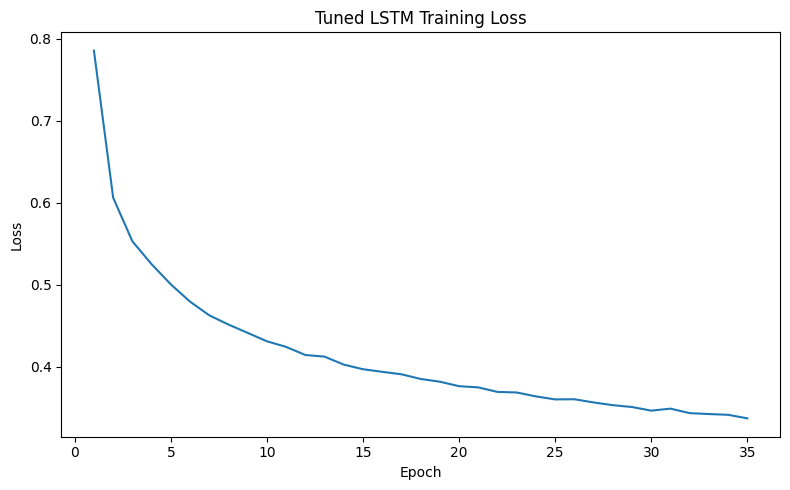

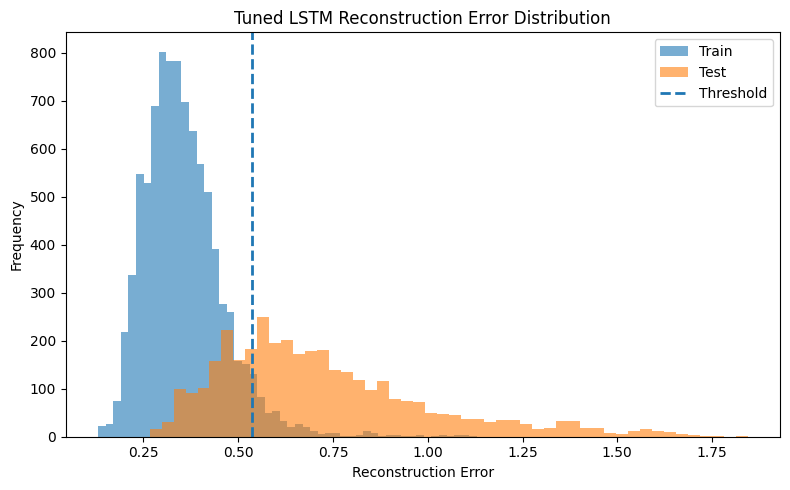

In [ ]:
# learning curve
plt.figure(figsize=(8, 5))
plt.plot(range(1, len(best_tuned_lstm_history["train_loss"]) + 1), best_tuned_lstm_history["train_loss"])
plt.title("Tuned LSTM Training Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.tight_layout()
plt.show()

# reconstruction error distribution
plt.figure(figsize=(8, 5))
plt.hist(best_tuned_lstm_train_loss, bins=50, alpha=0.6, label="Train")
plt.hist(best_tuned_lstm_test_loss, bins=50, alpha=0.6, label="Test")
plt.axvline(best_tuned_lstm_threshold, linestyle="--", linewidth=2, label="Threshold")
plt.title("Tuned LSTM Reconstruction Error Distribution")
plt.xlabel("Reconstruction Error")
plt.ylabel("Frequency")
plt.legend()
plt.tight_layout()
plt.show()

baseline vs tuned LSTM results
           Model  Train Anomaly %  Test Anomaly %  Stability Gap %  Separation Score  Training Time (sec)  Prediction Time (sec)
0  Baseline LSTM           4.9994         29.9365          24.9370            0.4666              18.1381                 0.0906
1     Tuned LSTM           4.9994         72.9357          67.9362            0.3003              23.8379                 0.1063


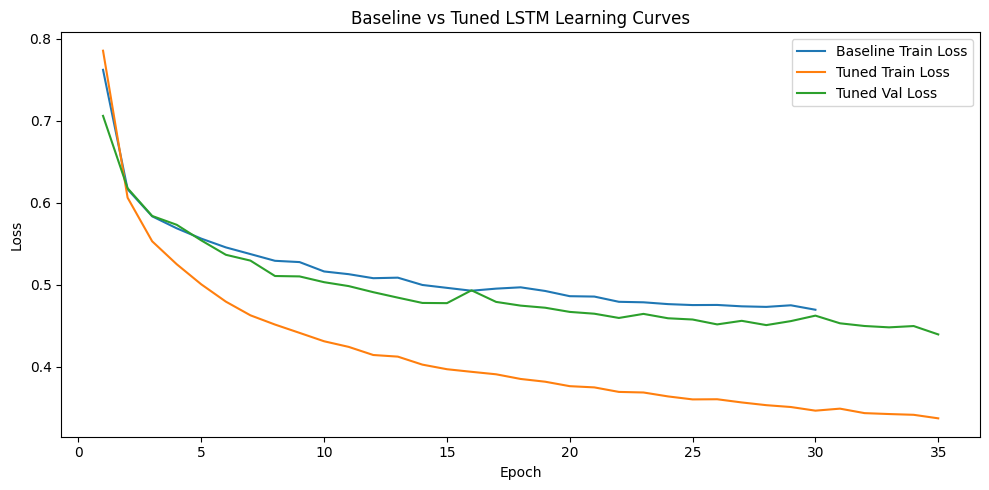

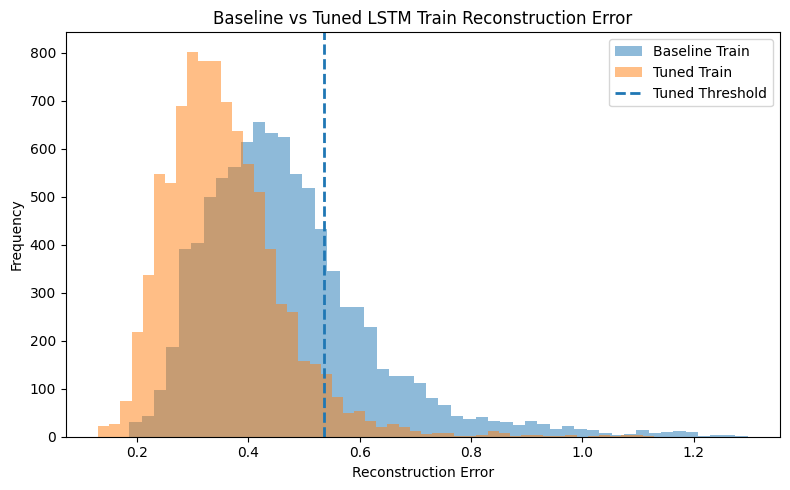

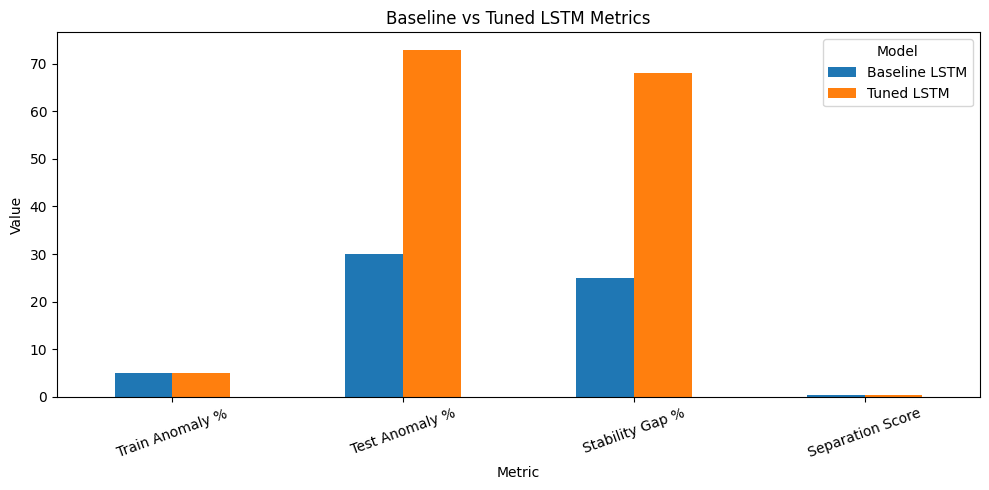

In [ ]:
# baseline vs tuned LSTM results
lstm_results = pd.DataFrame([
    lstm_baseline_metrics,
    lstm_tuned_metrics
])

print("baseline vs tuned LSTM results")
print(lstm_results)

# learning curves
plt.figure(figsize=(10, 5))
plt.plot(range(1, len(baseline_lstm_epoch_losses) + 1), baseline_lstm_epoch_losses, label="Baseline Train Loss")
plt.plot(range(1, len(best_tuned_lstm_history["train_loss"]) + 1), best_tuned_lstm_history["train_loss"], label="Tuned Train Loss")
plt.plot(range(1, len(best_tuned_lstm_history["val_loss"]) + 1), best_tuned_lstm_history["val_loss"], label="Tuned Val Loss")
plt.title("Baseline vs Tuned LSTM Learning Curves")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.tight_layout()
plt.show()

# reconstruction error comparison
plt.figure(figsize=(8, 5))
plt.hist(baseline_train_loss, bins=50, alpha=0.5, label="Baseline Train")
plt.hist(best_tuned_lstm_train_loss, bins=50, alpha=0.5, label="Tuned Train")
plt.axvline(best_tuned_lstm_threshold, linestyle="--", linewidth=2, label="Tuned Threshold")
plt.title("Baseline vs Tuned LSTM Train Reconstruction Error")
plt.xlabel("Reconstruction Error")
plt.ylabel("Frequency")
plt.legend()
plt.tight_layout()
plt.show()

# baseline vs tuned metrics plot
lstm_plot_df = lstm_results.set_index("Model")[["Train Anomaly %", "Test Anomaly %", "Stability Gap %", "Separation Score"]].T

lstm_plot_df.plot(kind="bar", figsize=(10, 5))
plt.title("Baseline vs Tuned LSTM Metrics")
plt.xlabel("Metric")
plt.ylabel("Value")
plt.xticks(rotation=20)
plt.tight_layout()
plt.show()

**final comparison of all model results**

final comparison table
           Model  Train Anomaly %  Test Anomaly %  Stability Gap %  Separation Score  Training Time (sec)  Prediction Time (sec)
0    Baseline IF           5.0056          9.9178           4.9122            0.0742               0.8141                 0.2497
1    Baseline IF           5.0056          9.9178           4.9122            0.0742               0.8141                 0.2497
2       Tuned IF           3.0033          6.0274           3.0241            0.0855               1.1737                 0.7648
3  Baseline LSTM           4.9994         29.9365          24.9370            0.4666              18.1381                 0.0906
4     Tuned LSTM           4.9994         72.9357          67.9362            0.3003              23.8379                 0.1063
ranked by separation score
           Model  Train Anomaly %  Test Anomaly %  Stability Gap %  Separation Score  Training Time (sec)  Prediction Time (sec)
0  Baseline LSTM           4.9994         29.93

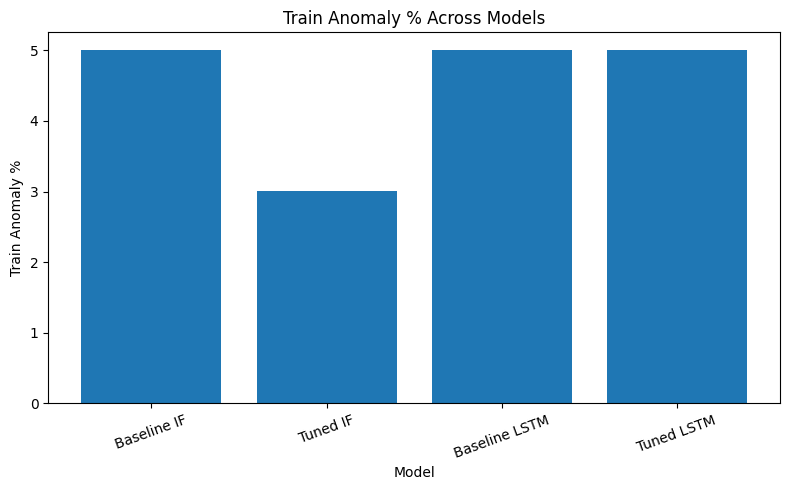

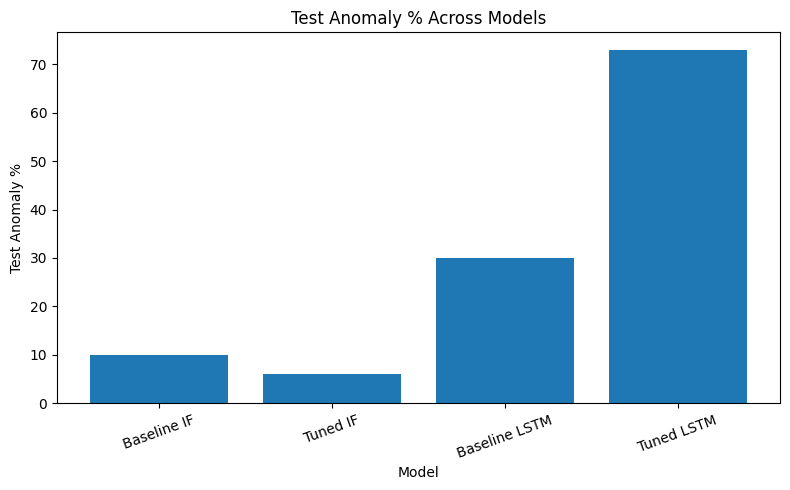

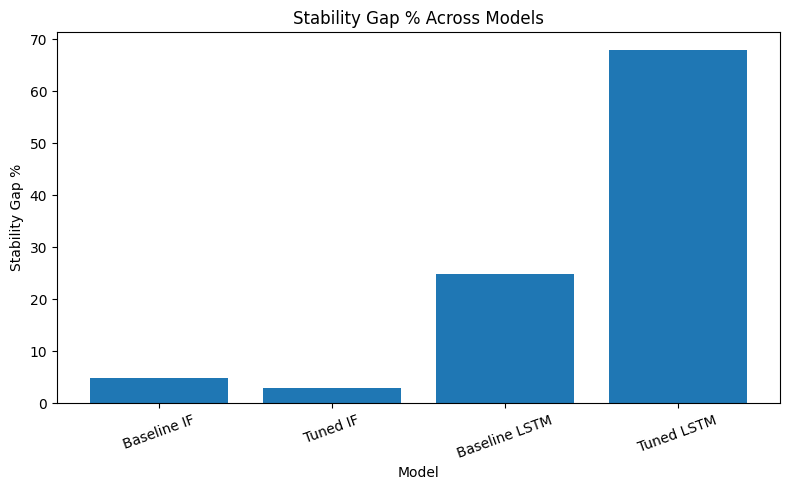

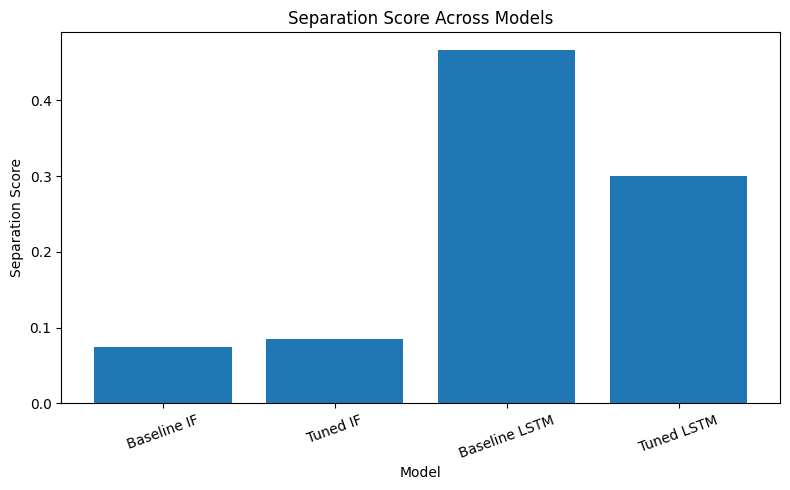

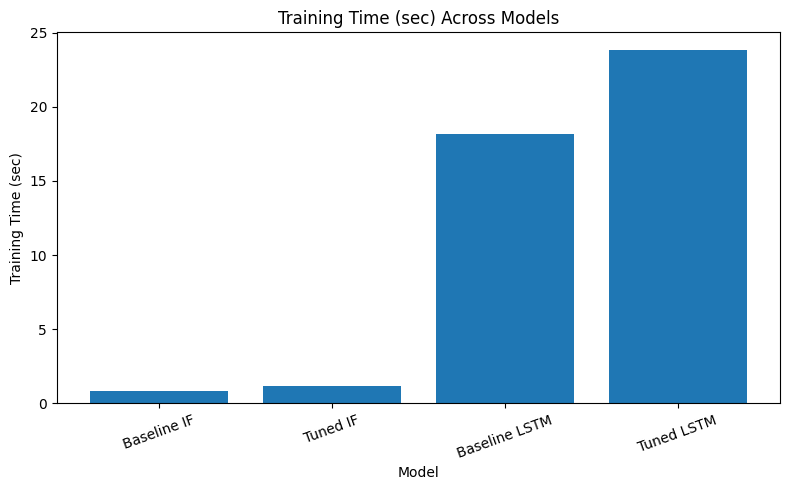

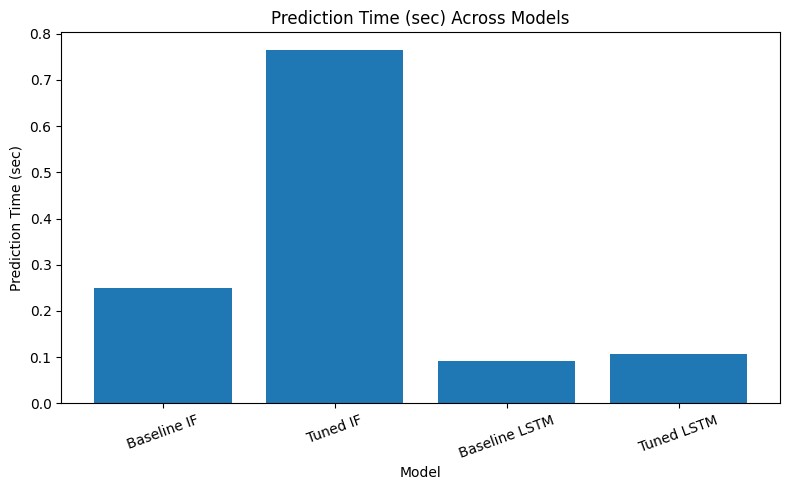

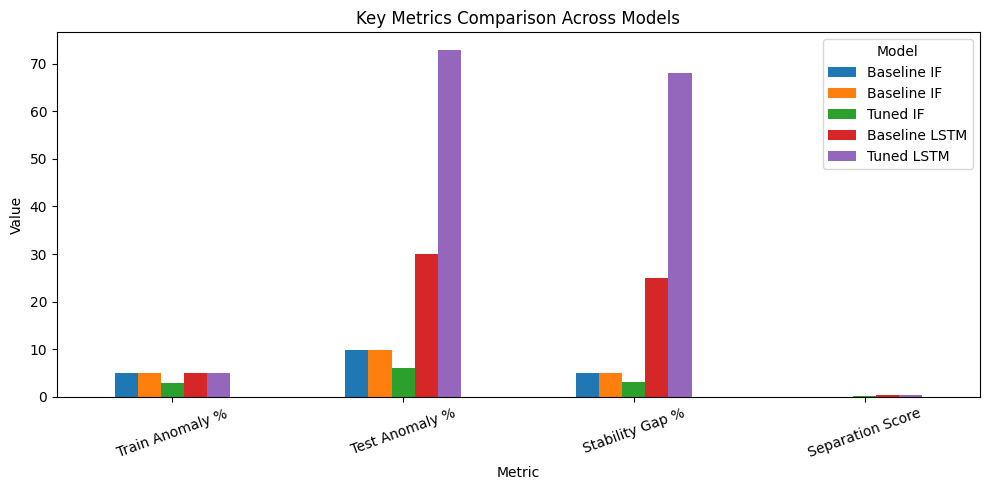

final ranked comparison
           Model  Train Anomaly %  Test Anomaly %  Stability Gap %  Separation Score  Training Time (sec)  Prediction Time (sec)  rank_separation  rank_stability  rank_prediction_time  \
0  Baseline LSTM           4.9994         29.9365          24.9370            0.4666              18.1381                 0.0906              1.0             4.0                   1.0   
1     Tuned LSTM           4.9994         72.9357          67.9362            0.3003              23.8379                 0.1063              2.0             5.0                   2.0   
2       Tuned IF           3.0033          6.0274           3.0241            0.0855               1.1737                 0.7648              3.0             1.0                   5.0   
3    Baseline IF           5.0056          9.9178           4.9122            0.0742               0.8141                 0.2497              4.0             2.0                   3.0   
4    Baseline IF           5.0056        

In [ ]:
if "if_baseline_metrics" in globals():
    if not any((m.get("Model") == if_baseline_metrics.get("Model")) for m in all_model_metrics):
        save_model_result(if_baseline_metrics)

if "if_tuned_metrics" in globals():
    if not any((m.get("Model") == if_tuned_metrics.get("Model")) for m in all_model_metrics):
        save_model_result(if_tuned_metrics)

if "lstm_baseline_metrics" in globals():
    if not any((m.get("Model") == lstm_baseline_metrics.get("Model")) for m in all_model_metrics):
        save_model_result(lstm_baseline_metrics)

if "lstm_tuned_metrics" in globals():
    if not any((m.get("Model") == lstm_tuned_metrics.get("Model")) for m in all_model_metrics):
        save_model_result(lstm_tuned_metrics)

# build final comparison table
final_results_df = build_final_results_df()

print("final comparison table")
print(final_results_df)

# sort useful ranked views
final_results_by_separation = final_results_df.sort_values(
    by=["Separation Score", "Stability Gap %"],
    ascending=[False, True]
).reset_index(drop=True)

print("ranked by separation score")
print(final_results_by_separation)

final_results_by_stability = final_results_df.sort_values(
    by=["Stability Gap %", "Separation Score"],
    ascending=[True, False]
).reset_index(drop=True)

print("ranked by stability gap")
print(final_results_by_stability)

# comparison plots
plot_metrics = [
    "Train Anomaly %",
    "Test Anomaly %",
    "Stability Gap %",
    "Separation Score",
    "Training Time (sec)",
    "Prediction Time (sec)"
]

for metric in plot_metrics:
    plt.figure(figsize=(8, 5))
    plt.bar(final_results_df["Model"], final_results_df[metric])
    plt.title(f"{metric} Across Models")
    plt.xlabel("Model")
    plt.ylabel(metric)
    plt.xticks(rotation=20)
    plt.tight_layout()
    plt.show()

# compact comparison plot for key performance metrics
key_metrics_df = final_results_df.set_index("Model")[
    ["Train Anomaly %", "Test Anomaly %", "Stability Gap %", "Separation Score"]
].T

key_metrics_df.plot(kind="bar", figsize=(10, 5))
plt.title("Key Metrics Comparison Across Models")
plt.xlabel("Metric")
plt.ylabel("Value")
plt.xticks(rotation=20)
plt.tight_layout()
plt.show()

# best model selection rule
# higher separation is better
# lower stability gap is better
# lower prediction time is better
comparison_df = final_results_df.copy()

comparison_df["rank_separation"] = comparison_df["Separation Score"].rank(ascending=False, method="min")
comparison_df["rank_stability"] = comparison_df["Stability Gap %"].rank(ascending=True, method="min")
comparison_df["rank_prediction_time"] = comparison_df["Prediction Time (sec)"].rank(ascending=True, method="min")

comparison_df["overall_rank_score"] = (
    comparison_df["rank_separation"] +
    comparison_df["rank_stability"] +
    comparison_df["rank_prediction_time"]
)

comparison_df = comparison_df.sort_values(
    by=["overall_rank_score", "Separation Score", "Stability Gap %"],
    ascending=[True, False, True]
).reset_index(drop=True)

print("final ranked comparison")
print(comparison_df)

best_model_name = comparison_df.iloc[0]["Model"]
print("selected best model", best_model_name)

**LSTM threshold sensitivity analysis**

In [ ]:
# threshold candidates for baseline LSTM
baseline_thresholds = {
    "p95": np.percentile(baseline_train_loss, 95),
    "p97": np.percentile(baseline_train_loss, 97),
    "p99": np.percentile(baseline_train_loss, 99),
    "mean_plus_2std": baseline_train_loss.mean() + 2 * baseline_train_loss.std(),
    "mean_plus_3std": baseline_train_loss.mean() + 3 * baseline_train_loss.std()
}

baseline_lstm_threshold_results = []

for threshold_name, threshold_value in baseline_thresholds.items():
    metrics, train_preds, test_preds = evaluate_lstm_model(
        train_loss=baseline_train_loss,
        test_loss=baseline_test_loss,
        threshold=threshold_value,
        model_name=f"Baseline LSTM {threshold_name}",
        training_time_sec=baseline_lstm_training_time,
        prediction_time_sec=baseline_lstm_prediction_time
    )

    row = metrics.copy()
    row["Threshold Name"] = threshold_name
    row["Threshold Value"] = round(float(threshold_value), 6)
    baseline_lstm_threshold_results.append(row)

baseline_lstm_threshold_df = pd.DataFrame(baseline_lstm_threshold_results)

print("baseline LSTM threshold sensitivity")
print(baseline_lstm_threshold_df)

# threshold candidates for tuned LSTM
tuned_thresholds = {
    "p95": np.percentile(best_tuned_lstm_train_loss, 95),
    "p97": np.percentile(best_tuned_lstm_train_loss, 97),
    "p99": np.percentile(best_tuned_lstm_train_loss, 99),
    "mean_plus_2std": best_tuned_lstm_train_loss.mean() + 2 * best_tuned_lstm_train_loss.std(),
    "mean_plus_3std": best_tuned_lstm_train_loss.mean() + 3 * best_tuned_lstm_train_loss.std()
}

tuned_lstm_threshold_results = []

for threshold_name, threshold_value in tuned_thresholds.items():
    metrics, train_preds, test_preds = evaluate_lstm_model(
        train_loss=best_tuned_lstm_train_loss,
        test_loss=best_tuned_lstm_test_loss,
        threshold=threshold_value,
        model_name=f"Tuned LSTM {threshold_name}",
        training_time_sec=best_tuned_lstm_training_time,
        prediction_time_sec=best_tuned_lstm_prediction_time
    )

    row = metrics.copy()
    row["Threshold Name"] = threshold_name
    row["Threshold Value"] = round(float(threshold_value), 6)
    tuned_lstm_threshold_results.append(row)

tuned_lstm_threshold_df = pd.DataFrame(tuned_lstm_threshold_results)

print("tuned LSTM threshold sensitivity")
print(tuned_lstm_threshold_df)

baseline LSTM threshold sensitivity
                          Model  Train Anomaly %  Test Anomaly %  Stability Gap %  Separation Score  Training Time (sec)  Prediction Time (sec)  Threshold Name  Threshold Value
0             Baseline LSTM p95           4.9994         29.9365          24.9370            0.4666              18.1381                 0.0906             p95         0.751408
1             Baseline LSTM p97           3.0019         20.7677          17.7658            0.5380              18.1381                 0.0906             p97         0.847615
2             Baseline LSTM p99           1.0044         11.7923          10.7880            0.6660              18.1381                 0.0906             p99         1.016486
3  Baseline LSTM mean_plus_2std           4.3522         26.6225          22.2703            0.4869              18.1381                 0.0906  mean_plus_2std         0.778888
4  Baseline LSTM mean_plus_3std           1.8413         15.7967          13.95

In [ ]:
# choose a more balanced LSTM threshold

baseline_lstm_threshold_df = baseline_lstm_threshold_df.sort_values(
    by=["Stability Gap %", "Separation Score"],
    ascending=[True, False]
).reset_index(drop=True)

tuned_lstm_threshold_df = tuned_lstm_threshold_df.sort_values(
    by=["Stability Gap %", "Separation Score"],
    ascending=[True, False]
).reset_index(drop=True)

print("best baseline LSTM threshold candidate")
print(baseline_lstm_threshold_df.head(1))

print("best tuned LSTM threshold candidate")
print(tuned_lstm_threshold_df.head(1))

best baseline LSTM threshold candidate
               Model  Train Anomaly %  Test Anomaly %  Stability Gap %  Separation Score  Training Time (sec)  Prediction Time (sec) Threshold Name  Threshold Value
0  Baseline LSTM p99           1.0044         11.7923           10.788             0.666              18.1381                 0.0906            p99         1.016486
best tuned LSTM threshold candidate
            Model  Train Anomaly %  Test Anomaly %  Stability Gap %  Separation Score  Training Time (sec)  Prediction Time (sec) Threshold Name  Threshold Value
0  Tuned LSTM p99           1.0044         45.8989          44.8946            0.5009              23.8379                 0.1063            p99         0.689448


**detailed results analysis**

model
Baseline IF
train shape
(8990, 50)
test shape
(3650, 50)
train anomaly percentage by city
city
London        8.231
Bristol       5.395
Manchester    4.839
Birmingham    3.949
Leeds         2.614
Name: anomaly, dtype: float64
test anomaly percentage by city
city
London        13.562
Bristol       11.233
Manchester     9.863
Birmingham     8.630
Leeds          6.301
Name: anomaly, dtype: float64
city comparison
            Train Anomaly %  Test Anomaly %
city                                       
London                8.231          13.562
Bristol               5.395          11.233
Manchester            4.839           9.863
Birmingham            3.949           8.630
Leeds                 2.614           6.301


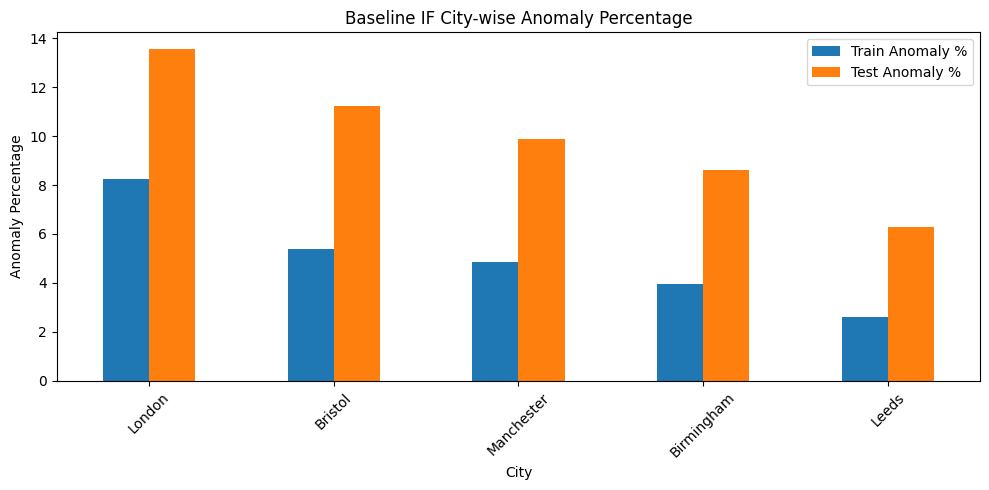

year-wise anomaly percentage
   year  anomaly dataset
0  2016    1.958   Train
1  2017    2.356   Train
2  2018    8.603   Train
3  2019    3.726   Train
4  2020    8.142   Train
0  2021    8.438    Test
1  2022   11.397    Test


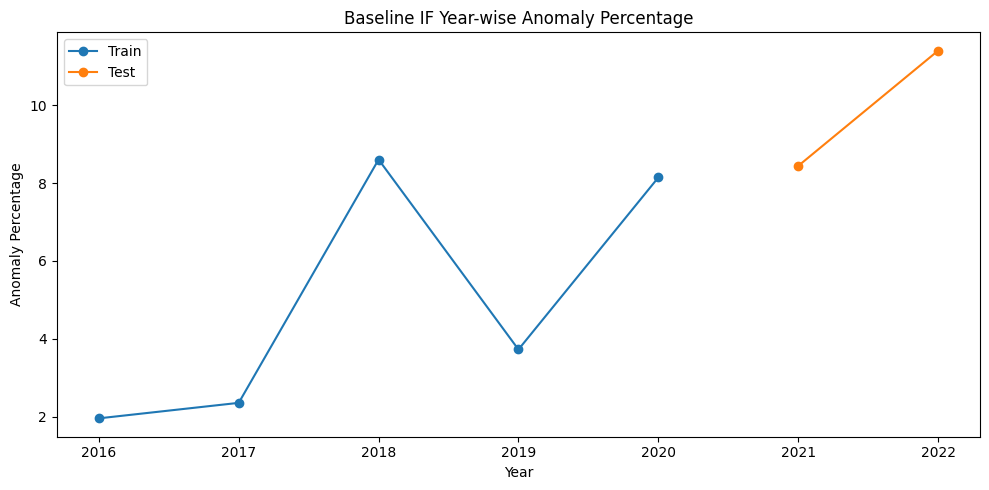

month-wise anomaly percentage on test set
    month  anomaly
0       1   13.226
1       2   27.500
2       3    3.548
3       4    3.000
4       5    9.032
5       6    0.667
6       7   10.645
7       8   19.355
8       9    5.667
9      10    0.968
10     11    6.667
11     12   19.677


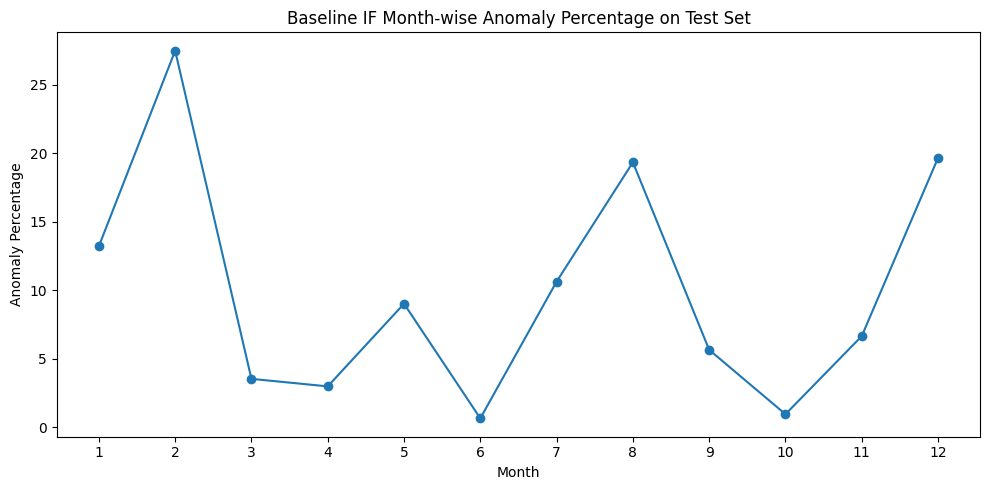

top anomaly records
             city       date    T2M  T2M_deseasonal  abs_dev_T2M  PRECTOTCORR   RH2M  WS2M  anomaly_score  anomaly
4916      Bristol 2022-08-14  23.82        6.537972     6.537972         0.00  51.97  1.56      -0.089351        1
4915      Bristol 2022-08-13  24.52        7.237972     7.237972         0.02  53.27  1.87      -0.087926        1
4914      Bristol 2022-08-12  24.15        6.867972     6.867972         0.00  51.09  2.21      -0.081762        1
4917      Bristol 2022-08-15  21.54        4.257972     4.257972         0.74  60.58  0.92      -0.079707        1
5043      Bristol 2022-12-19  11.61        5.759217     5.759217         5.48  95.91  7.15      -0.075419        1
4890      Bristol 2022-07-19  24.59        6.850553     6.850553         0.11  59.54  3.54      -0.073934        1
9946       London 2022-07-19  25.93        7.456682     7.456682         0.05  55.84  3.83      -0.072038        1
4913      Bristol 2022-08-11  23.21        5.927972     5.92

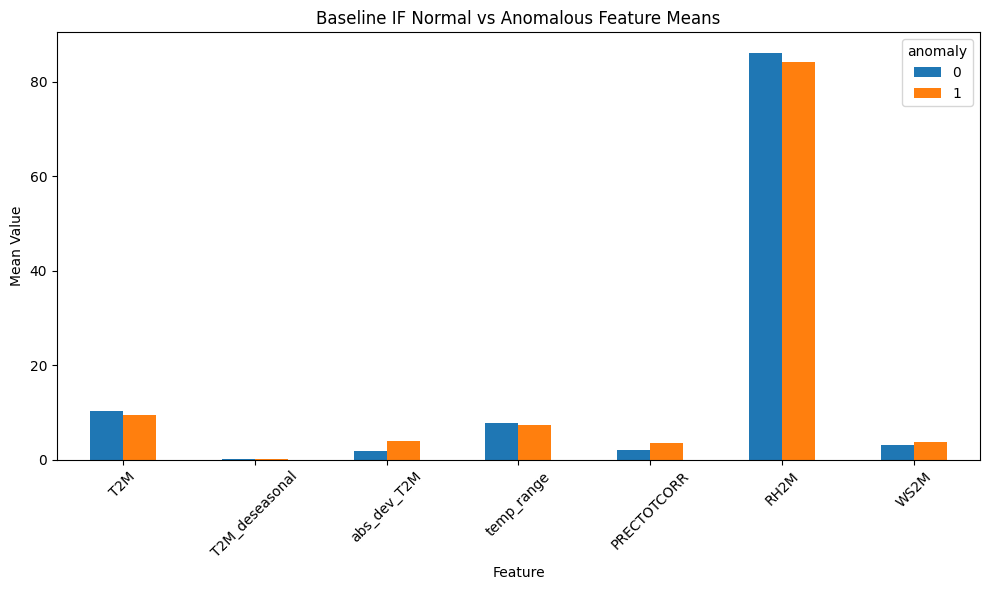

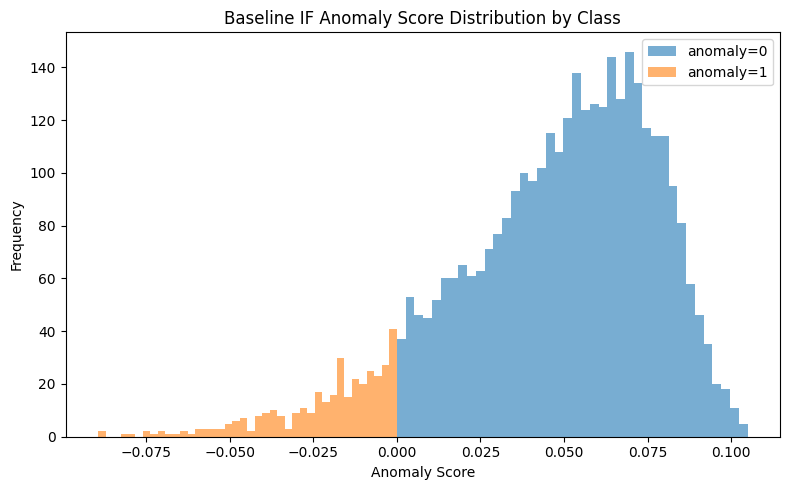

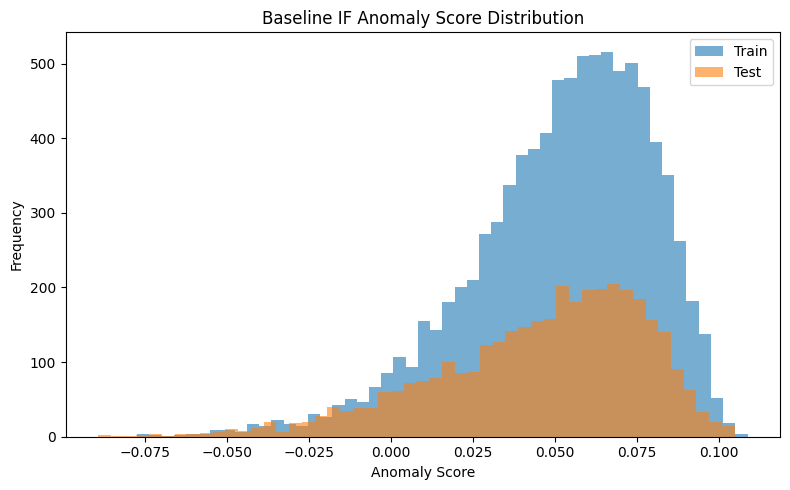

correlation with anomaly
                  T2M  T2M_deseasonal  abs_dev_T2M  temp_range  PRECTOTCORR   RH2M   WS2M  anomaly
T2M             1.000           0.533       -0.152       0.526       -0.034 -0.587 -0.157   -0.045
T2M_deseasonal  0.533           1.000        0.012       0.173        0.062 -0.067  0.127   -0.005
abs_dev_T2M    -0.152           0.012        1.000      -0.091       -0.020  0.023  0.081    0.376
temp_range      0.526           0.173       -0.091       1.000       -0.315 -0.719 -0.357   -0.044
PRECTOTCORR    -0.034           0.062       -0.020      -0.315        1.000  0.314  0.336    0.134
RH2M           -0.587          -0.067        0.023      -0.719        0.314  1.000  0.180   -0.075
WS2M           -0.157           0.127        0.081      -0.357        0.336  0.180  1.000    0.125
anomaly        -0.045          -0.005        0.376      -0.044        0.134 -0.075  0.125    1.000


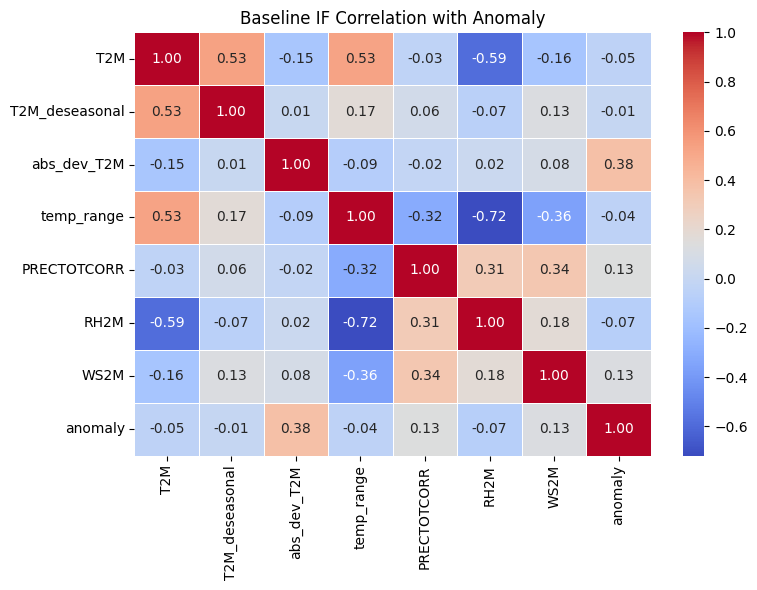

correlation with anomaly strength score
                  T2M  T2M_deseasonal  abs_dev_T2M  temp_range  PRECTOTCORR   RH2M   WS2M  anomaly_score
T2M             1.000           0.533       -0.152       0.526       -0.034 -0.587 -0.157          0.182
T2M_deseasonal  0.533           1.000        0.012       0.173        0.062 -0.067  0.127         -0.023
abs_dev_T2M    -0.152           0.012        1.000      -0.091       -0.020  0.023  0.081         -0.537
temp_range      0.526           0.173       -0.091       1.000       -0.315 -0.719 -0.357          0.104
PRECTOTCORR    -0.034           0.062       -0.020      -0.315        1.000  0.314  0.336         -0.206
RH2M           -0.587          -0.067        0.023      -0.719        0.314  1.000  0.180         -0.010
WS2M           -0.157           0.127        0.081      -0.357        0.336  0.180  1.000         -0.157
anomaly_score   0.182          -0.023       -0.537       0.104       -0.206 -0.010 -0.157          1.000


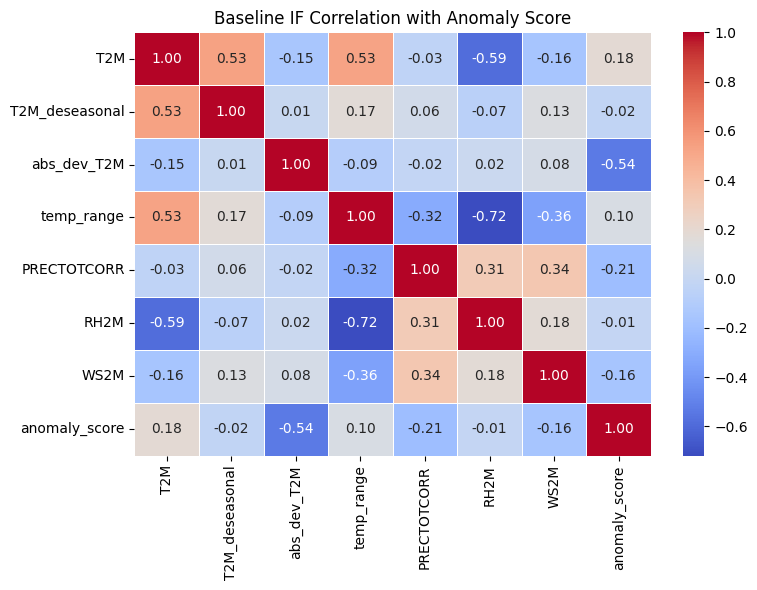

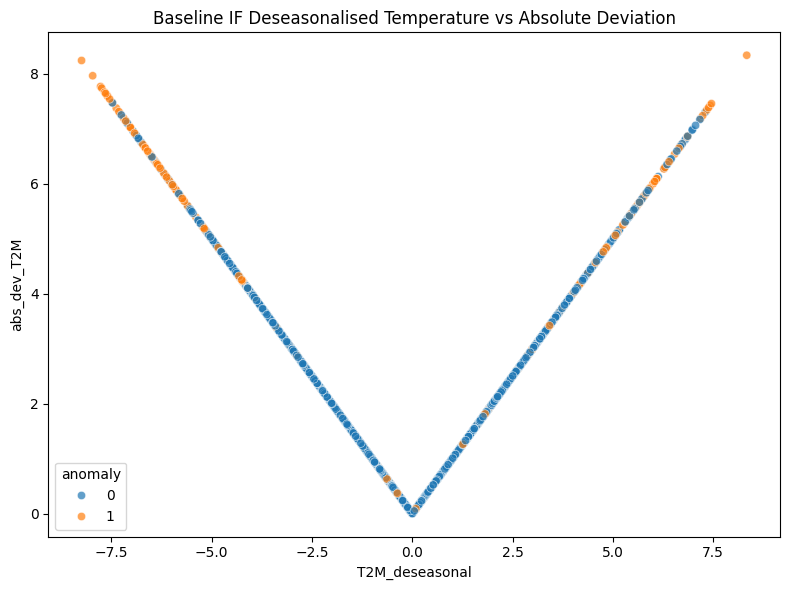

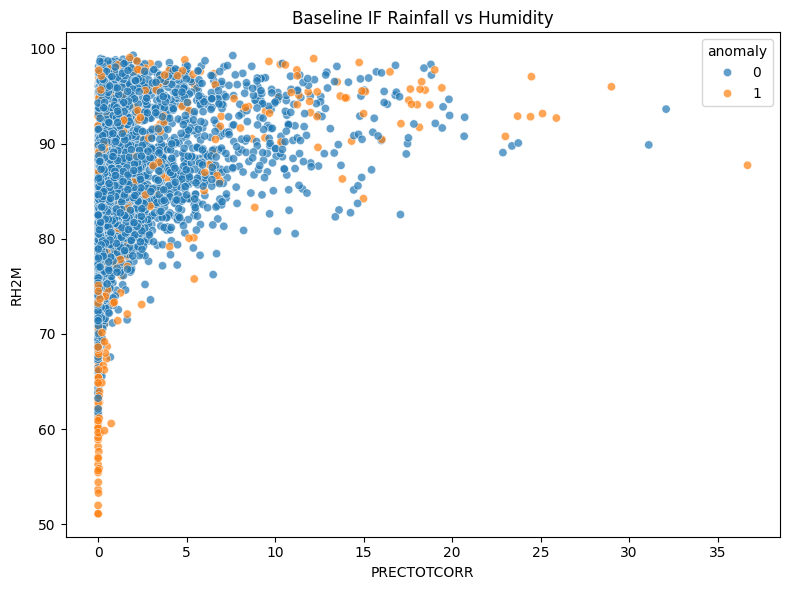

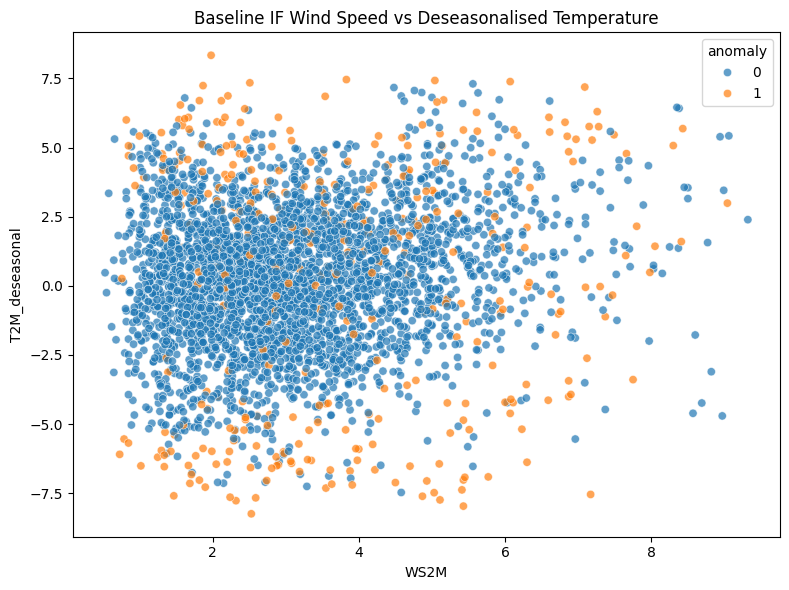

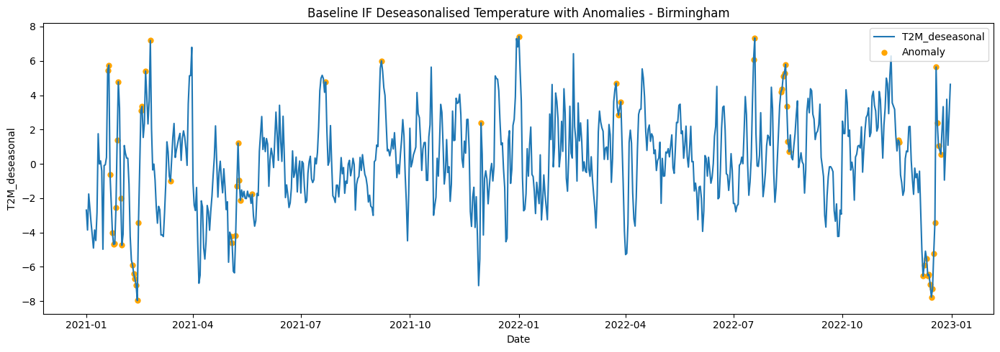

...

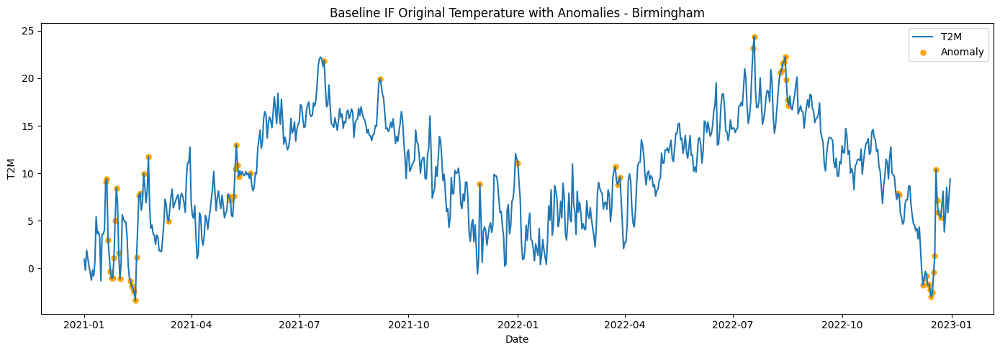

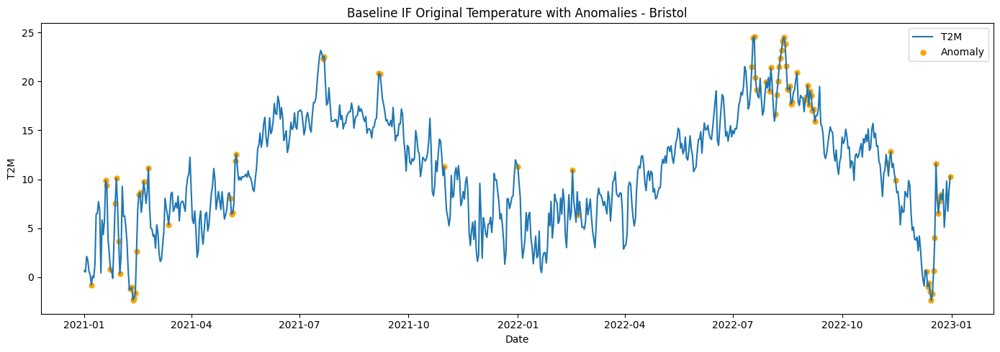

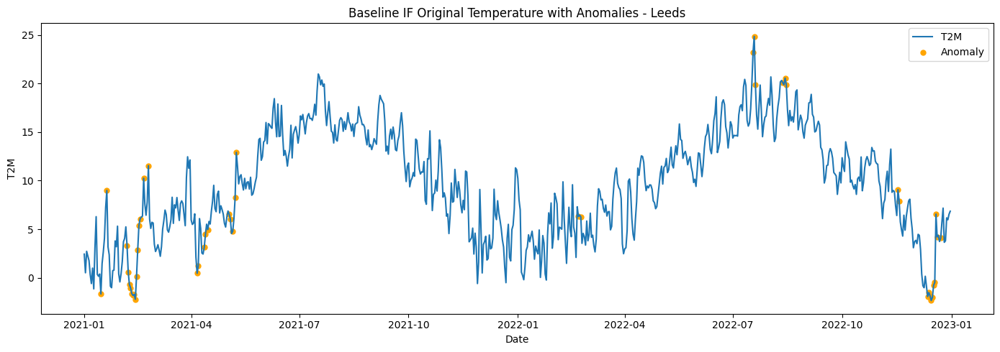

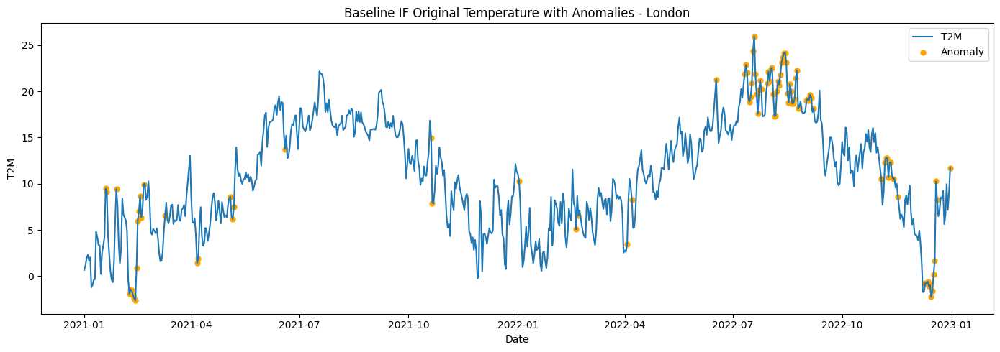

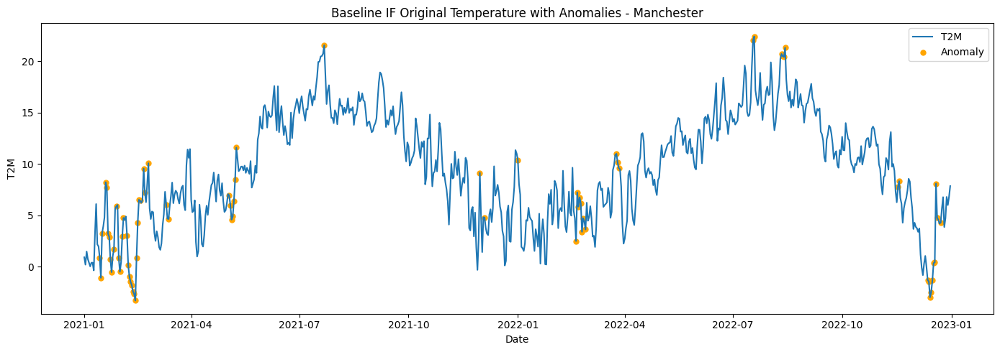

model
Tuned IF
train shape
(8990, 50)
test shape
(3650, 50)
train anomaly percentage by city
city
London        5.895
Manchester    3.003
Bristol       2.558
Birmingham    2.113
Leeds         1.446
Name: anomaly, dtype: float64
test anomaly percentage by city
city
London        9.863
Bristol       6.712
Manchester    5.342
Birmingham    4.658
Leeds         3.562
Name: anomaly, dtype: float64
city comparison
            Train Anomaly %  Test Anomaly %
city                                       
Birmingham            2.113           4.658
Bristol               2.558           6.712
Leeds                 1.446           3.562
London                5.895           9.863
Manchester            3.003           5.342


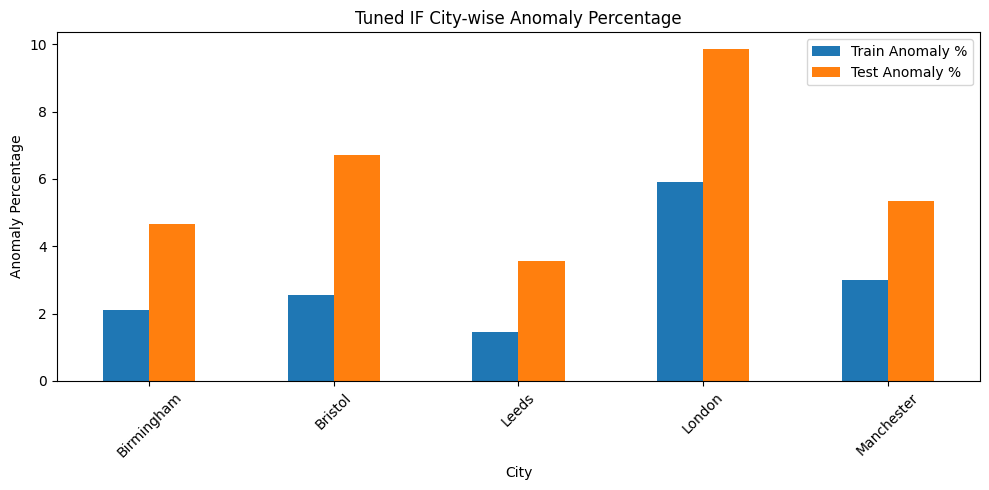

year-wise anomaly percentage
   year  anomaly dataset
0  2016    0.772   Train
1  2017    1.260   Train
2  2018    6.575   Train
3  2019    1.808   Train
4  2020    4.426   Train
0  2021    4.384    Test
1  2022    7.671    Test


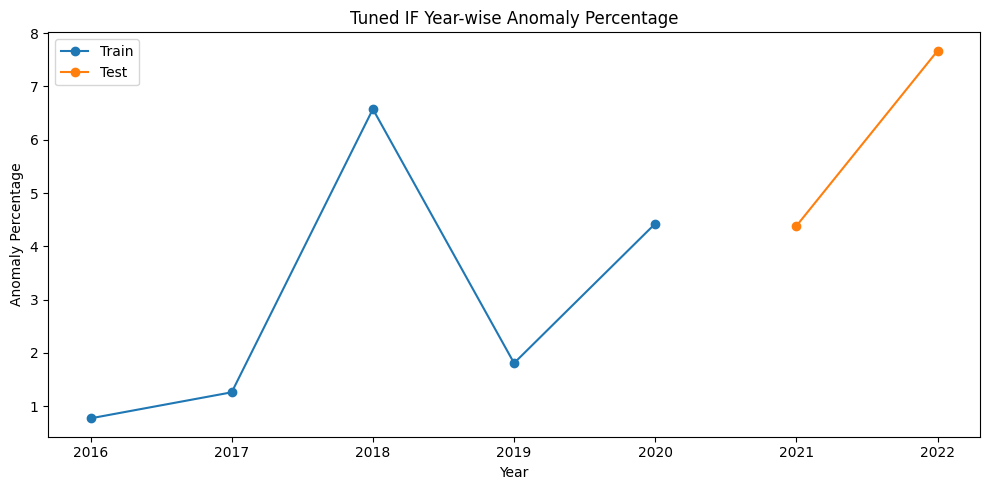

month-wise anomaly percentage on test set
    month  anomaly
0       1    7.419
1       2   15.714
2       3    0.323
3       4    1.667
4       5    3.548
5       6    0.667
6       7    8.387
7       8   15.161
8       9    2.333
9      10    0.000
10     11    2.333
11     12   15.161


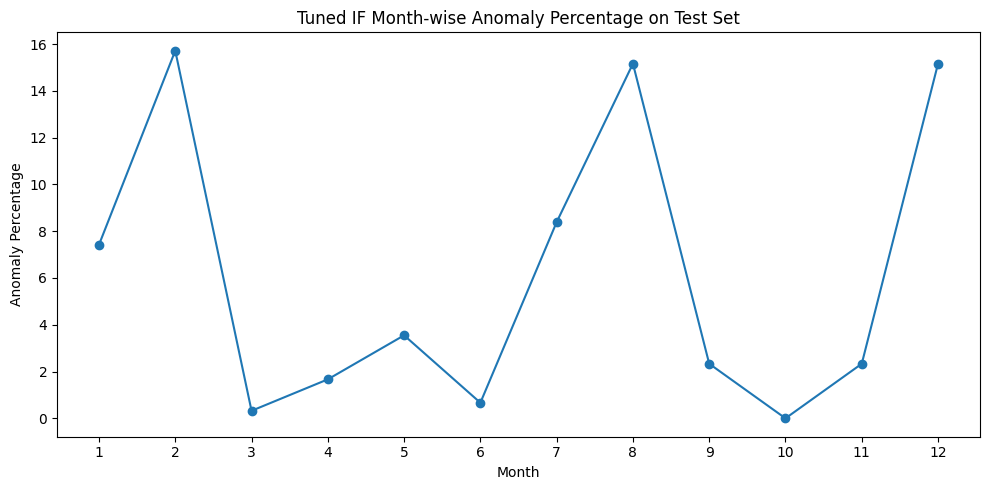

top anomaly records
             city       date    T2M  T2M_deseasonal  abs_dev_T2M  PRECTOTCORR   RH2M  WS2M  anomaly_score  anomaly
4916      Bristol 2022-08-14  23.82        6.537972     6.537972         0.00  51.97  1.56      -0.083285        1
4915      Bristol 2022-08-13  24.52        7.237972     7.237972         0.02  53.27  1.87      -0.081753        1
4914      Bristol 2022-08-12  24.15        6.867972     6.867972         0.00  51.09  2.21      -0.074478        1
4917      Bristol 2022-08-15  21.54        4.257972     4.257972         0.74  60.58  0.92      -0.071948        1
9972       London 2022-08-14  24.15        6.092581     6.092581         0.00  55.62  2.17      -0.071704        1
9946       London 2022-07-19  25.93        7.456682     7.456682         0.05  55.84  3.83      -0.069637        1
9973       London 2022-08-15  23.12        5.062581     5.062581         0.36  59.83  2.19      -0.067140        1
9971       London 2022-08-13  24.15        6.092581     6.09

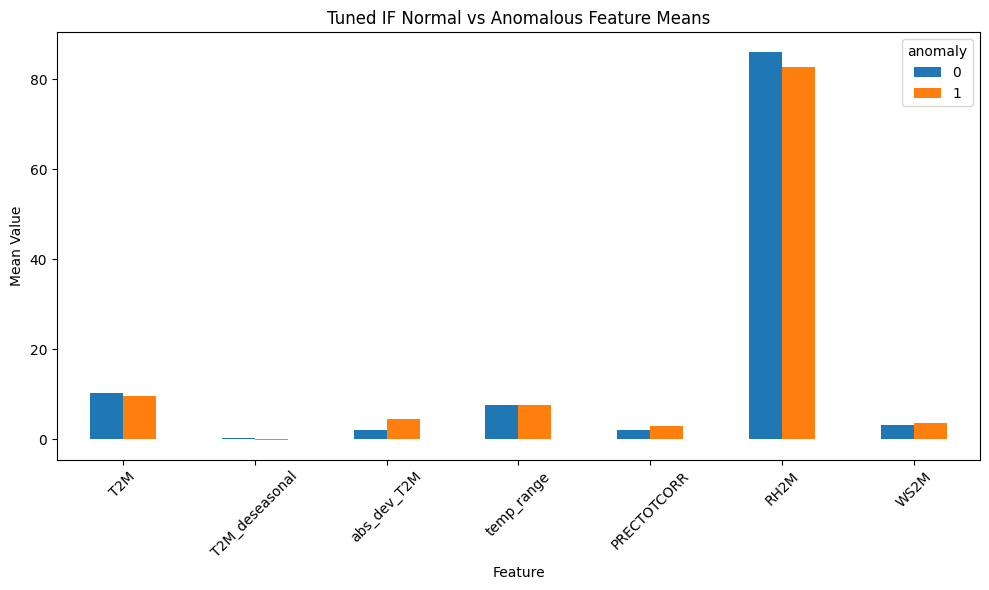

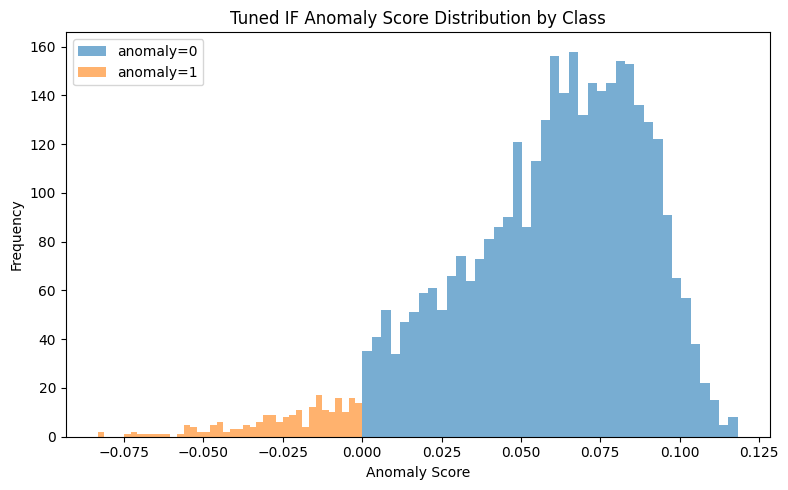

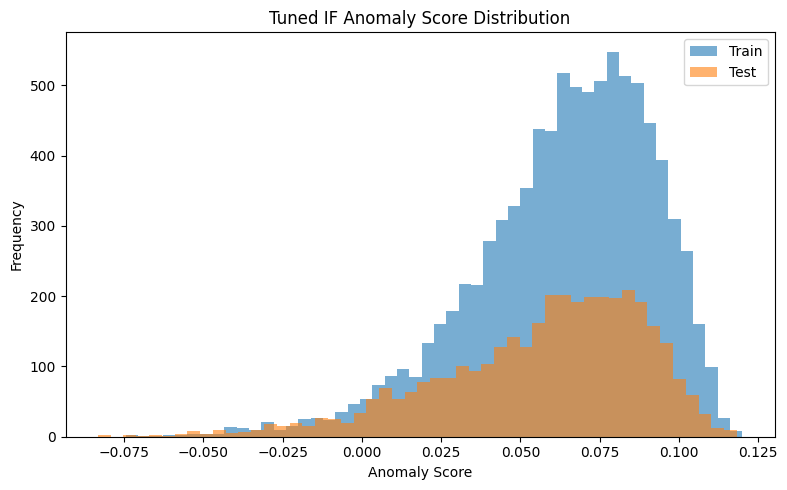

correlation with anomaly
                  T2M  T2M_deseasonal  abs_dev_T2M  temp_range  PRECTOTCORR   RH2M   WS2M  anomaly
T2M             1.000           0.533       -0.152       0.526       -0.034 -0.587 -0.157   -0.026
T2M_deseasonal  0.533           1.000        0.012       0.173        0.062 -0.067  0.127   -0.042
abs_dev_T2M    -0.152           0.012        1.000      -0.091       -0.020  0.023  0.081    0.374
temp_range      0.526           0.173       -0.091       1.000       -0.315 -0.719 -0.357   -0.001
PRECTOTCORR    -0.034           0.062       -0.020      -0.315        1.000  0.314  0.336    0.062
RH2M           -0.587          -0.067        0.023      -0.719        0.314  1.000  0.180   -0.100
WS2M           -0.157           0.127        0.081      -0.357        0.336  0.180  1.000    0.075
anomaly        -0.026          -0.042        0.374      -0.001        0.062 -0.100  0.075    1.000


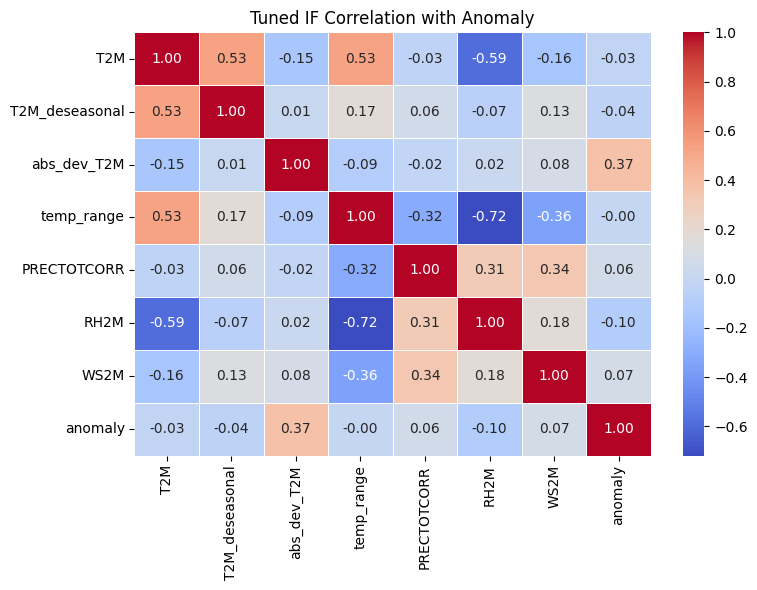

correlation with anomaly strength score
                  T2M  T2M_deseasonal  abs_dev_T2M  temp_range  PRECTOTCORR   RH2M   WS2M  anomaly_score
T2M             1.000           0.533       -0.152       0.526       -0.034 -0.587 -0.157          0.163
T2M_deseasonal  0.533           1.000        0.012       0.173        0.062 -0.067  0.127         -0.006
abs_dev_T2M    -0.152           0.012        1.000      -0.091       -0.020  0.023  0.081         -0.548
temp_range      0.526           0.173       -0.091       1.000       -0.315 -0.719 -0.357          0.080
PRECTOTCORR    -0.034           0.062       -0.020      -0.315        1.000  0.314  0.336         -0.182
RH2M           -0.587          -0.067        0.023      -0.719        0.314  1.000  0.180          0.027
WS2M           -0.157           0.127        0.081      -0.357        0.336  0.180  1.000         -0.129
anomaly_score   0.163          -0.006       -0.548       0.080       -0.182  0.027 -0.129          1.000


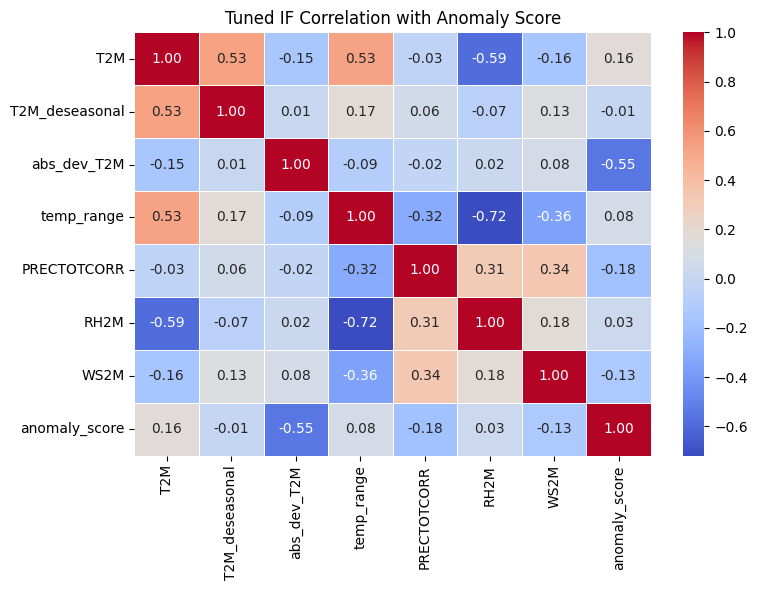

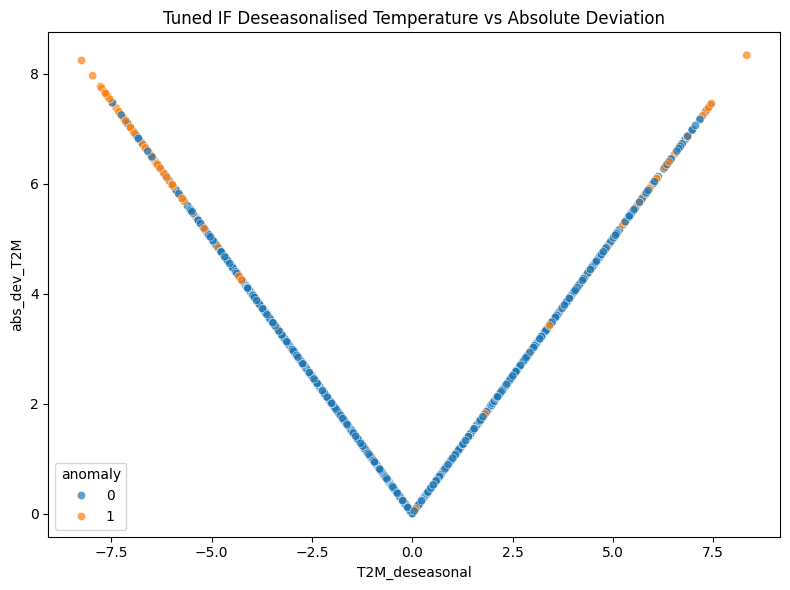

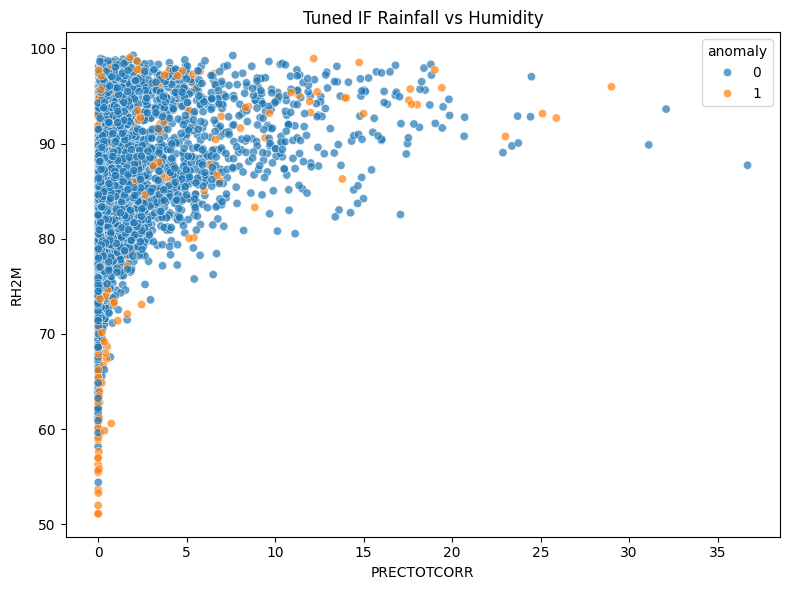

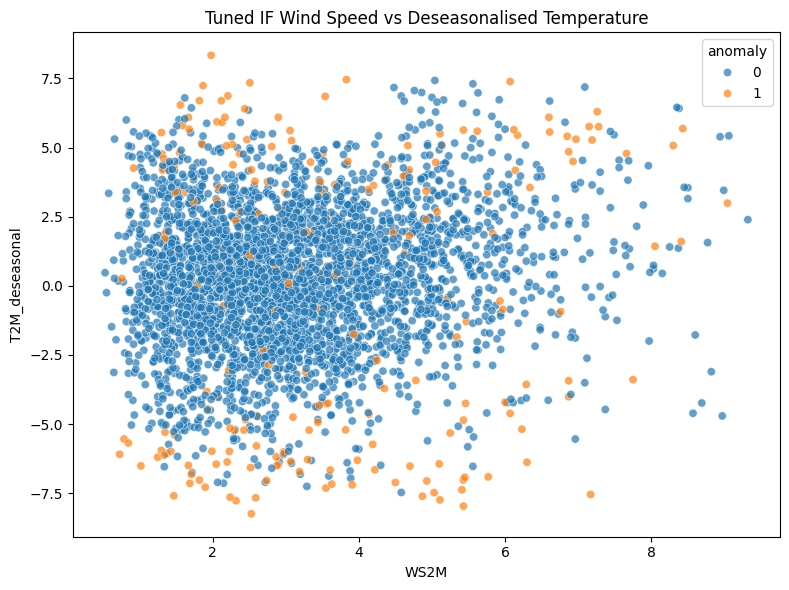

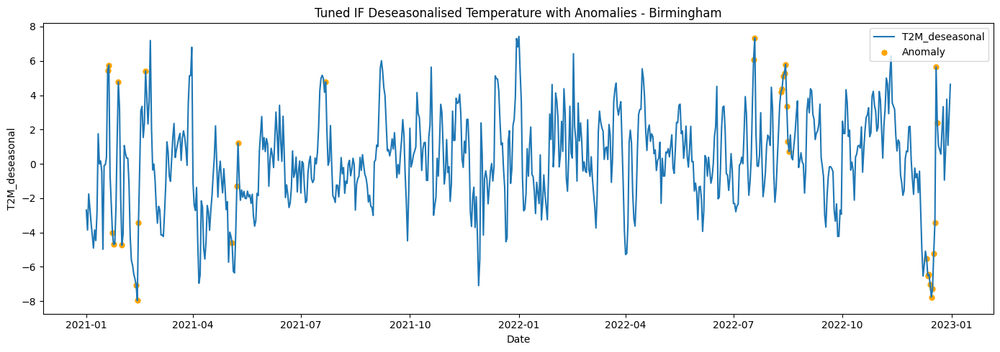

...

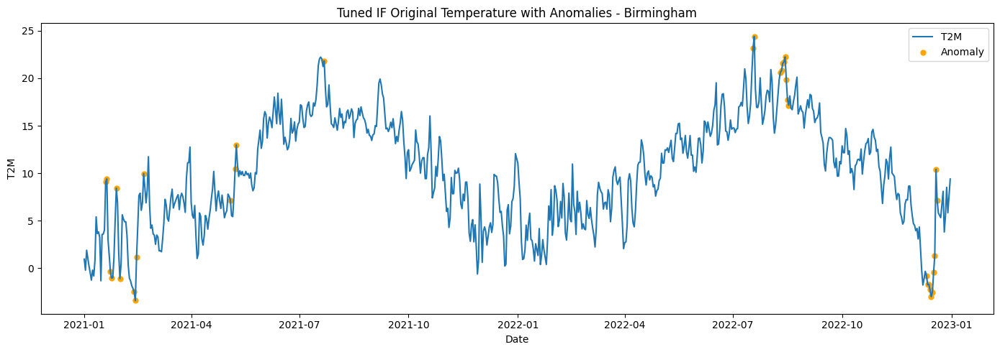

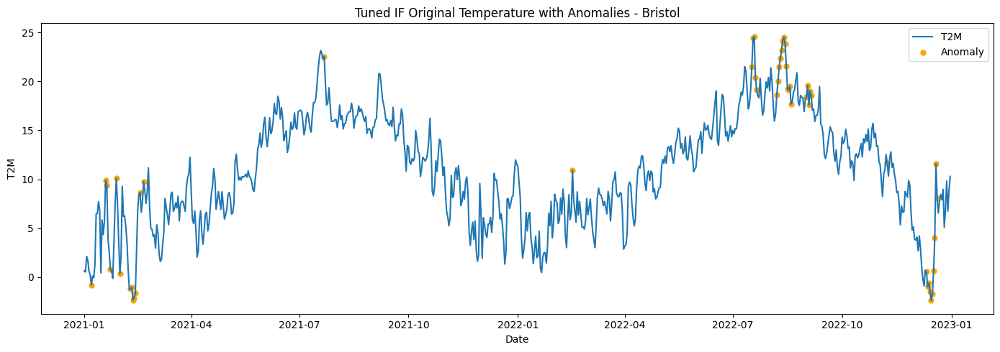

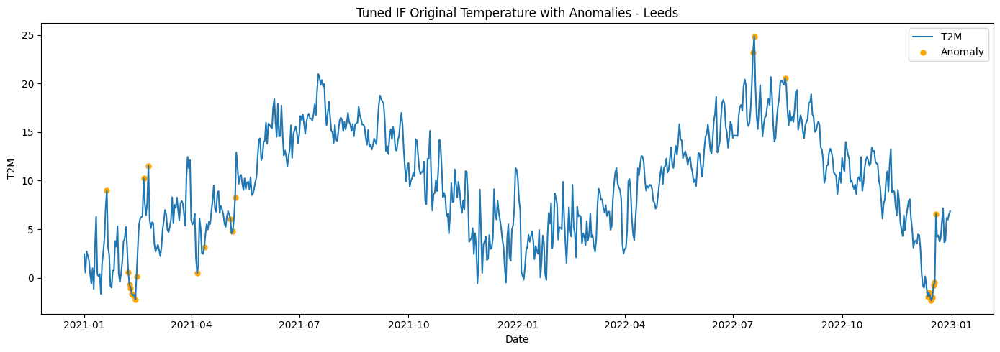

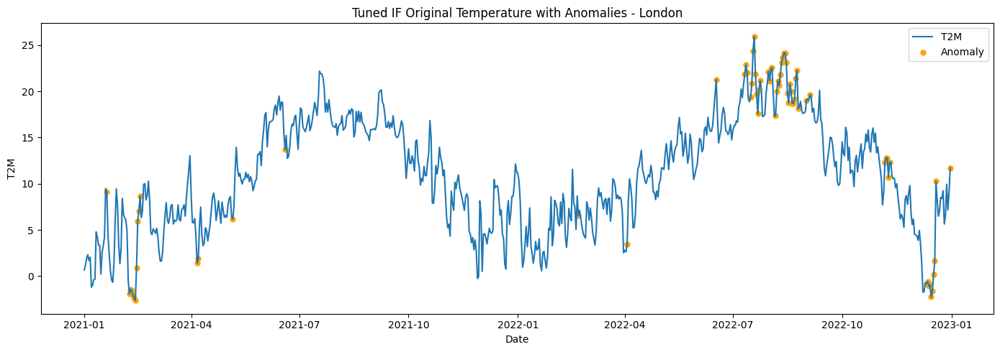

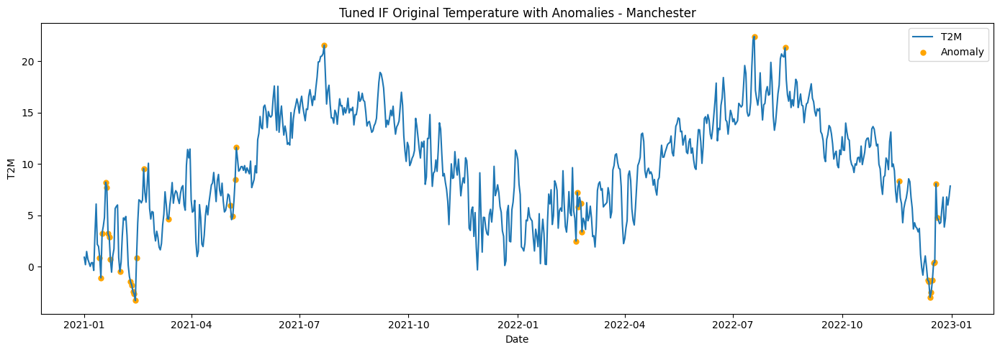

model
Baseline LSTM
train shape
(8961, 50)
test shape
(3621, 50)
train anomaly percentage by city
city
London        9.232
Manchester    5.784
Leeds         4.616
Bristol       2.836
Birmingham    2.487
Name: anomaly, dtype: float64
test anomaly percentage by city
city
London        40.274
Bristol       32.192
Manchester    29.041
Birmingham    24.822
Leeds         23.151
Name: anomaly, dtype: float64
city comparison
            Train Anomaly %  Test Anomaly %
city                                       
Birmingham            2.487          24.822
Bristol               2.836          32.192
Leeds                 4.616          23.151
London                9.232          40.274
Manchester            5.784          29.041


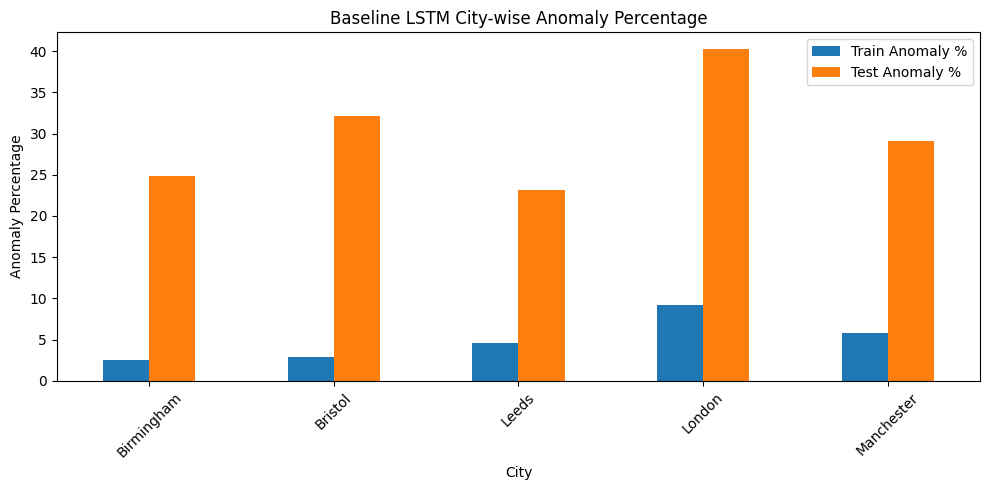

year-wise anomaly percentage
   year  anomaly dataset
0  2016    3.019   Train
1  2017    0.767   Train
2  2018    8.274   Train
3  2019    2.685   Train
4  2020   10.055   Train
0  2021   41.203    Test
1  2022   18.849    Test


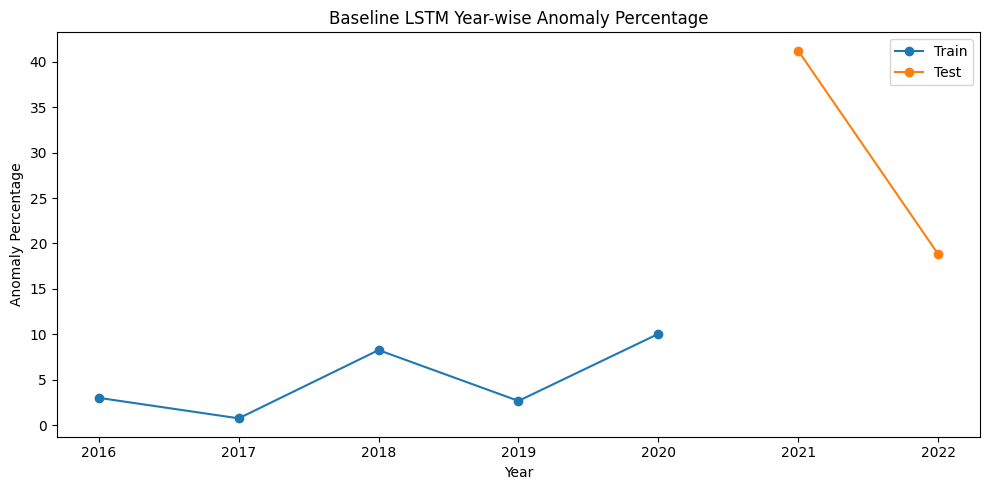

month-wise anomaly percentage on test set
    month  anomaly
0       1   40.214
1       2   56.429
2       3   55.806
3       4   61.333
4       5   40.323
5       6   14.000
6       7    6.129
7       8   17.742
8       9   14.333
9      10    6.129
10     11   22.667
11     12   27.419


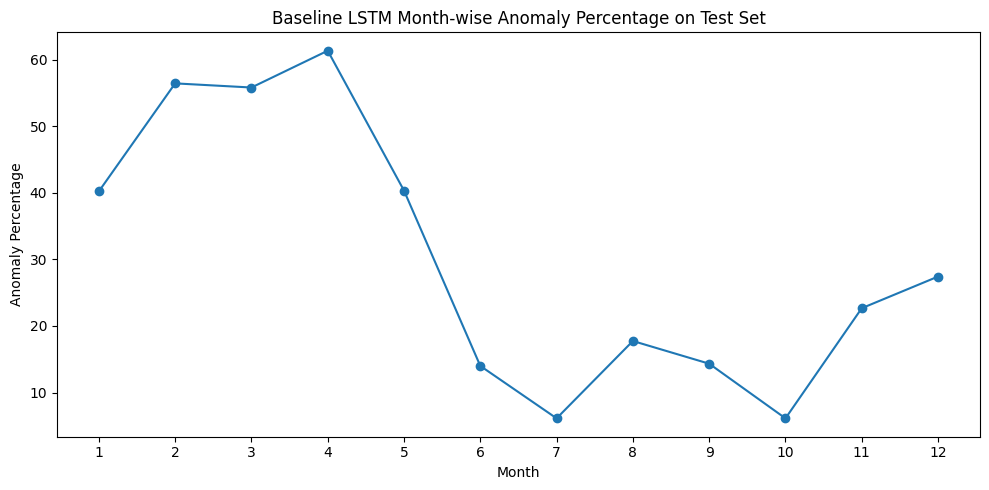

top anomaly records
            city       date    T2M  T2M_deseasonal  abs_dev_T2M  PRECTOTCORR   RH2M  WS2M  reconstruction_loss  anomaly
2935  Manchester 2021-02-14   0.85       -3.390707     3.390707         8.04  91.63  7.75             1.773097        1
2936  Manchester 2021-02-15   4.25        0.009293     0.009293         1.11  98.26  3.41             1.736410        1
2937  Manchester 2021-02-16   6.50        2.259293     2.259293         3.29  95.64  4.07             1.734298        1
2938  Manchester 2021-02-17   6.42        2.179293     2.179293         4.74  93.90  4.81             1.720722        1
2934  Manchester 2021-02-13  -3.30       -7.540707     7.540707         0.15  84.82  7.17             1.685127        1
2939  Manchester 2021-02-18   6.20        1.959293     1.959293         4.98  90.95  6.24             1.647731        1
2933  Manchester 2021-02-12  -2.68       -6.920707     6.920707         0.05  88.09  5.45             1.587684        1
2932  Manchester 202

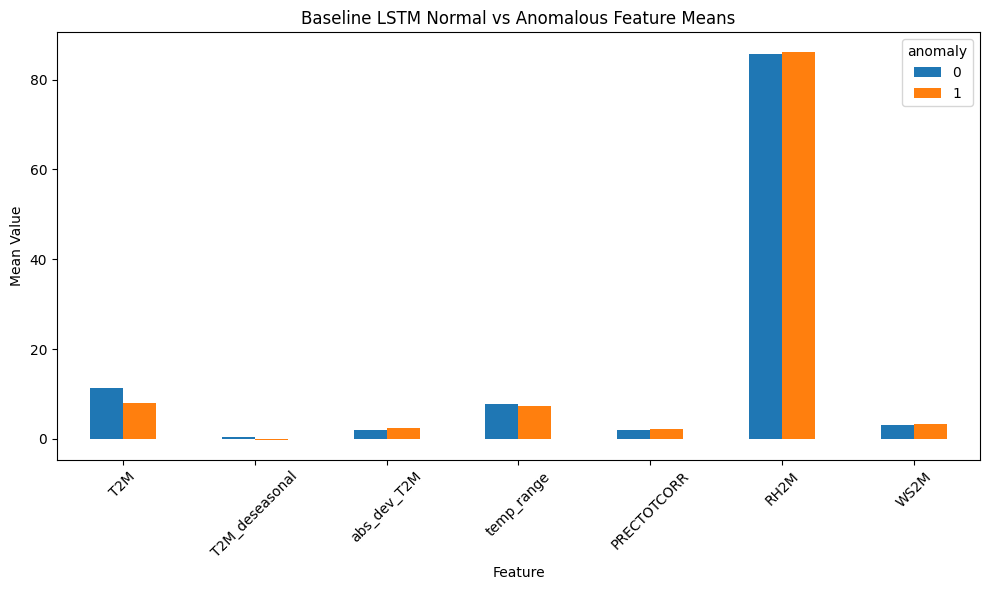

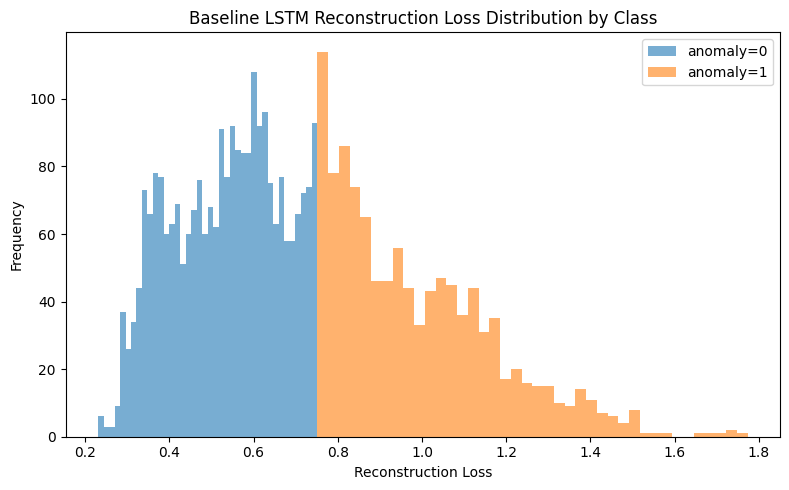

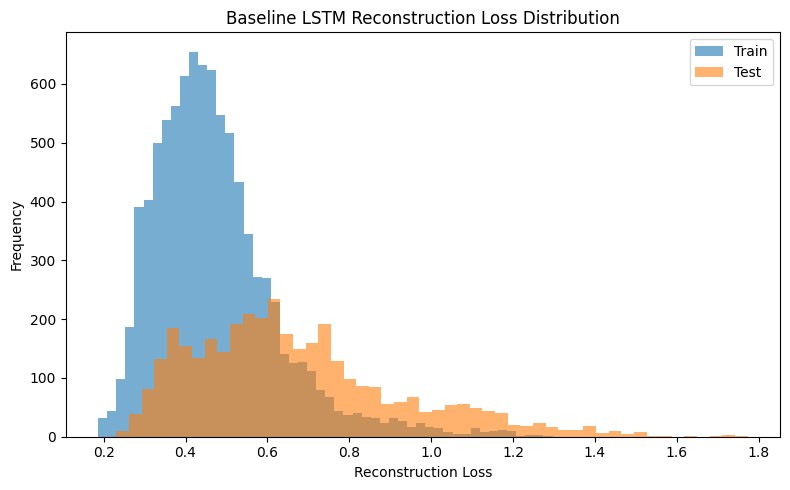

correlation with anomaly
                  T2M  T2M_deseasonal  abs_dev_T2M  temp_range  PRECTOTCORR   RH2M   WS2M  anomaly
T2M             1.000           0.530       -0.149       0.523       -0.034 -0.582 -0.163   -0.278
T2M_deseasonal  0.530           1.000        0.015       0.170        0.055 -0.062  0.122   -0.122
abs_dev_T2M    -0.149           0.015        1.000      -0.087       -0.023  0.018  0.081    0.162
temp_range      0.523           0.170       -0.087       1.000       -0.319 -0.718 -0.361   -0.073
PRECTOTCORR    -0.034           0.055       -0.023      -0.319        1.000  0.314  0.336    0.019
RH2M           -0.582          -0.062        0.018      -0.718        0.314  1.000  0.183    0.030
WS2M           -0.163           0.122        0.081      -0.361        0.336  0.183  1.000    0.072
anomaly        -0.278          -0.122        0.162      -0.073        0.019  0.030  0.072    1.000


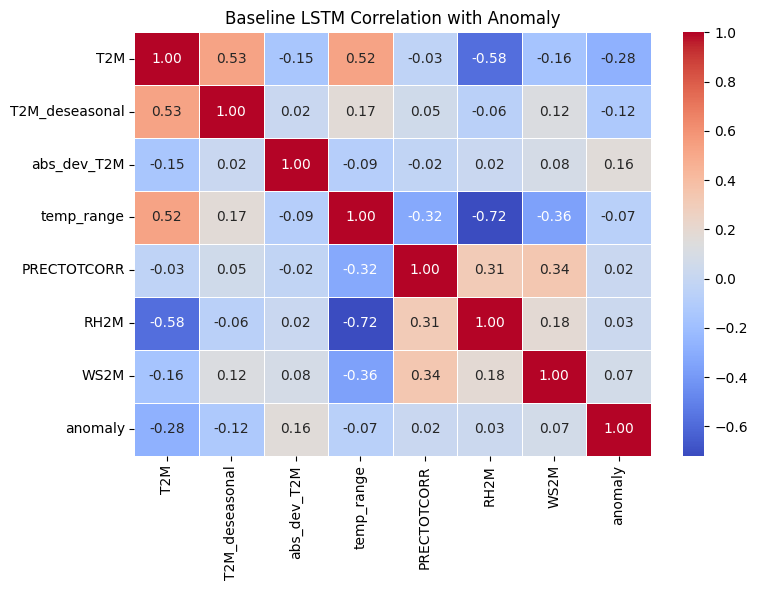

correlation with anomaly strength score
                       T2M  T2M_deseasonal  abs_dev_T2M  temp_range  PRECTOTCORR   RH2M   WS2M  reconstruction_loss
T2M                  1.000           0.530       -0.149       0.523       -0.034 -0.582 -0.163               -0.397
T2M_deseasonal       0.530           1.000        0.015       0.170        0.055 -0.062  0.122               -0.100
abs_dev_T2M         -0.149           0.015        1.000      -0.087       -0.023  0.018  0.081                0.169
temp_range           0.523           0.170       -0.087       1.000       -0.319 -0.718 -0.361               -0.157
PRECTOTCORR         -0.034           0.055       -0.023      -0.319        1.000  0.314  0.336                0.040
RH2M                -0.582          -0.062        0.018      -0.718        0.314  1.000  0.183                0.126
WS2M                -0.163           0.122        0.081      -0.361        0.336  0.183  1.000                0.148
reconstruction_loss -0.397      

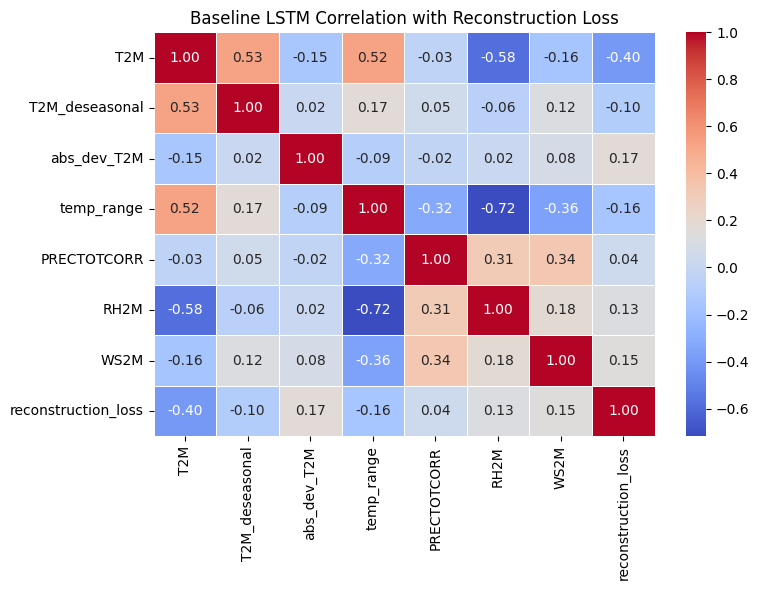

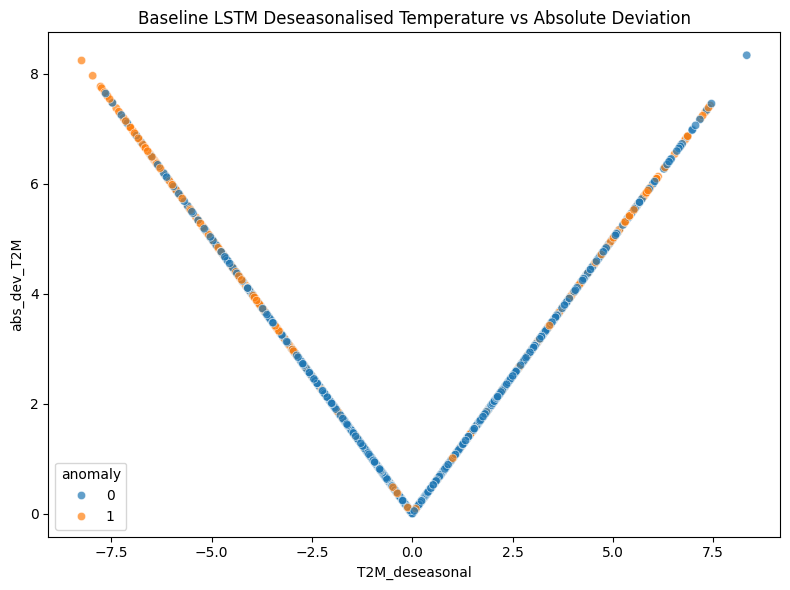

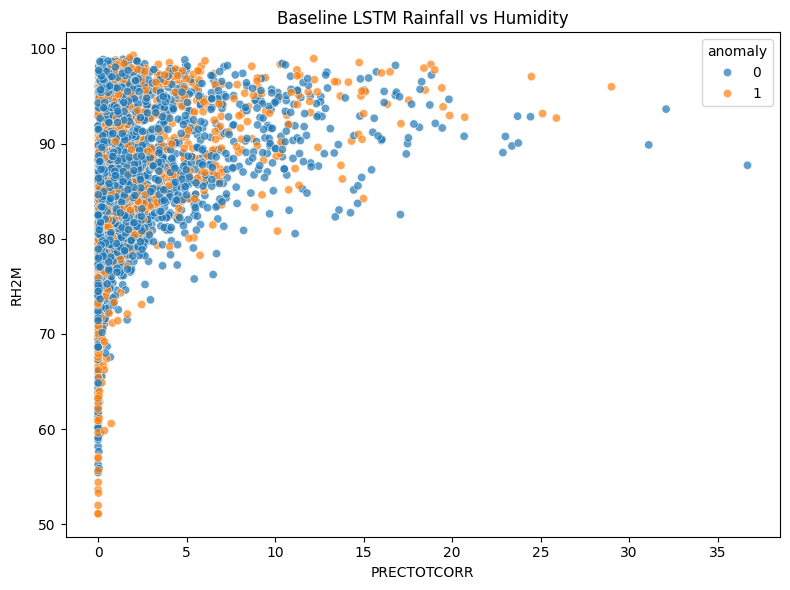

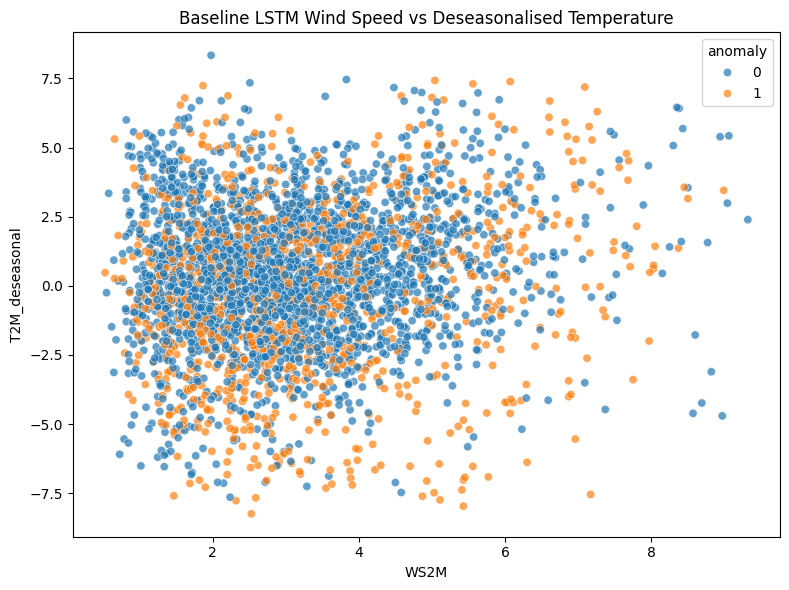

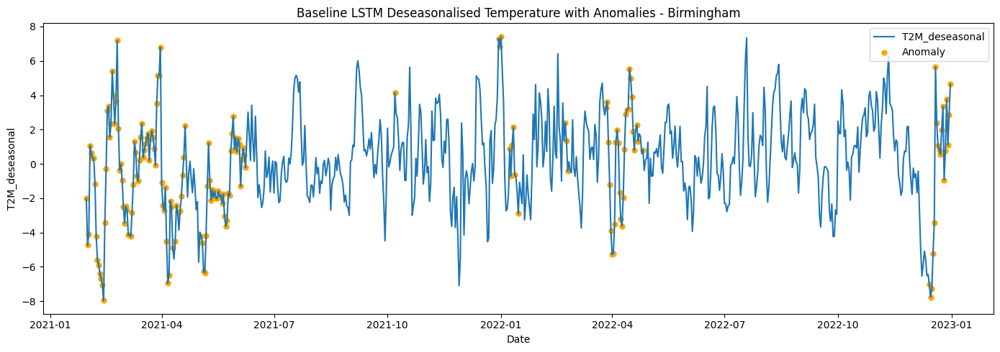

...

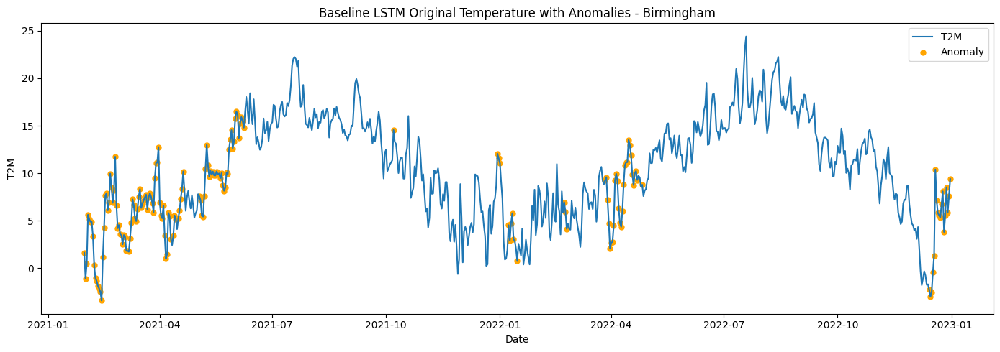

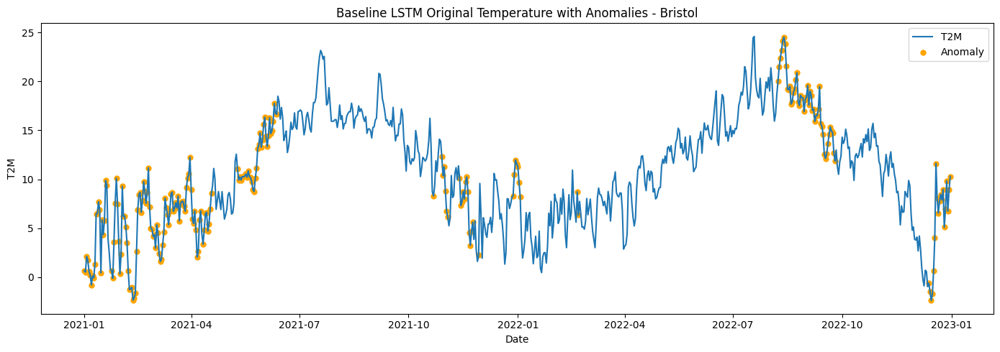

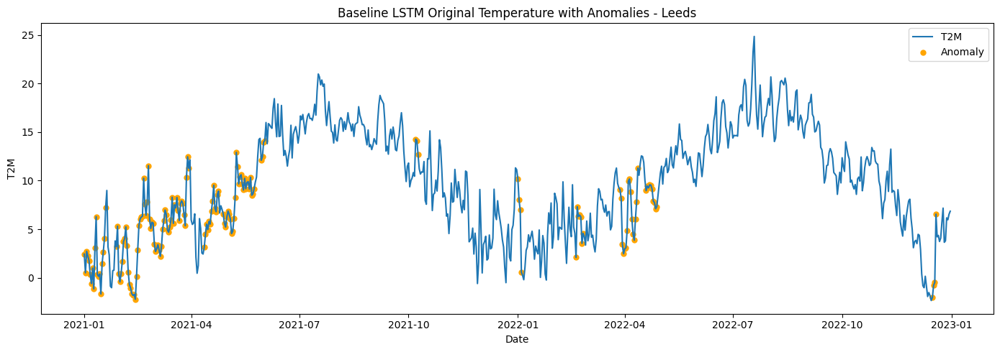

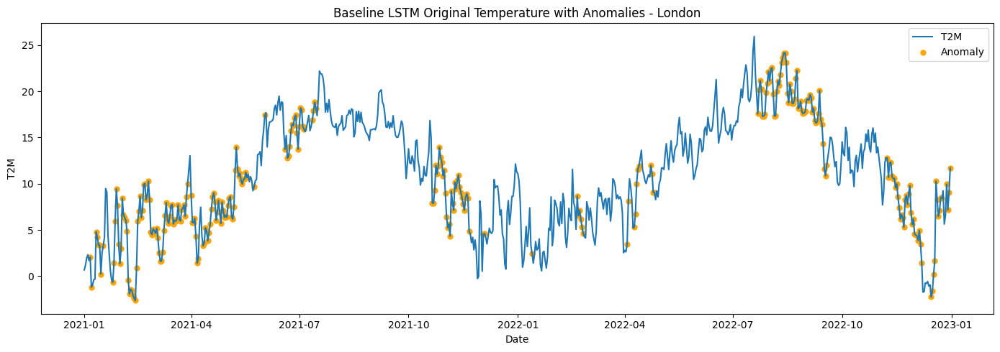

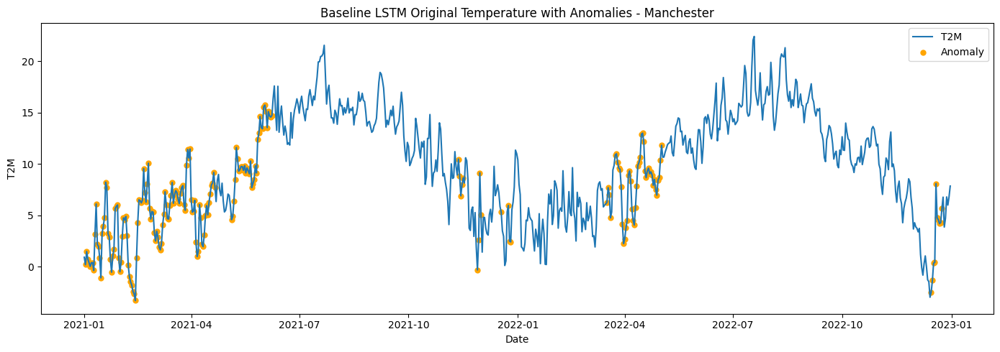

model
Tuned LSTM
train shape
(8961, 50)
test shape
(3621, 50)
train anomaly percentage by city
city
Manchester    14.182
London         4.616
Leeds          2.725
Bristol        2.113
Birmingham     1.300
Name: anomaly, dtype: float64
test anomaly percentage by city
city
London        81.781
Bristol       80.274
Birmingham    67.760
Leeds         67.397
Manchester    67.260
Name: anomaly, dtype: float64
city comparison
            Train Anomaly %  Test Anomaly %
city                                       
Birmingham            1.300          67.760
Bristol               2.113          80.274
Leeds                 2.725          67.397
London                4.616          81.781
Manchester           14.182          67.260


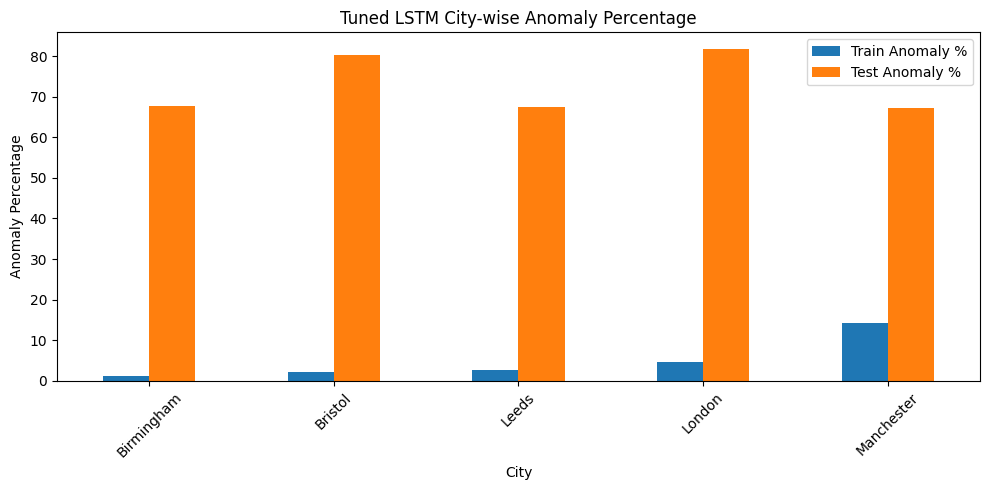

year-wise anomaly percentage
   year  anomaly dataset
0  2016    2.234   Train
1  2017    5.260   Train
2  2018    5.534   Train
3  2019    6.740   Train
4  2020    4.973   Train
0  2021   75.000    Test
1  2022   70.904    Test


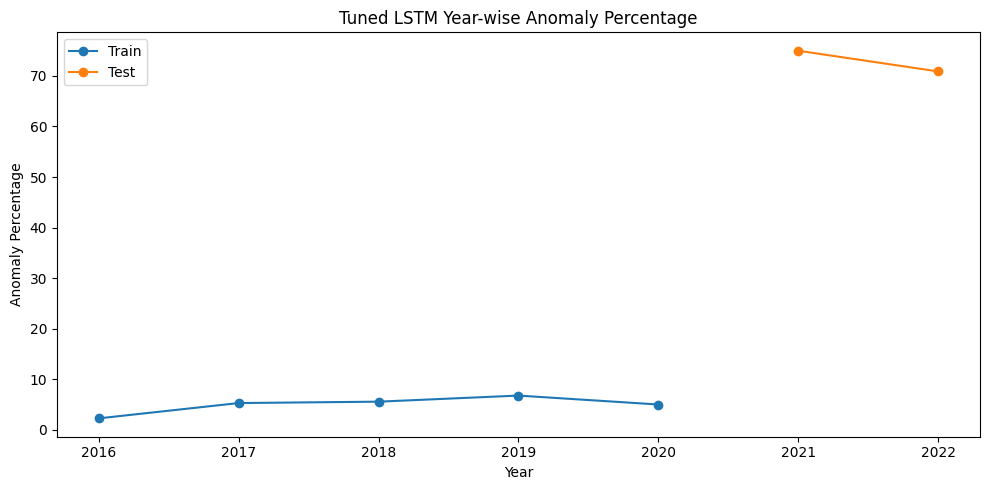

month-wise anomaly percentage on test set
    month  anomaly
0       1  100.000
1       2   92.143
2       3   84.839
3       4  100.000
4       5   80.323
5       6   60.667
6       7   26.129
7       8   40.645
8       9   28.667
9      10   73.226
10     11   93.667
11     12   99.032


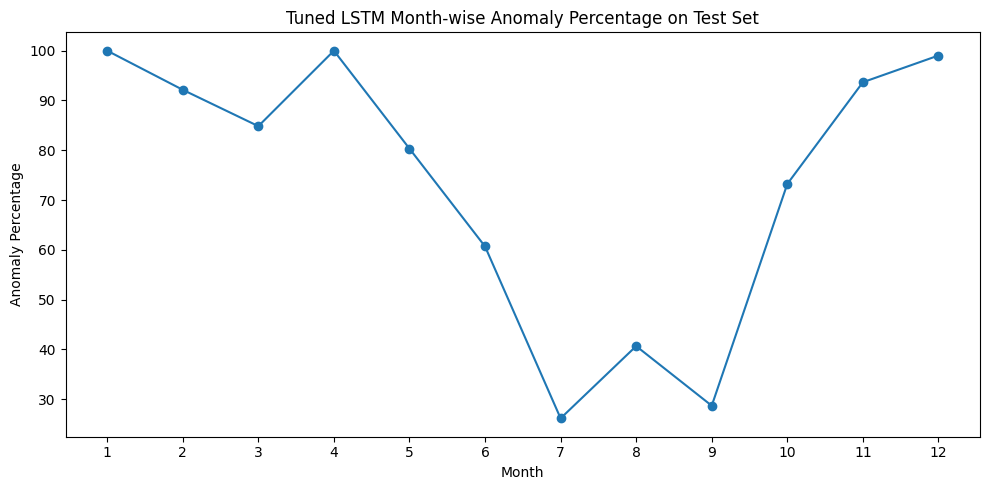

top anomaly records
            city       date    T2M  T2M_deseasonal  abs_dev_T2M  PRECTOTCORR   RH2M  WS2M  reconstruction_loss  anomaly
2212      London 2021-02-21  10.01        4.901919     4.901919         0.43  91.36  2.52             1.843571        1
2208      London 2021-02-17   8.66        3.551919     3.551919         2.22  93.19  6.34             1.777156        1
2214      London 2021-02-23   8.70        3.591919     3.591919         0.05  86.81  5.77             1.765277        1
2213      London 2021-02-22   8.25        3.141919     3.141919         0.46  95.48  2.05             1.738008        1
2209      London 2021-02-18   6.33        1.221919     1.221919         1.43  91.25  5.29             1.712462        1
3022  Manchester 2021-05-12   9.43       -1.732719     1.732719         2.60  83.69  1.84             1.709646        1
2211      London 2021-02-20   9.93        4.821919     4.821919         0.10  87.65  5.82             1.705550        1
3021  Manchester 202

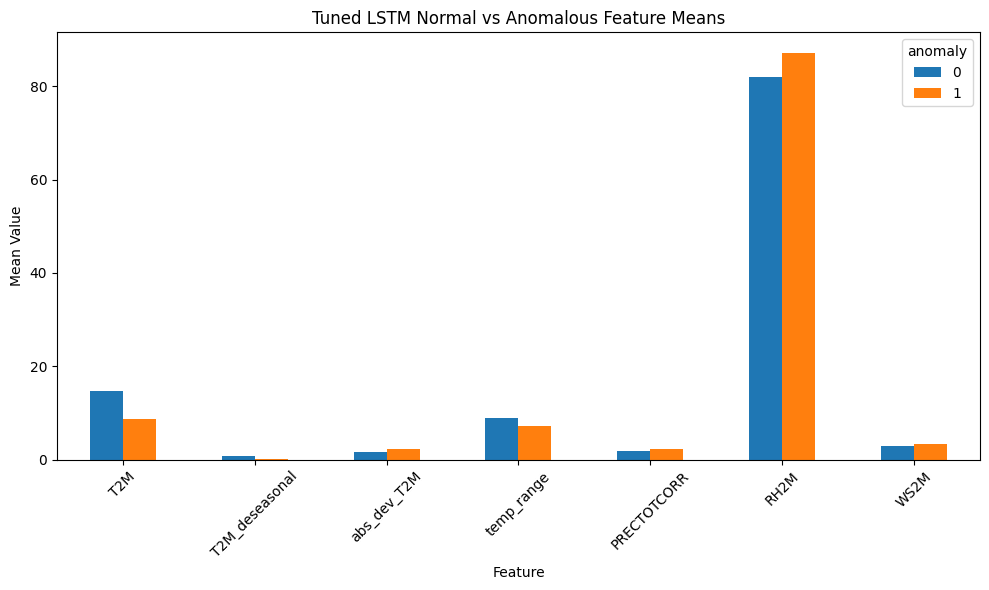

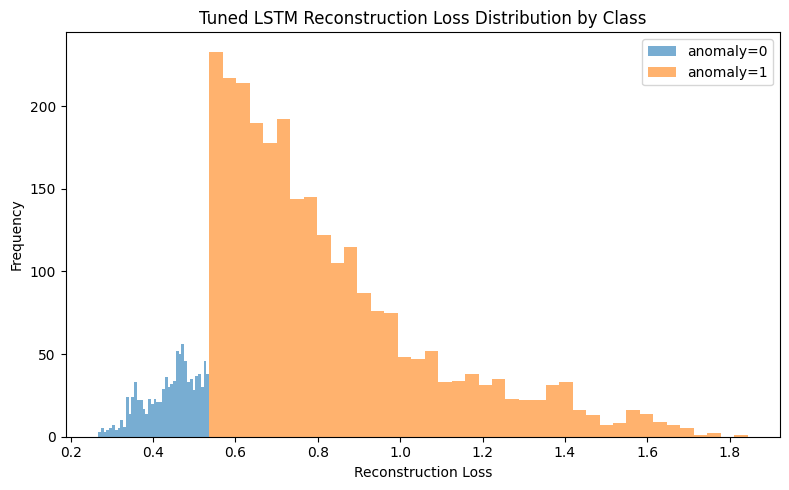

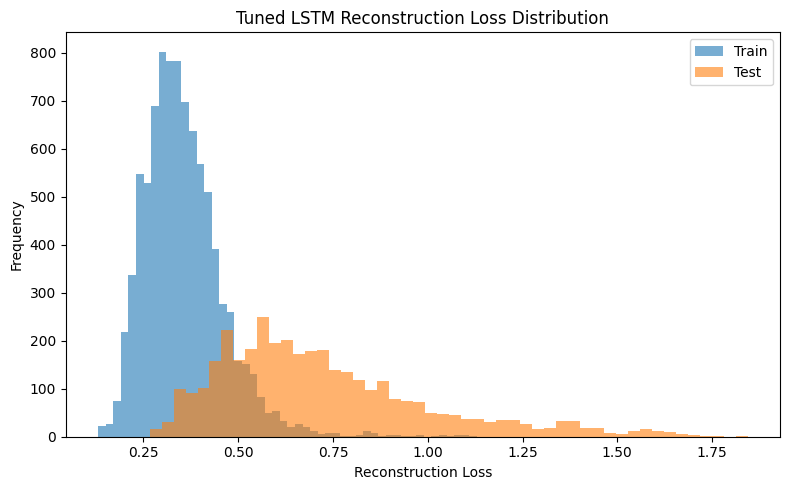

correlation with anomaly
                  T2M  T2M_deseasonal  abs_dev_T2M  temp_range  PRECTOTCORR   RH2M   WS2M  anomaly
T2M             1.000           0.530       -0.149       0.523       -0.034 -0.582 -0.163   -0.492
T2M_deseasonal  0.530           1.000        0.015       0.170        0.055 -0.062  0.122   -0.111
abs_dev_T2M    -0.149           0.015        1.000      -0.087       -0.023  0.018  0.081    0.133
temp_range      0.523           0.170       -0.087       1.000       -0.319 -0.718 -0.361   -0.267
PRECTOTCORR    -0.034           0.055       -0.023      -0.319        1.000  0.314  0.336    0.053
RH2M           -0.582          -0.062        0.018      -0.718        0.314  1.000  0.183    0.279
WS2M           -0.163           0.122        0.081      -0.361        0.336  0.183  1.000    0.136
anomaly        -0.492          -0.111        0.133      -0.267        0.053  0.279  0.136    1.000


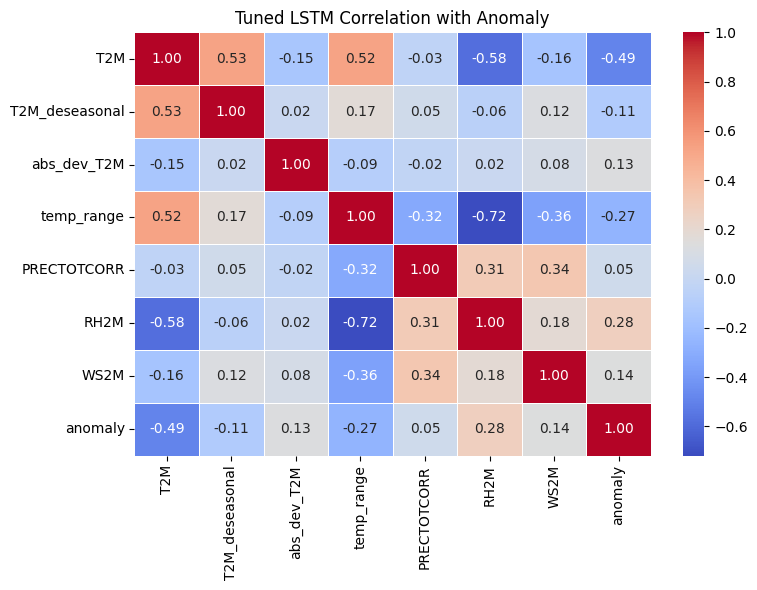

correlation with anomaly strength score
                       T2M  T2M_deseasonal  abs_dev_T2M  temp_range  PRECTOTCORR   RH2M   WS2M  reconstruction_loss
T2M                  1.000           0.530       -0.149       0.523       -0.034 -0.582 -0.163               -0.527
T2M_deseasonal       0.530           1.000        0.015       0.170        0.055 -0.062  0.122               -0.164
abs_dev_T2M         -0.149           0.015        1.000      -0.087       -0.023  0.018  0.081                0.180
temp_range           0.523           0.170       -0.087       1.000       -0.319 -0.718 -0.361               -0.263
PRECTOTCORR         -0.034           0.055       -0.023      -0.319        1.000  0.314  0.336                0.033
RH2M                -0.582          -0.062        0.018      -0.718        0.314  1.000  0.183                0.272
WS2M                -0.163           0.122        0.081      -0.361        0.336  0.183  1.000                0.149
reconstruction_loss -0.527      

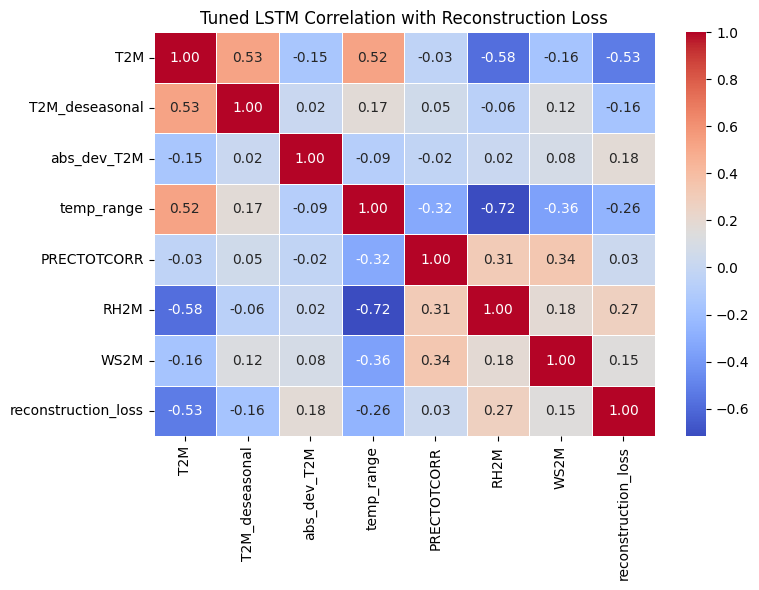

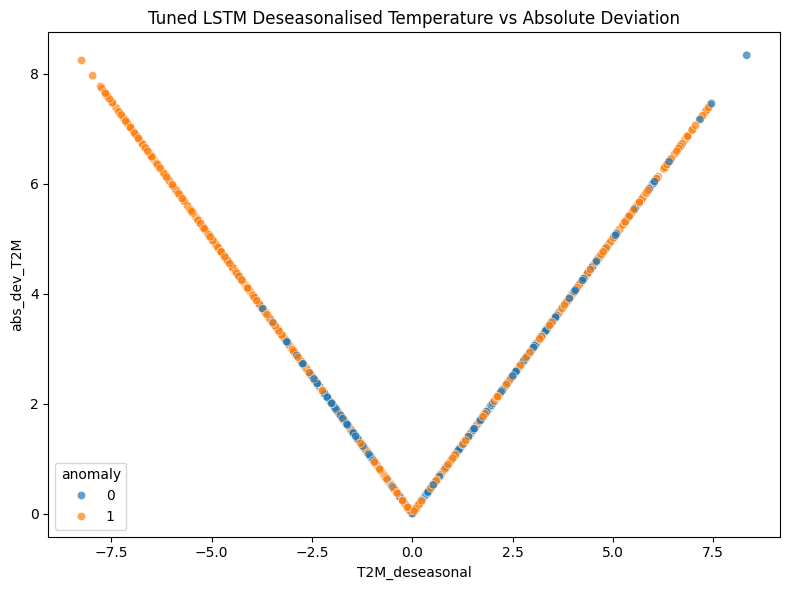

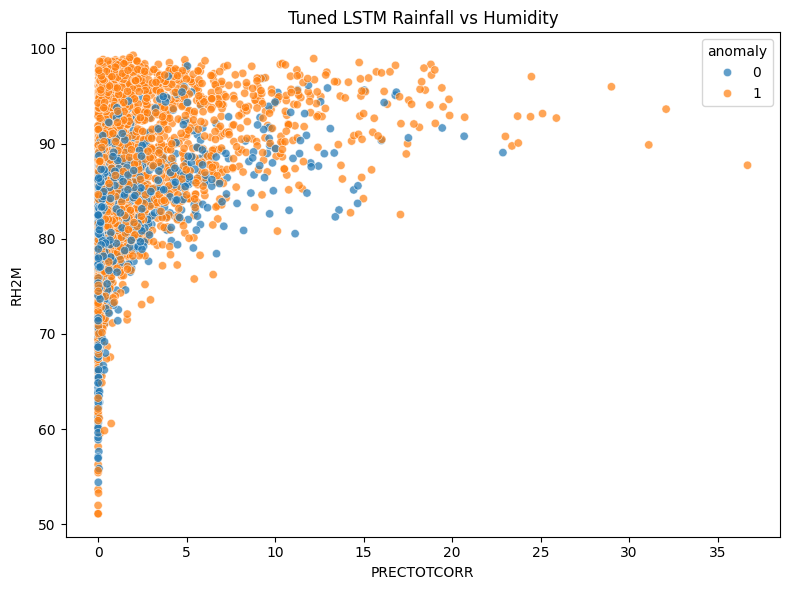

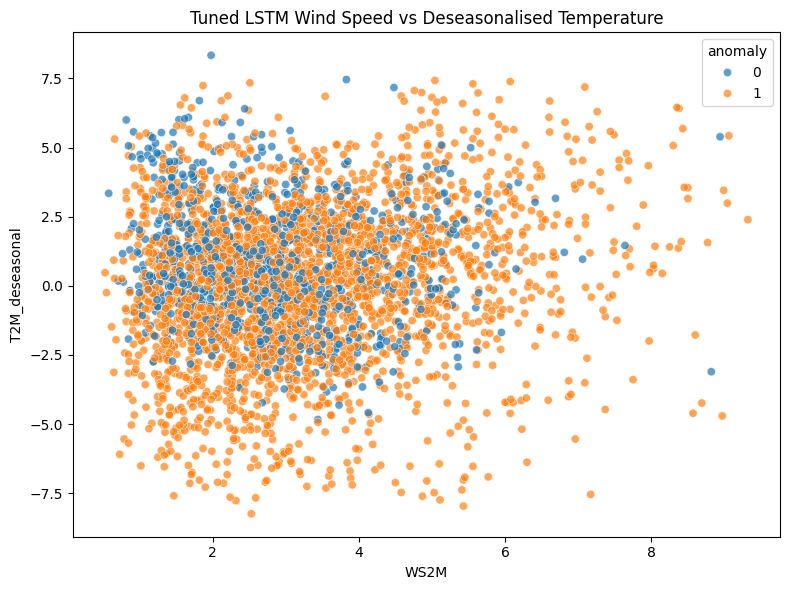

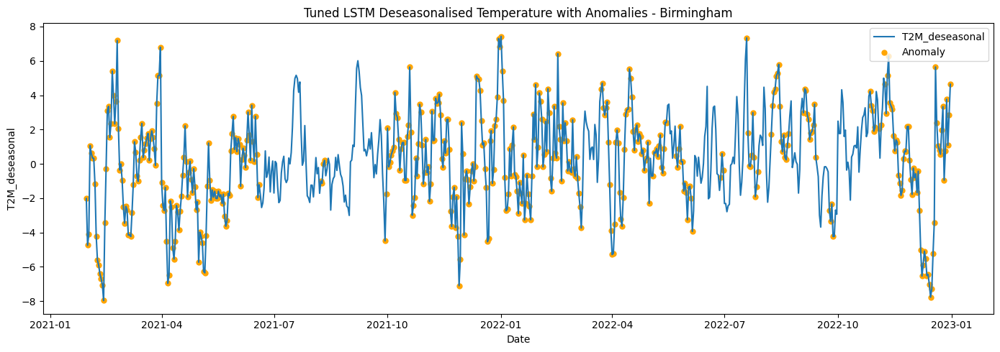

...

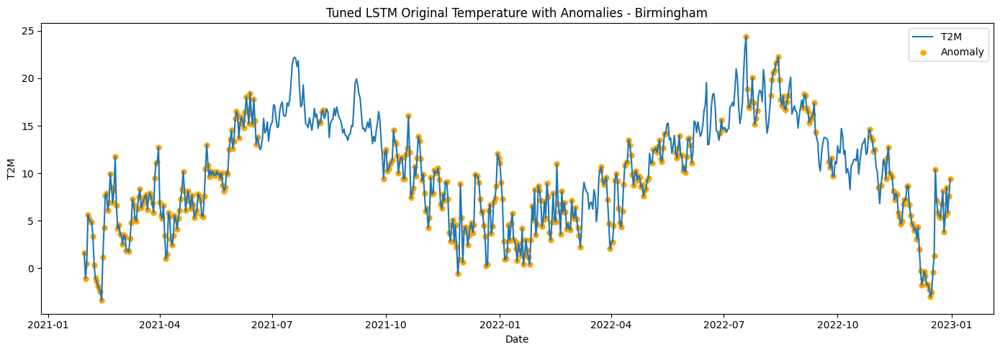

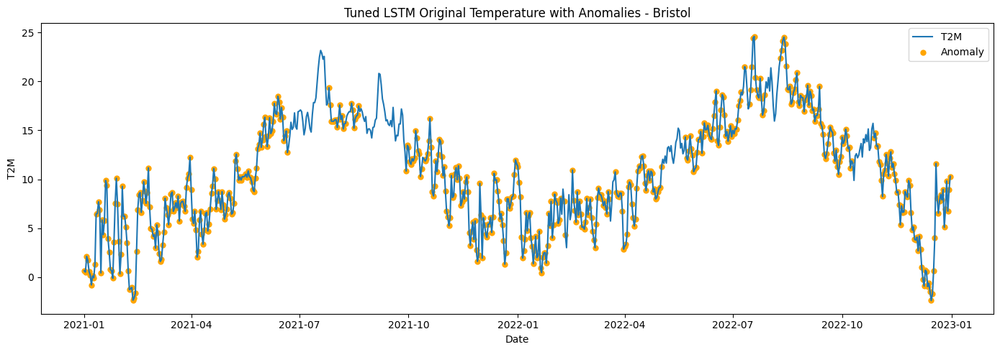

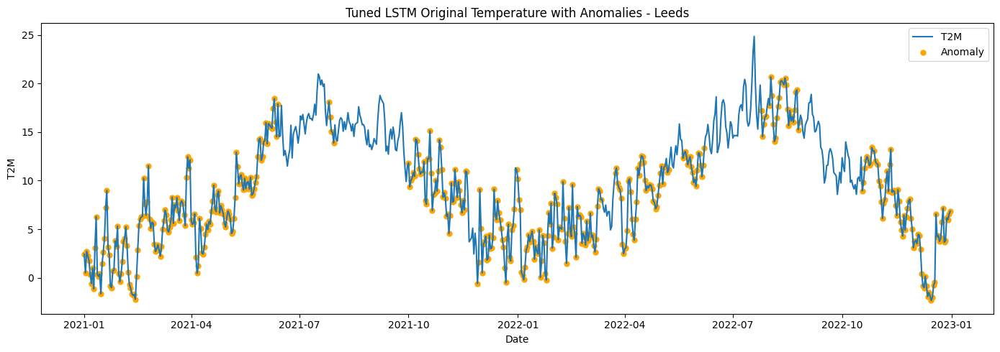

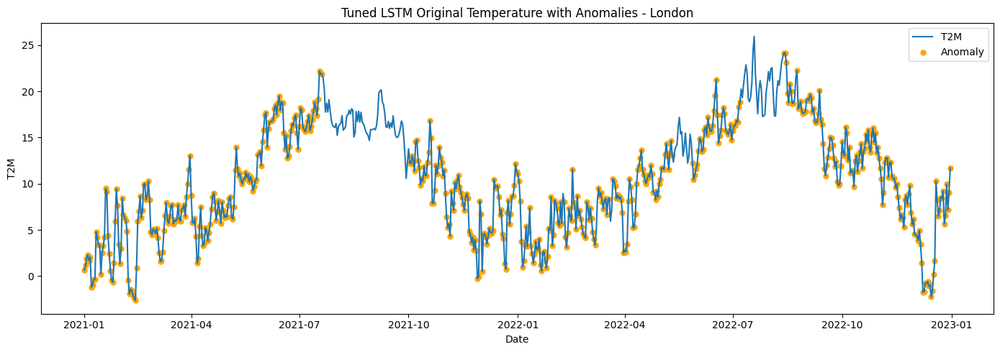

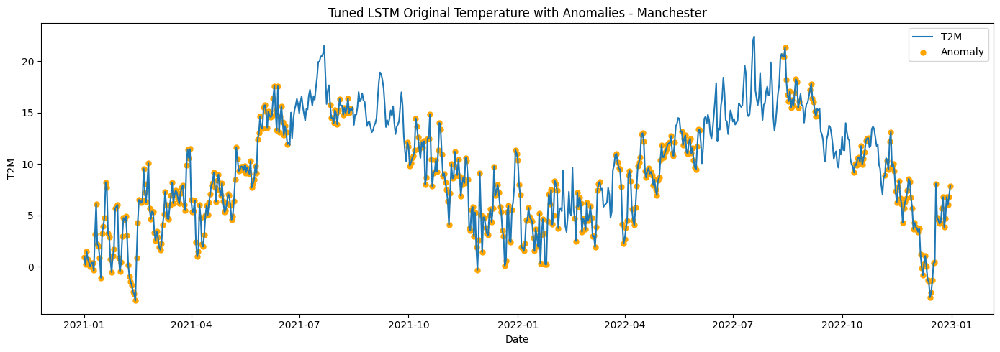

In [ ]:
# align LSTM predictions to original rows
baseline_lstm_train_aligned = train_df.iloc[SEQUENCE_LENGTH - 1:].copy().reset_index(drop=True)
baseline_lstm_test_aligned = test_df.iloc[SEQUENCE_LENGTH - 1:].copy().reset_index(drop=True)

baseline_lstm_train_aligned["reconstruction_loss"] = baseline_train_loss
baseline_lstm_train_aligned["anomaly"] = lstm_baseline_train_preds

baseline_lstm_test_aligned["reconstruction_loss"] = baseline_test_loss
baseline_lstm_test_aligned["anomaly"] = lstm_baseline_test_preds

tuned_lstm_train_aligned = train_df.iloc[SEQUENCE_LENGTH - 1:].copy().reset_index(drop=True)
tuned_lstm_test_aligned = test_df.iloc[SEQUENCE_LENGTH - 1:].copy().reset_index(drop=True)

tuned_lstm_train_aligned["reconstruction_loss"] = best_tuned_lstm_train_loss
tuned_lstm_train_aligned["anomaly"] = lstm_tuned_train_preds

tuned_lstm_test_aligned["reconstruction_loss"] = best_tuned_lstm_test_loss
tuned_lstm_test_aligned["anomaly"] = lstm_tuned_test_preds

# define model analysis dictionary
model_analysis_dict = {
    "Baseline IF": {
        "train_df": train_df_if_baseline.copy(),
        "test_df": test_df_if_baseline.copy(),
        "score_col": "anomaly_score",
        "score_label": "Anomaly Score",
        "sort_ascending": True
    },
    "Tuned IF": {
        "train_df": train_df_if_tuned.copy(),
        "test_df": test_df_if_tuned.copy(),
        "score_col": "anomaly_score",
        "score_label": "Anomaly Score",
        "sort_ascending": True
    },
    "Baseline LSTM": {
        "train_df": baseline_lstm_train_aligned.copy(),
        "test_df": baseline_lstm_test_aligned.copy(),
        "score_col": "reconstruction_loss",
        "score_label": "Reconstruction Loss",
        "sort_ascending": False
    },
    "Tuned LSTM": {
        "train_df": tuned_lstm_train_aligned.copy(),
        "test_df": tuned_lstm_test_aligned.copy(),
        "score_col": "reconstruction_loss",
        "score_label": "Reconstruction Loss",
        "sort_ascending": False
    }
}

# features for detailed analysis
analysis_features = [
    "T2M",
    "T2M_deseasonal",
    "abs_dev_T2M",
    "temp_range",
    "PRECTOTCORR",
    "RH2M",
    "WS2M"
]

# helper function for one model
def analyse_single_model(model_name, train_input_df, test_input_df, score_col, score_label, sort_ascending):
    print("model")
    print(model_name)

    print("train shape")
    print(train_input_df.shape)

    print("test shape")
    print(test_input_df.shape)

    # city-wise anomaly percentage
    city_train = (
        train_input_df.groupby("city")["anomaly"]
        .mean()
        .mul(100)
        .sort_values(ascending=False)
    )

    city_test = (
        test_input_df.groupby("city")["anomaly"]
        .mean()
        .mul(100)
        .sort_values(ascending=False)
    )

    print("train anomaly percentage by city")
    print(city_train.round(3))

    print("test anomaly percentage by city")
    print(city_test.round(3))

    city_compare = pd.DataFrame({
        "Train Anomaly %": city_train,
        "Test Anomaly %": city_test
    }).round(3)

    print("city comparison")
    print(city_compare)

    city_compare.plot(kind="bar", figsize=(10, 5))
    plt.title(f"{model_name} City-wise Anomaly Percentage")
    plt.xlabel("City")
    plt.ylabel("Anomaly Percentage")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    # year-wise anomaly percentage
    year_train = (
        train_input_df.groupby("year")["anomaly"]
        .mean()
        .mul(100)
        .reset_index()
    )
    year_train["dataset"] = "Train"

    year_test = (
        test_input_df.groupby("year")["anomaly"]
        .mean()
        .mul(100)
        .reset_index()
    )
    year_test["dataset"] = "Test"

    year_all = pd.concat([year_train, year_test], axis=0)

    print("year-wise anomaly percentage")
    print(year_all.round(3))

    plt.figure(figsize=(10, 5))
    for dataset_name in year_all["dataset"].unique():
        temp_df = year_all[year_all["dataset"] == dataset_name]
        plt.plot(temp_df["year"], temp_df["anomaly"], marker="o", label=dataset_name)
    plt.title(f"{model_name} Year-wise Anomaly Percentage")
    plt.xlabel("Year")
    plt.ylabel("Anomaly Percentage")
    plt.legend()
    plt.tight_layout()
    plt.show()

    # month-wise anomaly percentage on test set
    month_test = (
        test_input_df.groupby("month")["anomaly"]
        .mean()
        .mul(100)
        .reset_index()
    )

    print("month-wise anomaly percentage on test set")
    print(month_test.round(3))

    plt.figure(figsize=(10, 5))
    plt.plot(month_test["month"], month_test["anomaly"], marker="o")
    plt.title(f"{model_name} Month-wise Anomaly Percentage on Test Set")
    plt.xlabel("Month")
    plt.ylabel("Anomaly Percentage")
    plt.xticks(range(1, 13))
    plt.tight_layout()
    plt.show()

    # top anomaly records
    if sort_ascending:
        top_anomalies = test_input_df.sort_values(score_col, ascending=True).head(20)
    else:
        top_anomalies = test_input_df.sort_values(score_col, ascending=False).head(20)

    print("top anomaly records")
    print(
        top_anomalies[
            ["city", "date", "T2M", "T2M_deseasonal", "abs_dev_T2M", "PRECTOTCORR", "RH2M", "WS2M", score_col, "anomaly"]
        ]
    )

    # anomalous vs normal feature comparison
    group_compare = (
        test_input_df.groupby("anomaly")[analysis_features]
        .mean()
        .round(3)
    )

    print("anomalous vs normal feature means")
    print(group_compare)

    group_compare.T.plot(kind="bar", figsize=(10, 6))
    plt.title(f"{model_name} Normal vs Anomalous Feature Means")
    plt.xlabel("Feature")
    plt.ylabel("Mean Value")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    # score distribution by class
    plt.figure(figsize=(8, 5))
    for label_value in sorted(test_input_df["anomaly"].unique()):
        subset = test_input_df[test_input_df["anomaly"] == label_value]
        plt.hist(subset[score_col], bins=40, alpha=0.6, label=f"anomaly={label_value}")
    plt.title(f"{model_name} {score_label} Distribution by Class")
    plt.xlabel(score_label)
    plt.ylabel("Frequency")
    plt.legend()
    plt.tight_layout()
    plt.show()

    # overall score distribution
    plt.figure(figsize=(8, 5))
    plt.hist(train_input_df[score_col], bins=50, alpha=0.6, label="Train")
    plt.hist(test_input_df[score_col], bins=50, alpha=0.6, label="Test")
    plt.title(f"{model_name} {score_label} Distribution")
    plt.xlabel(score_label)
    plt.ylabel("Frequency")
    plt.legend()
    plt.tight_layout()
    plt.show()

    # correlation with anomaly
    corr_anomaly = test_input_df[analysis_features + ["anomaly"]].corr()

    print("correlation with anomaly")
    print(corr_anomaly.round(3))

    plt.figure(figsize=(8, 6))
    sns.heatmap(corr_anomaly, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
    plt.title(f"{model_name} Correlation with Anomaly")
    plt.tight_layout()
    plt.show()

    # correlation with score
    corr_score = test_input_df[analysis_features + [score_col]].corr()

    print("correlation with anomaly strength score")
    print(corr_score.round(3))

    plt.figure(figsize=(8, 6))
    sns.heatmap(corr_score, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
    plt.title(f"{model_name} Correlation with {score_label}")
    plt.tight_layout()
    plt.show()

    # scatter plots
    plt.figure(figsize=(8, 6))
    sns.scatterplot(
        data=test_input_df,
        x="T2M_deseasonal",
        y="abs_dev_T2M",
        hue="anomaly",
        alpha=0.7
    )
    plt.title(f"{model_name} Deseasonalised Temperature vs Absolute Deviation")
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(8, 6))
    sns.scatterplot(
        data=test_input_df,
        x="PRECTOTCORR",
        y="RH2M",
        hue="anomaly",
        alpha=0.7
    )
    plt.title(f"{model_name} Rainfall vs Humidity")
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(8, 6))
    sns.scatterplot(
        data=test_input_df,
        x="WS2M",
        y="T2M_deseasonal",
        hue="anomaly",
        alpha=0.7
    )
    plt.title(f"{model_name} Wind Speed vs Deseasonalised Temperature")
    plt.tight_layout()
    plt.show()

    # time-series anomaly overlay by city
    for city in sorted(test_input_df["city"].unique()):
        city_df = test_input_df[test_input_df["city"] == city].sort_values("date")

        plt.figure(figsize=(14, 5))
        plt.plot(city_df["date"], city_df["T2M_deseasonal"], label="T2M_deseasonal")
        anomaly_points = city_df[city_df["anomaly"] == 1]
        plt.scatter(
            anomaly_points["date"],
            anomaly_points["T2M_deseasonal"],
            color="orange",
            label="Anomaly",
            s=25
        )
        plt.title(f"{model_name} Deseasonalised Temperature with Anomalies - {city}")
        plt.xlabel("Date")
        plt.ylabel("T2M_deseasonal")
        plt.legend()
        plt.tight_layout()
        plt.show()

    # score curve by city
    for city in sorted(test_input_df["city"].unique()):
        city_df = test_input_df[test_input_df["city"] == city].sort_values("date")

        plt.figure(figsize=(14, 5))
        plt.plot(city_df["date"], city_df[score_col], label=score_label)
        anomaly_points = city_df[city_df["anomaly"] == 1]
        plt.scatter(
            anomaly_points["date"],
            anomaly_points[score_col],
            color="orange",
            label="Anomaly",
            s=25
        )
        plt.title(f"{model_name} {score_label} Curve - {city}")
        plt.xlabel("Date")
        plt.ylabel(score_label)
        plt.legend()
        plt.tight_layout()
        plt.show()

    # original temperature with anomaly overlay by city
    for city in sorted(test_input_df["city"].unique()):
        city_df = test_input_df[test_input_df["city"] == city].sort_values("date")

        plt.figure(figsize=(14, 5))
        plt.plot(city_df["date"], city_df["T2M"], label="T2M")
        anomaly_points = city_df[city_df["anomaly"] == 1]
        plt.scatter(
            anomaly_points["date"],
            anomaly_points["T2M"],
            color="orange",
            label="Anomaly",
            s=25
        )
        plt.title(f"{model_name} Original Temperature with Anomalies - {city}")
        plt.xlabel("Date")
        plt.ylabel("T2M")
        plt.legend()
        plt.tight_layout()
        plt.show()

    return {
        "city_compare": city_compare,
        "year_all": year_all,
        "month_test": month_test,
        "top_anomalies": top_anomalies,
        "group_compare": group_compare,
        "corr_anomaly": corr_anomaly,
        "corr_score": corr_score
    }

# run detailed analysis for all 4 models
all_detailed_analysis_outputs = {}

for model_name, model_info in model_analysis_dict.items():
    result_obj = analyse_single_model(
        model_name=model_name,
        train_input_df=model_info["train_df"],
        test_input_df=model_info["test_df"],
        score_col=model_info["score_col"],
        score_label=model_info["score_label"],
        sort_ascending=model_info["sort_ascending"]
    )
    all_detailed_analysis_outputs[model_name] = result_obj